In [ ]:
import time
from datetime import datetime, timedelta
from vnstock import Listing, Quote 

end_date = datetime.now()
# start_date = end_date - timedelta(days=420)

end_date_str = end_date.strftime('%Y-%m-%d')
# start_date_str = start_date.strftime('%Y-%m-%d')

list = Listing()
print(list.all_symbols())
q = list.all_symbols()
q.to_csv('E:/Project/StockVNQA_Lâm/train/all_symbols.csv')

tickers = q["ticker"]

total_tickers = 0

for i in q["ticker"]:
    try: 
        # print("Đang xử lý mã: ", i)
        quote = Quote(i)
        data = quote.history(start = '2000-01-01', end= end_date_str, interval='1D')
        data.to_csv(f'E:/Project/StockVNQA_Lâm/train/data/{i}.csv')

        time.sleep(1)  
        total_tickers += 1
    except Exception as e:
        print(f"Đã xảy ra lỗi với mã {i}: {e}")
        continue

print(f"Tổng số mã đã xử lý: {total_tickers}")

     ticker                                         organ_name
0       A32                                 Công ty Cổ phần 32
1       AAA                  Công ty Cổ phần Nhựa An Phát Xanh
2       AAH                           Công ty Cổ phần Hợp Nhất
3       AAM                    Công ty Cổ Phần Thủy Sản MeKong
4       AAS            Công ty Cổ phần Chứng khoán SmartInvest
...     ...                                                ...
1671    XPH                    Công ty Cổ phần Xà phòng Hà Nội
1672    YBC      Công ty Cổ phần Xi măng và Khoáng sản Yên Bái
1673    YBM     Công ty Cổ phần Khoáng sản Công nghiệp Yên Bái
1674    YEG                     Công ty Cổ phần Tập đoàn Yeah1
1675    YTC  Công ty Cổ phần Xuất nhập khẩu Y tế Thành phố ...

[1676 rows x 2 columns]
Đang xử lý mã:  A32
Đang xử lý mã:  AAA
Đang xử lý mã:  AAH
Đang xử lý mã:  AAM
Đang xử lý mã:  AAS
Đang xử lý mã:  AAT
Đang xử lý mã:  AAV
Đang xử lý mã:  ABA
Đã xảy ra lỗi với mã ABA: RetryError[<Future at 0x238d85678

In [38]:
from vnstock import Quote
quote = Quote(symbol='ACB', source='VCI')
df = quote.history(start='2024-01-01', end='2025-05-19', interval='1D')
df.to_csv('E:/Project/StockVNQA_Lâm/train/data/ACB.csv', index=False) # Lưu file Excel

# from vnstock import Vnstock # Nạp thư viện để sử dụng
# stock = Vnstock().stock(symbol='ACB', source='VCI') # Định nghĩa biến vnstock lưu thông tin mã chứng khoán & nguồn dữ liệu bạn sử dụng
# # CÁC DÒNG LỆNH DƯỚI ĐÂY CÓ THỂ THAY THẾ CHO PHÙ HỢP, THAM KHẢO THÊM HÀM KHÁC
# df = stock.quote.history(start='2000-01-01', end='2024-06-21', interval='1D') # Thiết lập thời gian tải dữ liệu và khung thời gian tra cứu là 1 ngày
# print(df.head()) # Hiển thị 5 dòng dữ liệu đầu tiên
# df.to_csv('gia_lich_su_ohlcv_ACB.csv', index=False) # Lưu file Excel

In [45]:
df

,time,open,high,low,close,volume,volatility,return_1d,ma5,ma10,volume_ma5,volume_ratio,target
9,2024-01-15,21.84,21.84,21.25,21.25,11725544,0.59,-0.019382,21.268,21.180,16061779.6,0.730028,21.34
10,2024-01-16,21.34,21.46,21.04,21.34,12385822,0.42,0.004235,21.336,21.260,15447751.2,0.801788,21.34
11,2024-01-17,21.38,21.67,21.29,21.34,9720759,0.38,0.000000,21.362,21.294,13869770.8,0.700859,21.50
12,2024-01-18,21.38,21.63,21.29,21.50,9616784,0.34,0.007498,21.420,21.319,13804757.8,0.696628,21.80
13,2024-01-19,21.67,21.80,21.55,21.80,12778025,0.25,0.013953,21.446,21.361,11245386.8,1.136290,22.09
...,...,...,...,...,...,...,...,...,...,...,...,...,...
333,2025-05-12,24.25,24.45,24.15,24.40,9189800,0.30,0.010352,24.140,24.080,7655580.0,1.200405,24.60
334,2025-05-13,24.55,24.70,24.45,24.60,9650200,0.25,0.008197,24.260,24.125,7899120.0,1.221680,24.80
335,2025-05-14,24.65,24.95,24.65,24.80,10919100,0.30,0.008130,24.420,24.215,8531780.0,1.279815,25.55
336,2025-05-15,25.50,25.65,25.10,25.55,24647200,0.55,0.030242,24.700,24.375,12004900.0,2.053095,25.45


1. RMSE (Root Mean Squared Error - Căn bậc hai của sai số bình phương trung bình)

Đo lường mức độ chênh lệch giữa giá trị dự đoán và giá trị thực tế
RMSE có cùng đơn vị với biến mục tiêu (VND trong trường hợp giá cổ phiếu)
Nhấn mạnh vào các lỗi lớn (do bình phương sai số)
Ví dụ: RMSE = 1,000 nghĩa là dự đoán giá cổ phiếu sai lệch khoảng 1,000 VND so với giá thực tế
Giá trị RMSE càng thấp càng tốt

2. MAE (Mean Absolute Error - Sai số tuyệt đối trung bình)

Đo lường trung bình của giá trị tuyệt đối của sai số
Cũng có cùng đơn vị với biến mục tiêu (VND)
Không phóng đại các lỗi lớn như RMSE, nên ít nhạy cảm với các giá trị ngoại lai
Dễ diễn giải: MAE = 800 có nghĩa là trung bình mô hình dự đoán sai 800 VND mỗi lần
Giá trị MAE càng thấp càng tốt

3. R² (Hệ số xác định)

Thể hiện tỷ lệ phần trăm biến thiên của giá cổ phiếu được giải thích bởi mô hình
Dao động từ 0 đến 1 (có thể âm nếu mô hình rất kém)
R² = 0.7 nghĩa là mô hình giải thích được 70% biến động của giá cổ phiếu
R² = 0 nghĩa là mô hình không giải thích được biến động nào của giá (tương đương dự đoán bằng giá trung bình)
R² = 1 nghĩa là mô hình dự đoán chính xác 100% các giá trị
Giá trị R² càng gần 1 càng tốt

Ứng dụng thực tế:

RMSE và MAE thấp, R² cao: Mô hình dự đoán tốt, đáng tin cậy để đưa ra quyết định đầu tư

RMSE và MAE cao, R² thấp: Mô hình cần cải thiện, không nên dựa vào để đưa ra quyết định quan trọng

MAE < RMSE nhiều: Có các giá trị ngoại lai làm tăng RMSE, có thể cần xử lý outliers

Khi đánh giá mô hình dự đoán giá cổ phiếu, việc kết hợp cả ba chỉ số sẽ cho bạn cái nhìn toàn diện về hiệu suất mô hình hơn là chỉ dùng một chỉ số.

(3676, 10) (919, 10) (3676,) (919,)
✅ RMSE trên tập test: 2.1790
✅ MAE trên tập test: 1.4723
✅ R² trên tập test: 0.6035


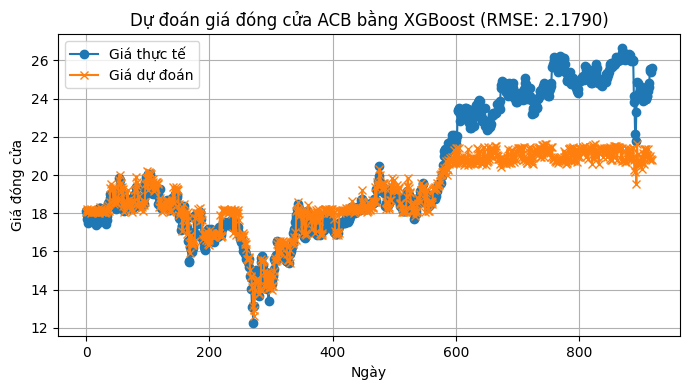


🎯 Dự đoán giá đóng cửa ACB ngày tiếp theo: 20.80 VND


In [1]:
# ======= BƯỚC 1: IMPORT THƯ VIỆN =======
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score, mean_absolute_error

# # ======= BƯỚC 2: ĐỌC FILE CSV =======
df = pd.read_csv("E:/Project/StockVNQA_Lâm/train/data/ACB.csv")

# ======= BƯỚC 3: TẠO FEATURES =======
df['volatility'] = df['high'] - df['low']                         # Biên độ dao động
df['return_1d'] = df['close'].pct_change()                        # Tỷ lệ thay đổi giá
df['ma5'] = df['close'].rolling(window=5).mean()                  # Trung bình 5 phiên
df['ma10'] = df['close'].rolling(window=10).mean()                # Trung bình 10 phiên
df['volume_ma5'] = df['volume'].rolling(window=5).mean()
df['volume_ratio'] = df['volume'] / df['volume_ma5']              # Thanh khoản tương đối

# ======= BƯỚC 4: TẠO TARGET =======
df['target'] = df['close'].shift(-1)                              # Giá đóng cửa ngày hôm sau

# ======= BƯỚC 5: XỬ LÝ DỮ LIỆU MẤT (NaN) =======
df.dropna(inplace=True)

# ======= BƯỚC 6: TÁCH DỮ LIỆU HUẤN LUYỆN =======
features = ['open', 'high', 'low', 'close', 'volume', 'volatility', 
            'return_1d', 'ma5', 'ma10', 'volume_ratio']

X = df[features]
y = df['target']

X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=False, test_size=0.2)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)
# ======= BƯỚC 7: HUẤN LUYỆN MÔ HÌNH XGBOOST =======
model = xgb.XGBRegressor(n_estimators=300, max_depth=2, learning_rate=0.1)
model.fit(X_train, y_train)

# ======= BƯỚC 8: DỰ ĐOÁN & ĐÁNH GIÁ =======
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"✅ RMSE trên tập test: {rmse:.4f}")
print(f"✅ MAE trên tập test: {mae:.4f}")
print(f"✅ R² trên tập test: {r2:.4f}")

# ======= BƯỚC 9: VẼ BIỂU ĐỒ GIÁ DỰ ĐOÁN VS THỰC TẾ =======
plt.figure(figsize=(7, 4))
plt.plot(y_test.values, label='Giá thực tế', marker='o')
plt.plot(y_pred, label='Giá dự đoán', marker='x')
plt.title(f'Dự đoán giá đóng cửa ACB bằng XGBoost (RMSE: {rmse:.4f})')
plt.xlabel('Ngày')
plt.ylabel('Giá đóng cửa')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# ======= BƯỚC 10: DỰ ĐOÁN GIÁ NGÀY TIẾP THEO =======
latest = df.iloc[-1:].copy()
X_future = latest[features]
predicted_price_tomorrow = model.predict(X_future)[0]

print(f"\n🎯 Dự đoán giá đóng cửa ACB ngày tiếp theo: {predicted_price_tomorrow:.2f} VND")


Tìm thấy 1628 mã chứng khoán


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_26824\3290900218.py:36: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  df['return_1d'] = df['close'].pct_change()
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_26824\3290900218.py:36: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  df['return_1d'] = df['close'].pct_change()
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_26824\3290900218.py:36: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' 


=== KẾT QUẢ TỔNG HỢP ===
Tổng số mã xử lý thành công: 1574
R² trung bình: 0.4395
RMSE trung bình: 2.4661
MAE trung bình: 1.7460

--- THỐNG KÊ SỐ NGÀY ---
Số ngày trung bình mỗi mã: 2301.5
Số ngày train trung bình: 1840.8
Số ngày test trung bình: 460.7

--- TỔNG SỐ NGÀY ---
Tổng số ngày dữ liệu: 3,622,589
Tổng số ngày train: 2,897,456
Tổng số ngày test: 725,133

--- PHÂN PHỐI DỮ LIỆU ---
Phân phối số ngày mỗi mã:
count    1574.000000
mean     2301.517789
std      1353.698120
min        35.000000
25%      1185.000000
50%      2071.500000
75%      3535.250000
max      6019.000000
Name: total_days, dtype: float64


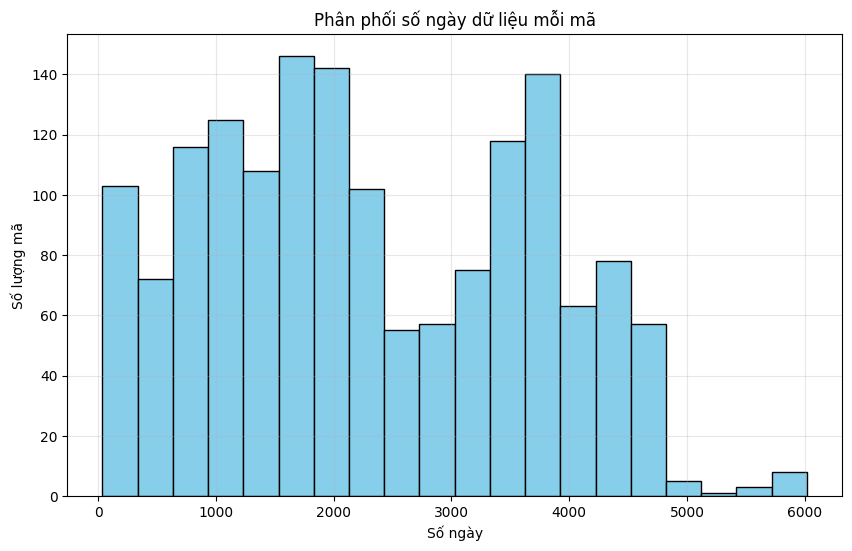

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score, mean_absolute_error

def train(ticker):
    try:
        # 1. Đọc dữ liệu
        # print(f"\n--- Đang xử lý {ticker} ---")
        df = pd.read_csv(f"E:/Project/StockVNQA_Lâm/train/data/{ticker}.csv")
        
        # 2. Kiểm tra và chuyển đổi kiểu dữ liệu nếu cần
        numeric_columns = ['open', 'high', 'low', 'close', 'volume']
        for col in numeric_columns:
            if col in df.columns:
                if df[col].dtype == 'object':
                    # print(f"⚠️ {ticker}: Chuyển đổi cột {col} từ kiểu chuỗi sang số")
                    try:
                        df[col] = df[col].str.replace(',', '').astype(float)
                    except Exception as e:
                        # print(f"⚠️ {ticker}: Không thể chuyển đổi cột {col}: {str(e)}")
                        return None
        
        # 3. Kiểm tra số lượng dữ liệu ban đầu
        if len(df) < 50:
            # print(f"⚠️ Bỏ qua {ticker}: Dữ liệu quá ít ({len(df)} dòng)")
            return None
        
        # 4. Tạo features
        try:
            df['volatility'] = df['high'] - df['low']
            df['return_1d'] = df['close'].pct_change()
            df['ma5'] = df['close'].rolling(window=5).mean()
            df['ma10'] = df['close'].rolling(window=10).mean()
            df['volume_ma5'] = df['volume'].rolling(window=5).mean()
            
            # Xử lý an toàn cho volume_ratio
            df['volume_ratio'] = np.where(
                df['volume_ma5'] > 0, 
                df['volume'] / df['volume_ma5'], 
                np.nan  # Đánh dấu là NaN khi chia cho 0
            )
            
            # Target
            df['target'] = df['close'].shift(-1)
        except Exception as e:
            # print(f"❌ Lỗi khi tính toán features cho {ticker}: {str(e)}")
            return None
        
        # 5. Xử lý NaN và vô cực
        original_len = len(df)
        df = df.replace([np.inf, -np.inf], np.nan)
        df.dropna(inplace=True)
        
        # if len(df) < original_len:
        #     print(f"⚠️ {ticker}: Đã loại bỏ {original_len - len(df)} hàng chứa NaN hoặc giá trị vô cực")
        
        # 6. Kiểm tra số lượng dữ liệu sau xử lý
        if len(df) < 30:
            # print(f"⚠️ Bỏ qua {ticker}: Dữ liệu còn lại sau xử lý quá ít ({len(df)} dòng)")
            return None
            
        # 7. Chuẩn bị dữ liệu để huấn luyện
        features = ['open', 'high', 'low', 'close', 'volume', 'volatility', 
                   'return_1d', 'ma5', 'ma10', 'volume_ratio']
        
        X = df[features]
        y = df['target']
        
        # 8. Phân chia dữ liệu train/test
        X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=False, test_size=0.2)
        # print(f"Mã {ticker}: Train {X_train.shape[0]} mẫu, Test {X_test.shape[0]} mẫu")
        
        # 9. Huấn luyện mô hình XGBoost
        # Best parameters: {'colsample_bytree': 0.8, 'gamma': 0.1, 'learning_rate': 0.05, 'max_depth': 2, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.8}
        model = xgb.XGBRegressor(n_estimators=300, max_depth=2, learning_rate=0.05,
                                 colsample_bytree=0.8, gamma=0.1, min_child_weight=3, subsample=0.8)
        model.fit(X_train, y_train)
        
        # 10. Đánh giá mô hình
        y_pred = model.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        # try: 
        #     r2 = r2_score(y_test, y_pred)
        #     if r2 < -10:
        #         print(f"⚠️ {ticker}: R² quá thấp ({r2:.4f}), có thể do dữ liệu không đủ hoặc mô hình không phù hợp")
        #         r2 = -1
        # except Exception as e:
        #     print(f"⚠️ {ticker}: Không thể tính R²: {str(e)}")
        #     r2 = -1
        if r2 < -10:
            return None
        # 11. Tính toán dự đoán hướng (tăng/giảm)
        y_direction_true = (y_test.values > X_test['close'].values).astype(int)
        y_direction_pred = (y_pred > X_test['close'].values).astype(int)
        direction_accuracy = np.mean(y_direction_true == y_direction_pred)
        
        # print(f"✅ {ticker} - RMSE: {rmse:.4f}, R²: {r2:.4f}, Direction Accuracy: {direction_accuracy:.4f}")
        
        # 12. Dự đoán giá cho ngày tiếp theo
        latest = df.iloc[-1:].copy()
        X_future = latest[features]
        predicted_price_tomorrow = model.predict(X_future)[0]
        current_price = df['close'].iloc[-1]
        change_pct = (predicted_price_tomorrow - current_price) / current_price * 100
        
        if change_pct > 0:
            trend = "🔼 TĂNG"
        else:
            trend = "🔽 GIẢM"
            
        # print(f"🎯 {ticker} - Hiện tại: {current_price:.2f}, Dự đoán: {predicted_price_tomorrow:.2f}, {trend}: {change_pct:.2f}%")
        
        # 13. Trả về kết quả đầy đủ
        return {
            'ticker': ticker,
            'total_days': len(df),
            'train_days': len(X_train),
            'test_days': len(X_test),
            'rows_removed': original_len - len(df),
            'rmse': rmse,
            'mae': mae,
            'r2': r2,
            'direction_accuracy': direction_accuracy,
            'current_price': current_price,
            'predicted_price': predicted_price_tomorrow,
            'change_pct': change_pct,
            'trend': 'UP' if change_pct > 0 else 'DOWN'
        }
        
    except Exception as e:
        print(f"❌ Lỗi xử lý {ticker}: {str(e)}")
        print(f"Chi tiết lỗi: {type(e).__name__}")
        # In ra traceback để biết lỗi xảy ra ở dòng nào
        import traceback
        traceback.print_exc()
        return None


data_path = "E:/Project/StockVNQA_Lâm/train/data/"
all_files = os.listdir(data_path)
csv_files = [f.replace('.csv', '') for f in all_files if f.endswith('.csv') and f != 'all_symbols.csv']

results = []
print(f"Tìm thấy {len(csv_files)} mã chứng khoán")

for ticker in csv_files:
    # print(f"\n--- Đang xử lý {ticker} ---")
    result = train(ticker)
    if result:
        results.append(result)
        
# Tạo DataFrame từ kết quả
result_df = pd.DataFrame(results)

# Hiển thị kết quả tổng hợp chi tiết
print("\n=== KẾT QUẢ TỔNG HỢP ===")
print(f"Tổng số mã xử lý thành công: {len(result_df)}")

# Thống kê về độ chính xác của mô hình
print(f"R² trung bình: {result_df['r2'].mean():.4f}")
print(f"RMSE trung bình: {result_df['rmse'].mean():.4f}")
print(f"MAE trung bình: {result_df['mae'].mean():.4f}")

# Thống kê về số ngày
print("\n--- THỐNG KÊ SỐ NGÀY ---")
print(f"Số ngày trung bình mỗi mã: {result_df['total_days'].mean():.1f}")
print(f"Số ngày train trung bình: {result_df['train_days'].mean():.1f}")
print(f"Số ngày test trung bình: {result_df['test_days'].mean():.1f}")

# Tổng số ngày dữ liệu
print("\n--- TỔNG SỐ NGÀY ---")
print(f"Tổng số ngày dữ liệu: {result_df['total_days'].sum():,}")
print(f"Tổng số ngày train: {result_df['train_days'].sum():,}")
print(f"Tổng số ngày test: {result_df['test_days'].sum():,}")

# Thông kê về phân phối dữ liệu
print("\n--- PHÂN PHỐI DỮ LIỆU ---")
print("Phân phối số ngày mỗi mã:")
print(result_df['total_days'].describe())

# Hiển thị biểu đồ phân phối số ngày
plt.figure(figsize=(10, 6))
plt.hist(result_df['total_days'], bins=20, color='skyblue', edgecolor='black')
plt.title('Phân phối số ngày dữ liệu mỗi mã')
plt.xlabel('Số ngày')
plt.ylabel('Số lượng mã')
plt.grid(True, alpha=0.3)
plt.show()



=== KẾT QUẢ TỔNG HỢP ===
Tổng số mã xử lý thành công: 1574
R² trung bình: 0.4395
RMSE trung bình: 2.4661
Độ chính xác dự đoán hướng trung bình: 0.5554

--- THỐNG KÊ SỐ NGÀY ---
Số ngày trung bình mỗi mã: 2301.5
Số ngày train trung bình: 1840.8
Số ngày test trung bình: 460.7

=== TOP 10 MÃ DỰ ĐOÁN TỐT NHẤT (R² CAO NHẤT) ===
     ticker        r2      rmse  direction_accuracy  change_pct
386     DTL  0.995941  0.510181            0.518934   -0.295512
1337    TSC  0.995490  0.286543            0.521095    1.105594
1348    TTF  0.995270  0.237927            0.508731    1.977152
1401    VC2  0.995099  1.003920            0.450221    2.338163
1063    S27  0.995090  0.133949            0.312500   19.049634
1237    TBX  0.994572  0.323946            0.360360   -0.476847
598     HTL  0.994258  0.526487            0.542899    0.906428
1187    SRA  0.993836  0.223895            0.472569    0.088108
677     KMR  0.993791  0.125911            0.521998   -0.317755
279     CVN  0.993694  0.245409   

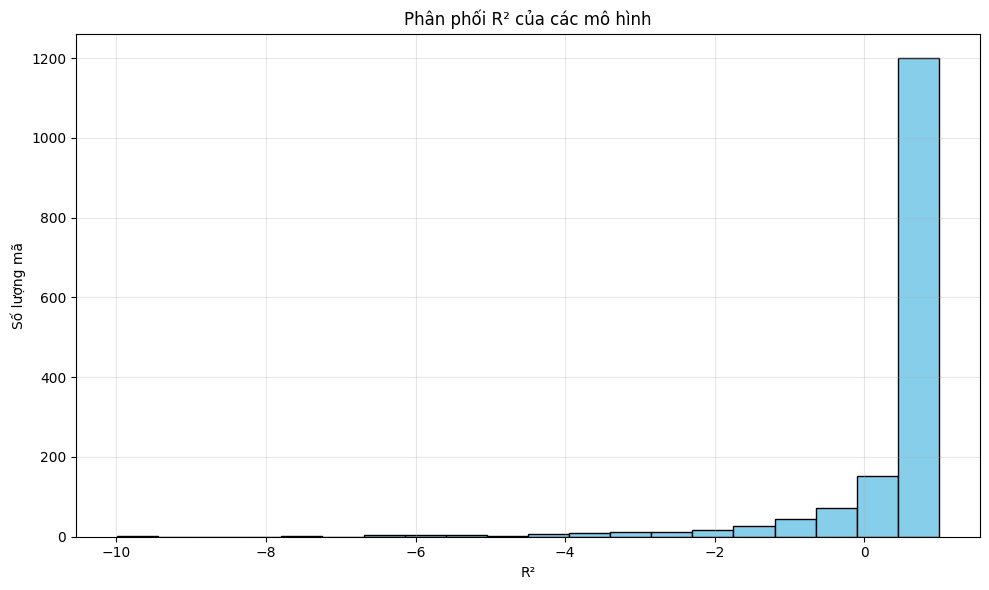

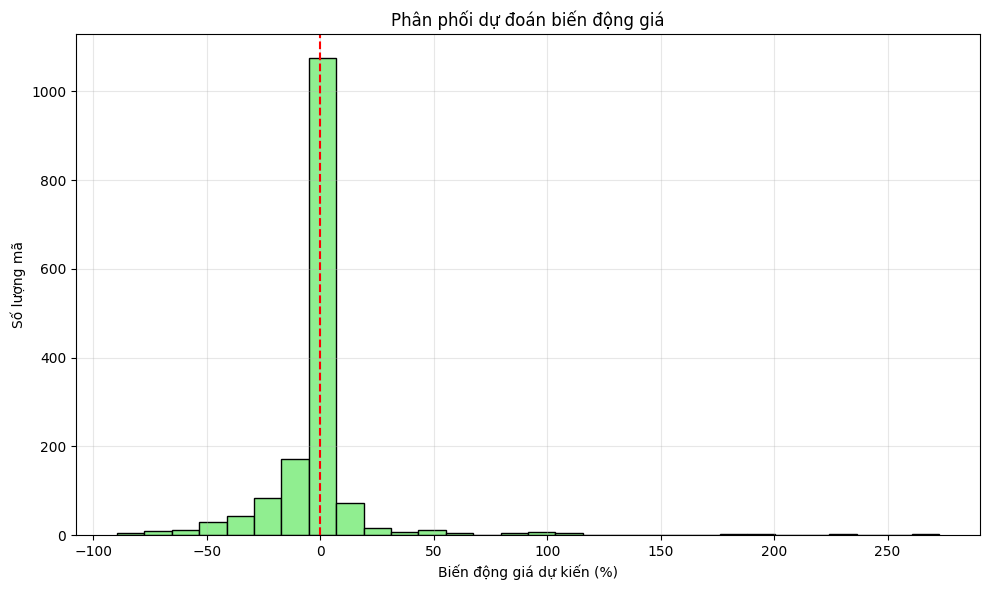

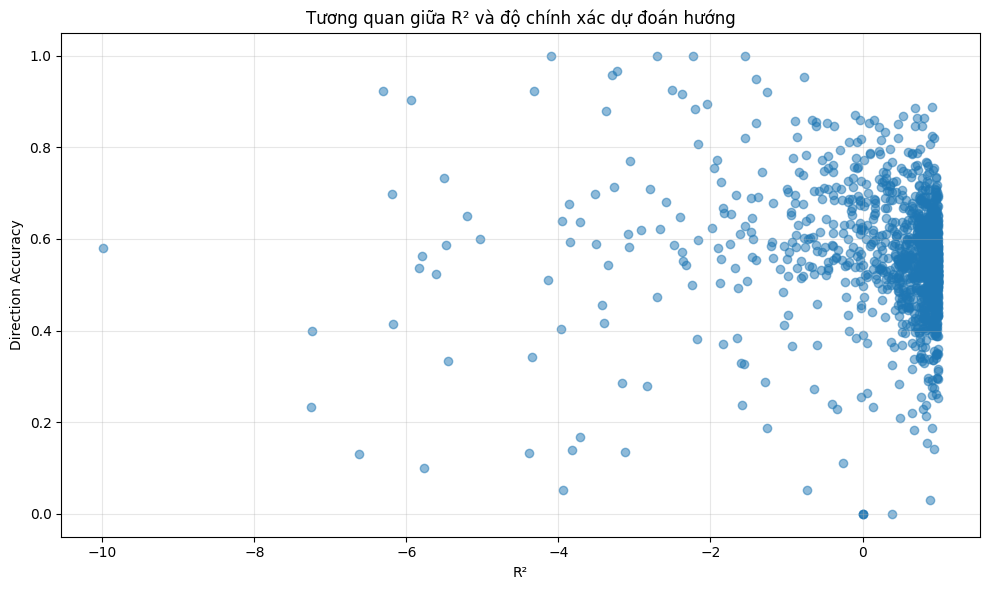

In [3]:
# Hiển thị kết quả tổng hợp
print("\n=== KẾT QUẢ TỔNG HỢP ===")
print(f"Tổng số mã xử lý thành công: {len(result_df)}")
print(f"R² trung bình: {result_df['r2'].mean():.4f}")
print(f"RMSE trung bình: {result_df['rmse'].mean():.4f}")
print(f"Độ chính xác dự đoán hướng trung bình: {result_df['direction_accuracy'].mean():.4f}")

# Thống kê về số ngày
print("\n--- THỐNG KÊ SỐ NGÀY ---")
print(f"Số ngày trung bình mỗi mã: {result_df['total_days'].mean():.1f}")
print(f"Số ngày train trung bình: {result_df['train_days'].mean():.1f}")
print(f"Số ngày test trung bình: {result_df['test_days'].mean():.1f}")

# Top 10 mã có R² cao nhất
print("\n=== TOP 10 MÃ DỰ ĐOÁN TỐT NHẤT (R² CAO NHẤT) ===")
print(result_df.sort_values('r2', ascending=False)[['ticker', 'r2', 'rmse', 'direction_accuracy', 'change_pct']].head(10))
print(result_df.sort_values('r2', ascending=False)[['ticker']].head(10))

# Top 10 mã có R² thấp nhất
print("\n=== TOP 10 MÃ DỰ ĐOÁN KÉM NHẤT (R² THẤP NHẤT) ===")
print(result_df.sort_values('r2', ascending=True)[['ticker', 'r2', 'rmse', 'direction_accuracy', 'change_pct']].head(10))
print(result_df.sort_values('r2', ascending=True)[['ticker']].head(10))

# Top 10 mã dự đoán tăng mạnh nhất
print("\n=== TOP 10 MÃ DỰ ĐOÁN TĂNG MẠNH NHẤT ===")
rising_stocks = result_df[result_df['trend'] == 'UP'].sort_values('change_pct', ascending=False)
print(rising_stocks[['ticker', 'change_pct', 'r2', 'direction_accuracy', 'current_price', 'predicted_price']].head(10))


# Top 10 mã dự đoán giảm mạnh nhất
print("\n=== TOP 10 MÃ DỰ ĐOÁN GIẢM MẠNH NHẤT ===")
falling_stocks = result_df[result_df['trend'] == 'DOWN'].sort_values('change_pct')
print(falling_stocks[['ticker', 'change_pct', 'r2', 'direction_accuracy', 'current_price', 'predicted_price']].head(10))

# Top 10 mã có RMSE cao nhất (dự đoán lệch nhất)
print("\n=== TOP 10 MÃ CÓ SAI SỐ LỚN NHẤT (RMSE CAO NHẤT) ===")
print(result_df.sort_values('rmse', ascending=False)[['ticker', 'rmse', 'r2', 'direction_accuracy', 'change_pct']].head(10))
print(result_df.sort_values('rmse', ascending=False)[['ticker']].head(10))

# Top 10 mã có RMSE thấp nhất (dự đoán chuẩn nhất)
print("\n=== TOP 10 MÃ CÓ SAI SỐ THẤP NHẤT (RMSE THẤP NHẤT) ===")
print(result_df.sort_values('rmse', ascending=True)[['ticker', 'rmse', 'r2', 'direction_accuracy', 'change_pct']].head(10))
print(result_df.sort_values('rmse', ascending=True)[['ticker']].head(10))


# Top 10 mã có direction accuracy thấp nhất
print("\n=== TOP 10 MÃ DỰ ĐOÁN HƯỚNG CHÍNH XÁC THẤP NHẤT ===")
print(result_df.sort_values('direction_accuracy', ascending=True)[['ticker', 'direction_accuracy', 'r2', 'rmse', 'change_pct']].head(10))


# Top 10 mã có direction accuracy cao nhất
print("\n=== TOP 10 MÃ DỰ ĐOÁN HƯỚNG CHÍNH XÁC THẤP NHẤT ===")
print(result_df.sort_values('direction_accuracy', ascending=False)[['ticker', 'direction_accuracy', 'r2', 'rmse', 'change_pct']].head(10))


# Lưu kết quả ra file CSV
result_df.to_csv("E:/Project/StockVNQA_Lâm/train/prediction_results.csv", index=False)
print("\nĐã lưu kết quả vào file prediction_results.csv")

# Vẽ biểu đồ phân phối R²
plt.figure(figsize=(10, 6))
plt.hist(result_df['r2'], bins=20, color='skyblue', edgecolor='black')
plt.title('Phân phối R² của các mô hình')
plt.xlabel('R²')
plt.ylabel('Số lượng mã')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("E:/Project/StockVNQA_Lâm/train/r2_distribution.png")
plt.show()

# Vẽ biểu đồ phân phối dự đoán biến động giá
plt.figure(figsize=(10, 6))
plt.hist(result_df['change_pct'], bins=30, color='lightgreen', edgecolor='black')
plt.title('Phân phối dự đoán biến động giá')
plt.xlabel('Biến động giá dự kiến (%)')
plt.ylabel('Số lượng mã')
plt.axvline(x=0, color='red', linestyle='--')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("E:/Project/StockVNQA_Lâm/train/price_change_distribution.png")
plt.show()

# Vẽ biểu đồ tương quan giữa R² và direction accuracy
plt.figure(figsize=(10, 6))
plt.scatter(result_df['r2'], result_df['direction_accuracy'], alpha=0.5)
plt.title('Tương quan giữa R² và độ chính xác dự đoán hướng')
plt.xlabel('R²')
plt.ylabel('Direction Accuracy')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("E:/Project/StockVNQA_Lâm/train/r2_vs_direction_accuracy.png")
plt.show()


In [4]:
# Create a function to save tickers to file
def save_tickers_to_file(tickers_list, filename, base_path="E:/Project/StockVNQA_Lâm/train/"):
    """Save a list of tickers to a file"""
    file_path = os.path.join(base_path, filename)
    with open(file_path, 'w') as f:
        for ticker in tickers_list:
            f.write(f"{ticker}\n")
    print(f"Saved {len(tickers_list)} tickers to {file_path}")
    return tickers_list

# Collect all top and bottom tickers 
ticker_categories = {
    'top_r2': result_df.sort_values('r2', ascending=False)['ticker'].head(10).tolist(),
    'bottom_r2': result_df.sort_values('r2', ascending=True)['ticker'].head(10).tolist(),
    'highest_rise': rising_stocks['ticker'].head(10).tolist(),
    'highest_fall': falling_stocks['ticker'].head(10).tolist(),
    'highest_rmse': result_df.sort_values('rmse', ascending=False)['ticker'].head(10).tolist(),
    'lowest_rmse': result_df.sort_values('rmse', ascending=True)['ticker'].head(10).tolist(),
    'lowest_dir_accuracy': result_df.sort_values('direction_accuracy', ascending=True)['ticker'].head(10).tolist(),
    'highest_dir_accuracy': result_df.sort_values('direction_accuracy', ascending=False)['ticker'].head(10).tolist()
}

# Save each category to its own file
for category, tickers in ticker_categories.items():
    save_tickers_to_file(tickers, f"{category}_tickers.txt")

# Create a unified list of all unique tickers
all_tickers = []
for tickers in ticker_categories.values():
    all_tickers.extend(tickers)
    
# Remove duplicates while preserving order
unique_tickers = []
seen = set()
for ticker in all_tickers:
    if ticker not in seen:
        unique_tickers.append(ticker)
        seen.add(ticker)

# Save the combined unique list
save_tickers_to_file(unique_tickers, "all_significant_tickers.txt")

# Print summary
print(f"\n=== SUMMARY OF SAVED TICKER LISTS ===")
print(f"Total unique tickers across all categories: {len(unique_tickers)}")
for category, tickers in ticker_categories.items():
    print(f"{category}: {len(tickers)} tickers")

# Create a dictionary with ticker data for further analysis
ticker_data = {}
for category, ticker_list in ticker_categories.items():
    for ticker in ticker_list:
        if ticker not in ticker_data:
            ticker_data[ticker] = {'categories': []}
        ticker_data[ticker]['categories'].append(category)

# Find tickers that appear in multiple categories
multi_category_tickers = {ticker: data for ticker, data in ticker_data.items() if len(data['categories']) > 1}
print(f"\n=== TICKERS APPEARING IN MULTIPLE CATEGORIES ({len(multi_category_tickers)}) ===")
for ticker, data in multi_category_tickers.items():
    print(f"{ticker}: {', '.join(data['categories'])}")

# Create a CSV file with all the significant tickers and their metrics
significant_df = result_df[result_df['ticker'].isin(unique_tickers)].copy()
significant_df['categories'] = significant_df['ticker'].map(lambda x: ', '.join(ticker_data.get(x, {}).get('categories', [])))
significant_df.to_csv("E:/Project/StockVNQA_Lâm/train/significant_tickers_metrics.csv", index=False)
print(f"\nSaved detailed metrics for {len(significant_df)} significant tickers to significant_tickers_metrics.csv")

# Save as Python dictionary too for easy import in other scripts
import json
with open("E:/Project/StockVNQA_Lâm/train/ticker_categories.json", 'w') as f:
    json.dump(ticker_categories, f, indent=4)
print("Saved ticker categories as JSON for easy importing in other scripts")


Saved 10 tickers to E:/Project/StockVNQA_Lâm/train/top_r2_tickers.txt
Saved 10 tickers to E:/Project/StockVNQA_Lâm/train/bottom_r2_tickers.txt
Saved 10 tickers to E:/Project/StockVNQA_Lâm/train/highest_rise_tickers.txt
Saved 10 tickers to E:/Project/StockVNQA_Lâm/train/highest_fall_tickers.txt
Saved 10 tickers to E:/Project/StockVNQA_Lâm/train/highest_rmse_tickers.txt
Saved 10 tickers to E:/Project/StockVNQA_Lâm/train/lowest_rmse_tickers.txt
Saved 10 tickers to E:/Project/StockVNQA_Lâm/train/lowest_dir_accuracy_tickers.txt
Saved 10 tickers to E:/Project/StockVNQA_Lâm/train/highest_dir_accuracy_tickers.txt
Saved 70 tickers to E:/Project/StockVNQA_Lâm/train/all_significant_tickers.txt

=== SUMMARY OF SAVED TICKER LISTS ===
Total unique tickers across all categories: 70
top_r2: 10 tickers
bottom_r2: 10 tickers
highest_rise: 10 tickers
highest_fall: 10 tickers
highest_rmse: 10 tickers
lowest_rmse: 10 tickers
lowest_dir_accuracy: 10 tickers
highest_dir_accuracy: 10 tickers

=== TICKERS APPE

Tìm thấy 1628 mã chứng khoán


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15856\1561289690.py:41: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  df['return_1d'] = df['close'].pct_change()
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15856\1561289690.py:41: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  df['return_1d'] = df['close'].pct_change()
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15856\1561289690.py:41: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' 


=== KẾT QUẢ TỔNG HỢP ===
Tổng số mã xử lý thành công: 1480
R² trung bình: 0.0189
RMSE trung bình: 1.7131
MAE trung bình: 1.3118

--- THỐNG KÊ SỐ NGÀY ---
Số ngày trung bình mỗi mã: 300.0
Số ngày train trung bình: 240.0
Số ngày test trung bình: 60.0

--- TỔNG SỐ NGÀY ---
Tổng số ngày dữ liệu: 444,000
Tổng số ngày train: 355,200
Tổng số ngày test: 88,800

--- PHÂN PHỐI DỮ LIỆU ---
Phân phối số ngày mỗi mã:
count    1480.0
mean      300.0
std         0.0
min       300.0
25%       300.0
50%       300.0
75%       300.0
max       300.0
Name: data_days, dtype: float64


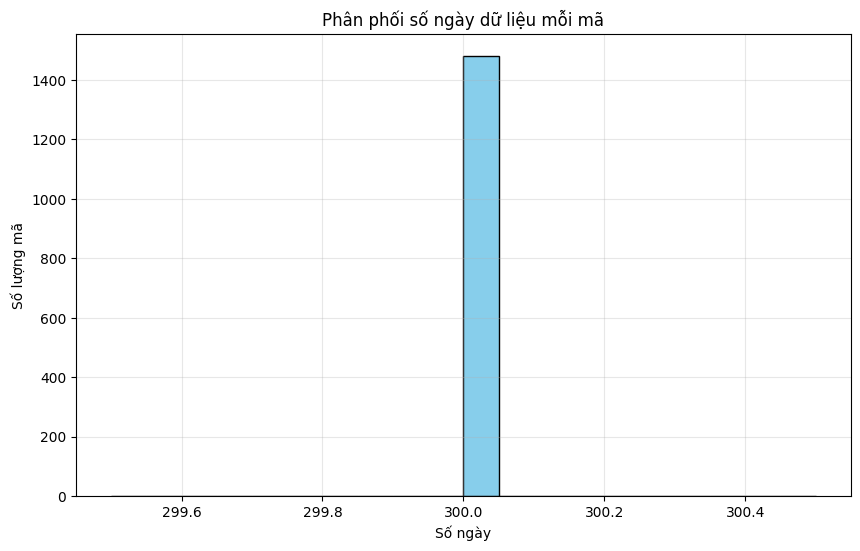

In [20]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score, mean_absolute_error

def train_with_data_size(ticker, num_days=300, test_size=0.2):
    """
    Train mô hình XGBoost với số ngày dữ liệu được chỉ định
    
    Args:
        ticker (str): Mã cổ phiếu
        num_days (int): Số ngày dữ liệu muốn sử dụng
        test_size (float): Tỷ lệ dữ liệu test (0-1)
        
    Returns:
        dict: Kết quả train và đánh giá mô hình
    """
    try:
        # 1. Đọc dữ liệu
        # print(f"\n--- Đang xử lý {ticker} với {num_days} ngày dữ liệu ---")
        df = pd.read_csv(f"E:/Project/StockVNQA_Lâm/train/data/{ticker}.csv")
        
        # 2. Kiểm tra và chuyển đổi kiểu dữ liệu nếu cần
        numeric_columns = ['open', 'high', 'low', 'close', 'volume']
        for col in numeric_columns:
            if col in df.columns:
                if df[col].dtype == 'object':
                    # print(f"⚠️ {ticker}: Chuyển đổi cột {col} từ kiểu chuỗi sang số")
                    try:
                        df[col] = df[col].str.replace(',', '').astype(float)
                    except Exception as e:
                        # print(f"⚠️ {ticker}: Không thể chuyển đổi cột {col}: {str(e)}")
                        return None
        
        # 3. Tạo features
        df['volatility'] = df['high'] - df['low']
        df['return_1d'] = df['close'].pct_change()
        df['ma5'] = df['close'].rolling(window=5).mean()
        df['ma10'] = df['close'].rolling(window=10).mean()
        df['volume_ma5'] = df['volume'].rolling(window=5).mean()
        
        # Xử lý an toàn cho volume_ratio
        df['volume_ratio'] = np.where(
            df['volume_ma5'] > 0, 
            df['volume'] / df['volume_ma5'], 
            np.nan
        )
        
        # Target
        df['target'] = df['close'].shift(-1)
        
        # 4. Xử lý NaN và vô cực
        df = df.replace([np.inf, -np.inf], np.nan)
        df.dropna(inplace=True)
        
        # 5. Kiểm tra số lượng dữ liệu có đủ không
        total_days = len(df)
        if total_days < num_days:
            # print(f"⚠️ {ticker}: Chỉ có {total_days} ngày dữ liệu, ít hơn {num_days} ngày yêu cầu")
            # Nếu muốn tiếp tục với số ngày hiện có, giữ nguyên dòng dưới
            # num_days = total_days
            # Nếu muốn bỏ qua ticker không đủ dữ liệu, uncomment dòng dưới
            return None
        
        # 6. Lấy số dòng mới nhất theo yêu cầu
        df = df.tail(num_days).reset_index(drop=True)
        # print(f"Sử dụng {len(df)} ngày dữ liệu gần nhất cho {ticker}")
        
        # 7. Chuẩn bị dữ liệu để huấn luyện
        features = ['open', 'high', 'low', 'close', 'volume', 'volatility', 
                   'return_1d', 'ma5', 'ma10', 'volume_ratio']
        
        X = df[features]
        y = df['target']
        
        # 8. Phân chia dữ liệu train/test
        test_rows = int(len(df) * test_size)
        train_rows = len(df) - test_rows
        
        X_train, X_test = X.iloc[:train_rows], X.iloc[train_rows:]
        y_train, y_test = y.iloc[:train_rows], y.iloc[train_rows:]
        
        # print(f"Mã {ticker}: Train {len(X_train)} mẫu, Test {len(X_test)} mẫu")
        
        # 9. Huấn luyện mô hình XGBoost
        model = xgb.XGBRegressor(n_estimators=300, max_depth=2, learning_rate=0.05,
                                 colsample_bytree=0.8, gamma=0.1, min_child_weight=3, subsample=0.8)
        model.fit(X_train, y_train)
        
        # 10. Đánh giá mô hình
        y_pred = model.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_test, y_pred)
        
        # Xử lý R² quá thấp
        try:
            r2 = r2_score(y_test, y_pred)
            if r2 < -10:
                return None
        except Exception as e:
            # print(f"⚠️ {ticker}: Lỗi tính R²: {str(e)}")
            return None
        
        # 11. Tính toán dự đoán hướng (tăng/giảm)
        y_direction_true = (y_test.values > X_test['close'].values).astype(int)
        y_direction_pred = (y_pred > X_test['close'].values).astype(int)
        direction_accuracy = np.mean(y_direction_true == y_direction_pred)
        
        # print(f"✅ {ticker} ({num_days} days) - RMSE: {rmse:.4f}, R²: {r2:.4f}, Direction Accuracy: {direction_accuracy:.4f}")
        
        # 12. Dự đoán giá cho ngày tiếp theo
        latest = df.iloc[-1:].copy()
        X_future = latest[features]
        predicted_price_tomorrow = model.predict(X_future)[0]
        current_price = df['close'].iloc[-1]
        change_pct = (predicted_price_tomorrow - current_price) / current_price * 100
        
        if change_pct > 0:
            trend = "🔼 TĂNG"
        else:
            trend = "🔽 GIẢM"
            
        # print(f"🎯 {ticker} - Hiện tại: {current_price:.2f}, Dự đoán: {predicted_price_tomorrow:.2f}, {trend}: {change_pct:.2f}%")
        
        # 13. Trả về kết quả đầy đủ
        return {
            'ticker': ticker,
            'data_days': len(df),
            'train_days': len(X_train),
            'test_days': len(X_test),
            'rmse': rmse,
            'mae': mae,
            'r2': r2,
            'direction_accuracy': direction_accuracy,
            'current_price': current_price,
            'predicted_price': predicted_price_tomorrow,
            'change_pct': change_pct,
            'trend': 'UP' if change_pct > 0 else 'DOWN'
        }
        
    except Exception as e:
        # print(f"❌ Lỗi xử lý {ticker} với {num_days} ngày: {str(e)}")
        import traceback
        traceback.print_exc()
        return None

data_path = "E:/Project/StockVNQA_Lâm/train/data/"
all_files = os.listdir(data_path)
csv_files = [f.replace('.csv', '') for f in all_files if f.endswith('.csv') and f != 'all_symbols.csv']

results = []
print(f"Tìm thấy {len(csv_files)} mã chứng khoán")

for ticker in csv_files:
    # print(f"\n--- Đang xử lý {ticker} ---")
    result = train_with_data_size(ticker)
    if result:
        results.append(result)
        
# Tạo DataFrame từ kết quả
result_df = pd.DataFrame(results)

# Hiển thị kết quả tổng hợp chi tiết
print("\n=== KẾT QUẢ TỔNG HỢP ===")
print(f"Tổng số mã xử lý thành công: {len(result_df)}")

# Thống kê về độ chính xác của mô hình
print(f"R² trung bình: {result_df['r2'].mean():.4f}")
print(f"RMSE trung bình: {result_df['rmse'].mean():.4f}")
print(f"MAE trung bình: {result_df['mae'].mean():.4f}")

# Thống kê về số ngày
print("\n--- THỐNG KÊ SỐ NGÀY ---")
print(f"Số ngày trung bình mỗi mã: {result_df['data_days'].mean():.1f}")
print(f"Số ngày train trung bình: {result_df['train_days'].mean():.1f}")
print(f"Số ngày test trung bình: {result_df['test_days'].mean():.1f}")

# Tổng số ngày dữ liệu
print("\n--- TỔNG SỐ NGÀY ---")
print(f"Tổng số ngày dữ liệu: {result_df['data_days'].sum():,}")
print(f"Tổng số ngày train: {result_df['train_days'].sum():,}")
print(f"Tổng số ngày test: {result_df['test_days'].sum():,}")

# Thông kê về phân phối dữ liệu
print("\n--- PHÂN PHỐI DỮ LIỆU ---")
print("Phân phối số ngày mỗi mã:")
print(result_df['data_days'].describe())

# Hiển thị biểu đồ phân phối số ngày
plt.figure(figsize=(10, 6))
plt.hist(result_df['data_days'], bins=20, color='skyblue', edgecolor='black')
plt.title('Phân phối số ngày dữ liệu mỗi mã')
plt.xlabel('Số ngày')
plt.ylabel('Số lượng mã')
plt.grid(True, alpha=0.3)
plt.show()


Số mã có R² > 0.8: 0.14614343707713126 mã
Số mã có R² < 0.8: 0.8538565629228687 mã

=== KẾT QUẢ TỔNG HỢP ===
Tổng số mã xử lý thành công: 1478
R² trung bình: -0.0020
RMSE trung bình: 1.7474
Độ chính xác dự đoán hướng trung bình: 0.5326

--- THỐNG KÊ SỐ NGÀY ---
Số ngày trung bình mỗi mã: 300.0
Số ngày train trung bình: 240.0
Số ngày test trung bình: 60.0

=== TOP 10 MÃ DỰ ĐOÁN TỐT NHẤT (R² CAO NHẤT) ===
     ticker        r2      rmse  direction_accuracy  change_pct
478     HCI  0.982612  1.084622            0.666667   -5.404888
1120    SSF  0.977917  0.597153            0.683333    4.487016
1185    TET  0.971450  0.210180            0.000000    0.291551
392     EME  0.969261  1.495595            0.500000   -0.006663
670     LCD  0.957086  0.460518            0.683333    0.972716
1002    SAP  0.952202  1.841402            0.583333   -7.082704
1134    STS  0.951806  1.520342            0.416667   -5.268066
317     DLT  0.951093  0.666842            0.433333    2.316572
1257    TTA  0.9

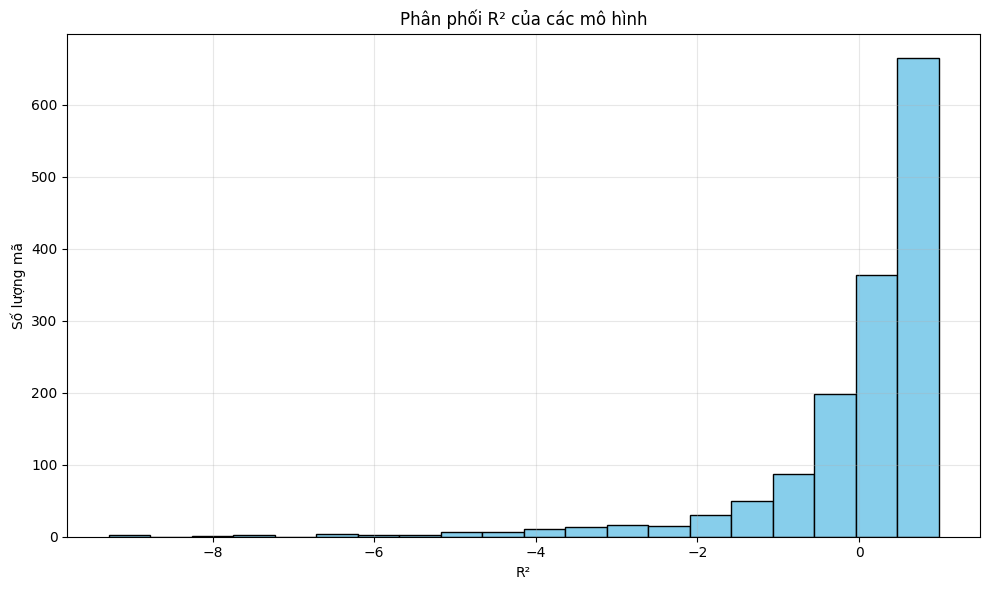

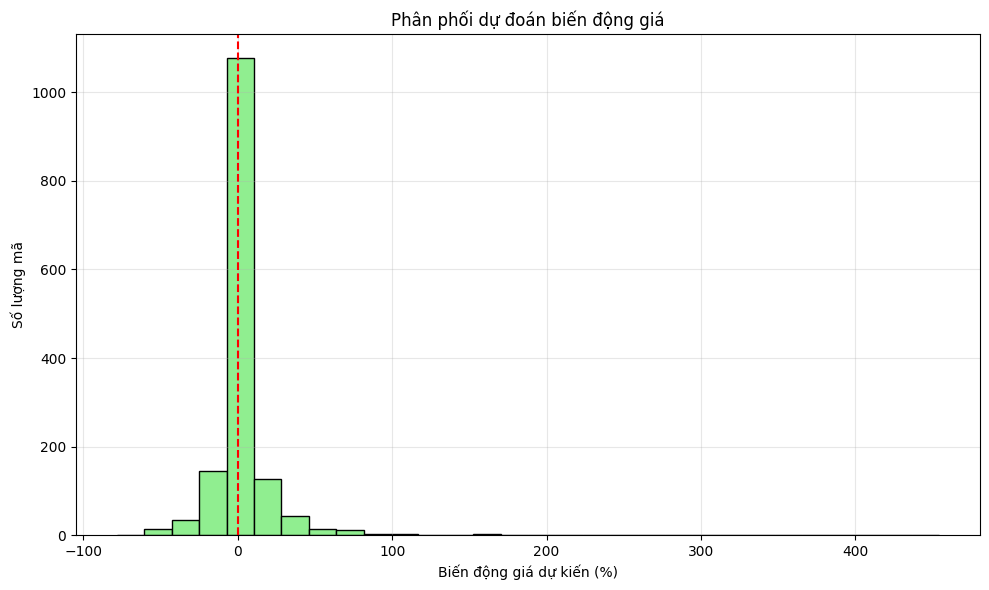

In [13]:
# Hiển thị kết quả tổng hợp
dem_80 = 0
for i in result_df['r2']:
    if i > 0.8:
        dem_80 += 1

print(f"\nSố mã có R² > 0.8: {dem_80/len(result_df)} mã")
print(f"Số mã có R² < 0.8: {(len(result_df) - dem_80)/len(result_df)} mã")



print("\n=== KẾT QUẢ TỔNG HỢP ===")
print(f"Tổng số mã xử lý thành công: {len(result_df)}")
print(f"R² trung bình: {result_df['r2'].mean():.4f}")
print(f"RMSE trung bình: {result_df['rmse'].mean():.4f}")
print(f"Độ chính xác dự đoán hướng trung bình: {result_df['direction_accuracy'].mean():.4f}")

# Thống kê về số ngày
print("\n--- THỐNG KÊ SỐ NGÀY ---")
print(f"Số ngày trung bình mỗi mã: {result_df['data_days'].mean():.1f}")
print(f"Số ngày train trung bình: {result_df['train_days'].mean():.1f}")
print(f"Số ngày test trung bình: {result_df['test_days'].mean():.1f}")

# Top 10 mã có R² cao nhất
print("\n=== TOP 10 MÃ DỰ ĐOÁN TỐT NHẤT (R² CAO NHẤT) ===")
print(result_df.sort_values('r2', ascending=False)[['ticker', 'r2', 'rmse', 'direction_accuracy', 'change_pct']].head(10))

# Top 10 mã dự đoán tăng mạnh nhất
print("\n=== TOP 10 MÃ DỰ ĐOÁN TĂNG MẠNH NHẤT ===")
rising_stocks = result_df[result_df['trend'] == 'UP'].sort_values('change_pct', ascending=False)
print(rising_stocks[['ticker', 'change_pct', 'r2', 'direction_accuracy', 'current_price', 'predicted_price']].head(10))

# Top 10 mã dự đoán giảm mạnh nhất
print("\n=== TOP 10 MÃ DỰ ĐOÁN GIẢM MẠNH NHẤT ===")
falling_stocks = result_df[result_df['trend'] == 'DOWN'].sort_values('change_pct')
print(falling_stocks[['ticker', 'change_pct', 'r2', 'direction_accuracy', 'current_price', 'predicted_price']].head(10))

# Lưu kết quả ra file CSV
result_df.to_csv("E:/Project/StockVNQA_Lâm/train/prediction_results.csv", index=False)
print("\nĐã lưu kết quả vào file prediction_results.csv")

# Vẽ biểu đồ phân phối R²
plt.figure(figsize=(10, 6))
plt.hist(result_df['r2'], bins=20, color='skyblue', edgecolor='black')
plt.title('Phân phối R² của các mô hình')
plt.xlabel('R²')
plt.ylabel('Số lượng mã')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("E:/Project/StockVNQA_Lâm/train/r2_distribution.png")
plt.show()

# Vẽ biểu đồ phân phối dự đoán biến động giá
plt.figure(figsize=(10, 6))
plt.hist(result_df['change_pct'], bins=30, color='lightgreen', edgecolor='black')
plt.title('Phân phối dự đoán biến động giá')
plt.xlabel('Biến động giá dự kiến (%)')
plt.ylabel('Số lượng mã')
plt.axvline(x=0, color='red', linestyle='--')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("E:/Project/StockVNQA_Lâm/train/price_change_distribution.png")
plt.show()

train theo số ngày để tìm đc ngày tốt nhất 


TRAIN ACB THEO NGÀY


In [19]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score, mean_absolute_error

def train_with_data_size(ticker, num_days=300, test_size=0.2):
    """
    Train mô hình XGBoost với số ngày dữ liệu được chỉ định
    
    Args:
        ticker (str): Mã cổ phiếu
        num_days (int): Số ngày dữ liệu muốn sử dụng
        test_size (float): Tỷ lệ dữ liệu test (0-1)
        
    Returns:
        dict: Kết quả train và đánh giá mô hình
    """
    try:
        # 1. Đọc dữ liệu
        # print(f"\n--- Đang xử lý {ticker} với {num_days} ngày dữ liệu ---")
        df = pd.read_csv(f"E:/Project/StockVNQA_Lâm/train/data/{ticker}.csv")
        
        # 2. Kiểm tra và chuyển đổi kiểu dữ liệu nếu cần
        numeric_columns = ['open', 'high', 'low', 'close', 'volume']
        for col in numeric_columns:
            if col in df.columns:
                if df[col].dtype == 'object':
                    # print(f"⚠️ {ticker}: Chuyển đổi cột {col} từ kiểu chuỗi sang số")
                    try:
                        df[col] = df[col].str.replace(',', '').astype(float)
                    except Exception as e:
                        # print(f"⚠️ {ticker}: Không thể chuyển đổi cột {col}: {str(e)}")
                        return None
        
        # 3. Tạo features
        df['volatility'] = df['high'] - df['low']
        df['return_1d'] = df['close'].pct_change()
        df['ma5'] = df['close'].rolling(window=5).mean()
        df['ma10'] = df['close'].rolling(window=10).mean()
        df['volume_ma5'] = df['volume'].rolling(window=5).mean()
        
        # Xử lý an toàn cho volume_ratio
        df['volume_ratio'] = np.where(
            df['volume_ma5'] > 0, 
            df['volume'] / df['volume_ma5'], 
            np.nan
        )
        
        # Target
        df['target'] = df['close'].shift(-1)
        
        # 4. Xử lý NaN và vô cực
        df = df.replace([np.inf, -np.inf], np.nan)
        df.dropna(inplace=True)
        
        # 5. Kiểm tra số lượng dữ liệu có đủ không
        total_days = len(df)
        if total_days < num_days:
            # print(f"⚠️ {ticker}: Chỉ có {total_days} ngày dữ liệu, ít hơn {num_days} ngày yêu cầu")
            # Nếu muốn tiếp tục với số ngày hiện có, giữ nguyên dòng dưới
            # num_days = total_days
            # Nếu muốn bỏ qua ticker không đủ dữ liệu, uncomment dòng dưới
            return None
        
        # 6. Lấy số dòng mới nhất theo yêu cầu
        df = df.tail(num_days).reset_index(drop=True)
        # print(f"Sử dụng {len(df)} ngày dữ liệu gần nhất cho {ticker}")
        
        # 7. Chuẩn bị dữ liệu để huấn luyện
        features = ['open', 'high', 'low', 'close', 'volume', 'volatility', 
                   'return_1d', 'ma5', 'ma10', 'volume_ratio']
        
        X = df[features]
        y = df['target']
        
        # 8. Phân chia dữ liệu train/test
        test_rows = int(len(df) * test_size)
        train_rows = len(df) - test_rows
        
        X_train, X_test = X.iloc[:train_rows], X.iloc[train_rows:]
        y_train, y_test = y.iloc[:train_rows], y.iloc[train_rows:]
        
        # print(f"Mã {ticker}: Train {len(X_train)} mẫu, Test {len(X_test)} mẫu")
        
        # 9. Huấn luyện mô hình XGBoost
        model = xgb.XGBRegressor(n_estimators=300, max_depth=2, learning_rate=0.05,
                                 colsample_bytree=0.8, gamma=0.1, min_child_weight=3, subsample=0.8)
        model.fit(X_train, y_train)
        
        # 10. Đánh giá mô hình
        y_pred = model.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_test, y_pred)
        
        # Xử lý R² quá thấp
        try:
            r2 = r2_score(y_test, y_pred)
            if r2 < -10:
                return None
        except Exception as e:
            # print(f"⚠️ {ticker}: Lỗi tính R²: {str(e)}")
            return None
        
        # 11. Tính toán dự đoán hướng (tăng/giảm)
        y_direction_true = (y_test.values > X_test['close'].values).astype(int)
        y_direction_pred = (y_pred > X_test['close'].values).astype(int)
        direction_accuracy = np.mean(y_direction_true == y_direction_pred)
        
        # print(f"✅ {ticker} ({num_days} days) - RMSE: {rmse:.4f}, R²: {r2:.4f}, Direction Accuracy: {direction_accuracy:.4f}")
        
        # 12. Dự đoán giá cho ngày tiếp theo
        latest = df.iloc[-1:].copy()
        X_future = latest[features]
        predicted_price_tomorrow = model.predict(X_future)[0]
        current_price = df['close'].iloc[-1]
        change_pct = (predicted_price_tomorrow - current_price) / current_price * 100
        
        if change_pct > 0:
            trend = "🔼 TĂNG"
        else:
            trend = "🔽 GIẢM"
            
        # print(f"🎯 {ticker} - Hiện tại: {current_price:.2f}, Dự đoán: {predicted_price_tomorrow:.2f}, {trend}: {change_pct:.2f}%")
        plt.figure(figsize=(10, 6))
        plt.plot(y_test.values, label='Giá thực tế', marker='o', markersize=3, alpha=0.7)
        plt.plot(y_pred, label='Giá dự đoán', marker='x', markersize=3)
        plt.title(f'Dự đoán giá {ticker} bằng LSTM với data {len(df)} (RMSE: {rmse:.4f}, R²: {r2:.4f})')
        plt.xlabel('Ngày kiểm tra')
        plt.ylabel('Giá đóng cửa')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
        # 1. Trả về kết quả đầy đủ
        return {
            'ticker': ticker,
            'data_days': len(df),
            'train_days': len(X_train),
            'test_days': len(X_test),
            'rmse': rmse,
            'mae': mae,
            'r2': r2,
            'direction_accuracy': direction_accuracy,
            'current_price': current_price,
            'predicted_price': predicted_price_tomorrow,
            'change_pct': change_pct,
            'trend': 'UP' if change_pct > 0 else 'DOWN'
        }
        
    except Exception as e:
        # print(f"❌ Lỗi xử lý {ticker} với {num_days} ngày: {str(e)}")
        import traceback
        traceback.print_exc()
        return None


Tổng số ngày dữ liệu của DKC: 4605
Đang xử lý với 100 ngày dữ liệu...


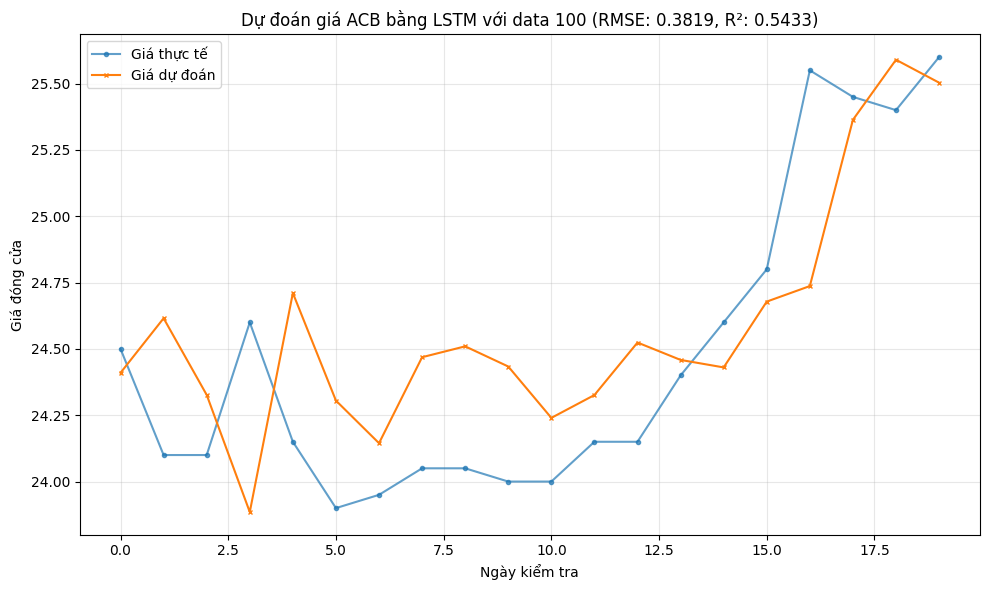

Hoàn thành: R² = 0.5433, RMSE = 0.3819
Đang xử lý với 200 ngày dữ liệu...


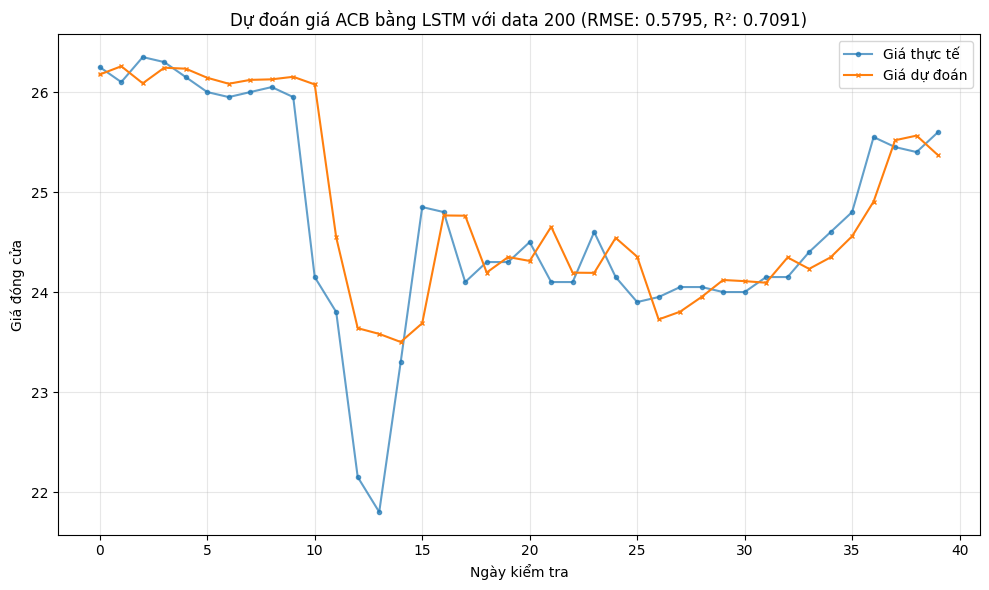

Hoàn thành: R² = 0.7091, RMSE = 0.5795
Đang xử lý với 300 ngày dữ liệu...


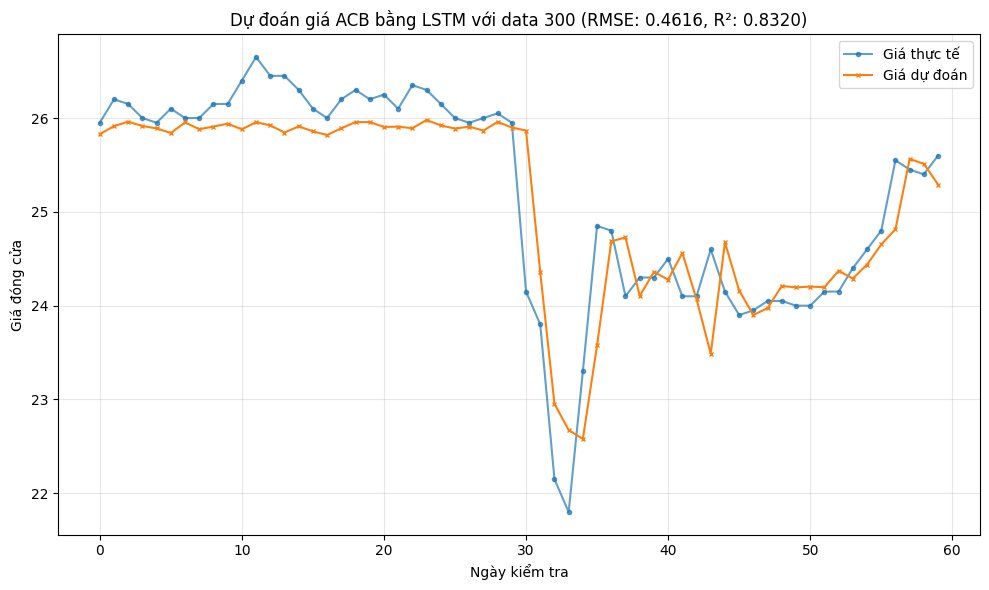

Hoàn thành: R² = 0.8320, RMSE = 0.4616
Đang xử lý với 400 ngày dữ liệu...


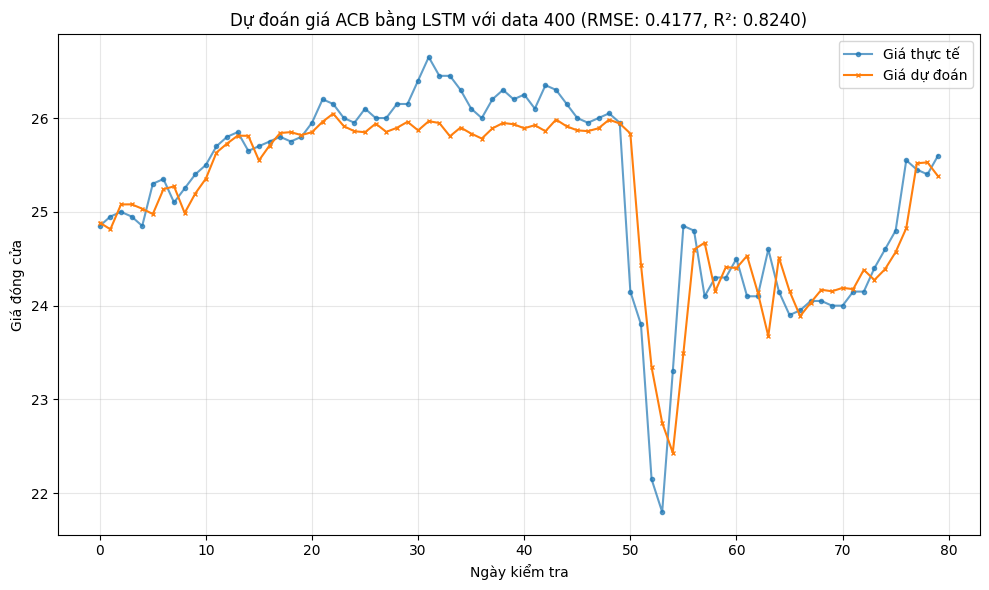

Hoàn thành: R² = 0.8240, RMSE = 0.4177
Đang xử lý với 500 ngày dữ liệu...


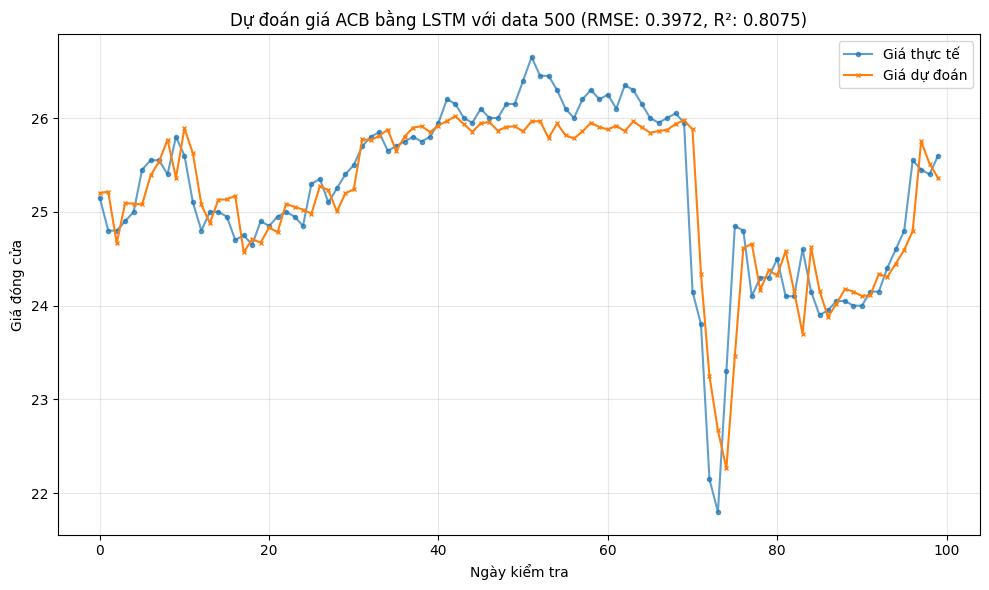

Hoàn thành: R² = 0.8075, RMSE = 0.3972
Đang xử lý với 600 ngày dữ liệu...


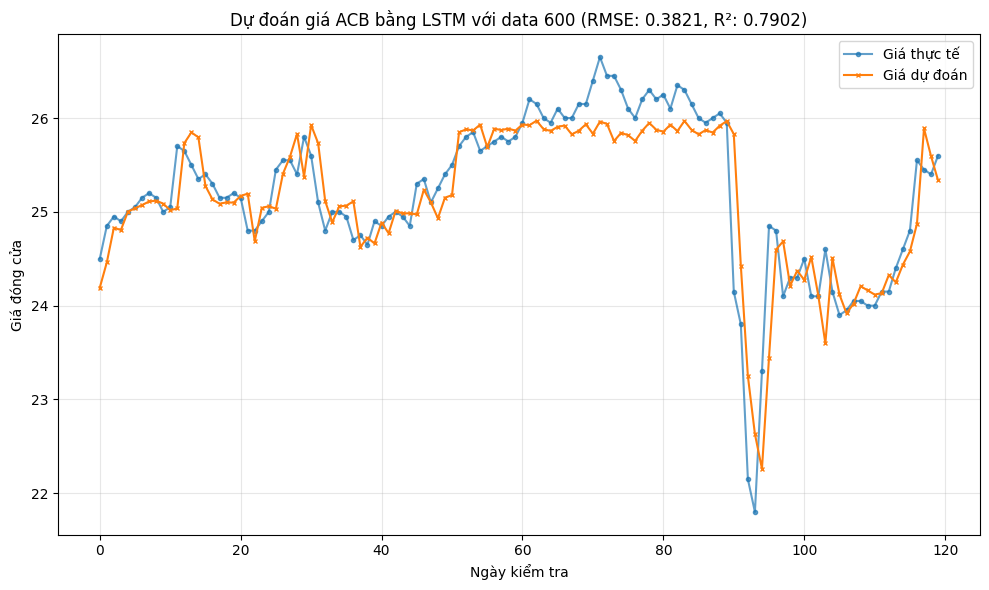

Hoàn thành: R² = 0.7902, RMSE = 0.3821
Đang xử lý với 700 ngày dữ liệu...


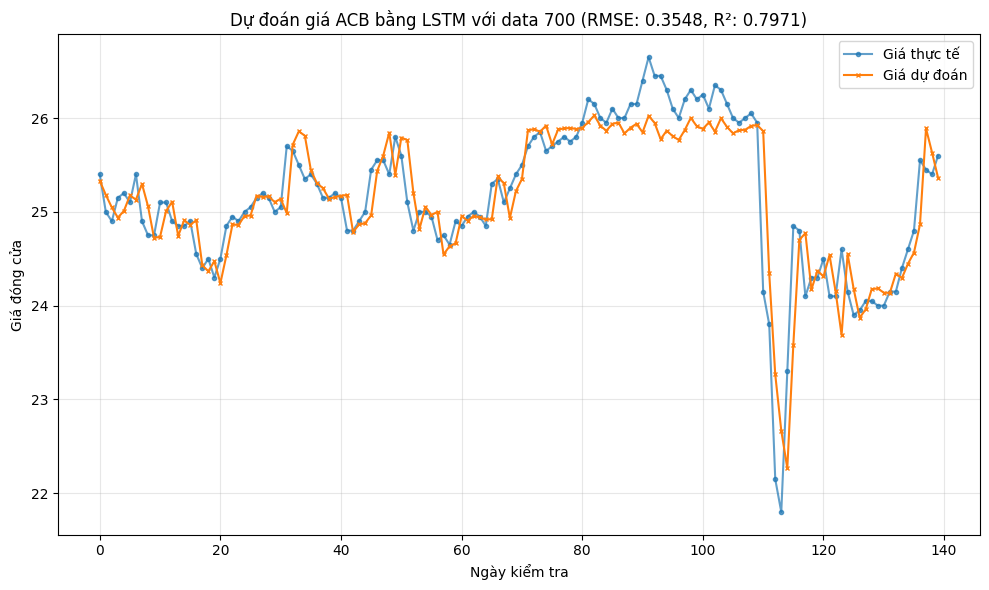

Hoàn thành: R² = 0.7971, RMSE = 0.3548
Đang xử lý với 800 ngày dữ liệu...


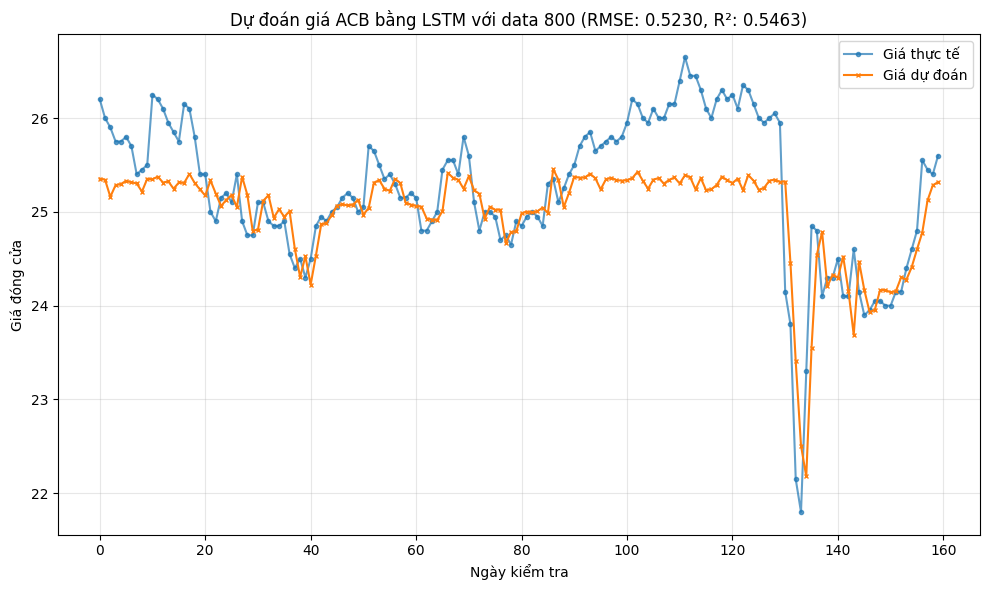

Hoàn thành: R² = 0.5463, RMSE = 0.5230
Đang xử lý với 900 ngày dữ liệu...


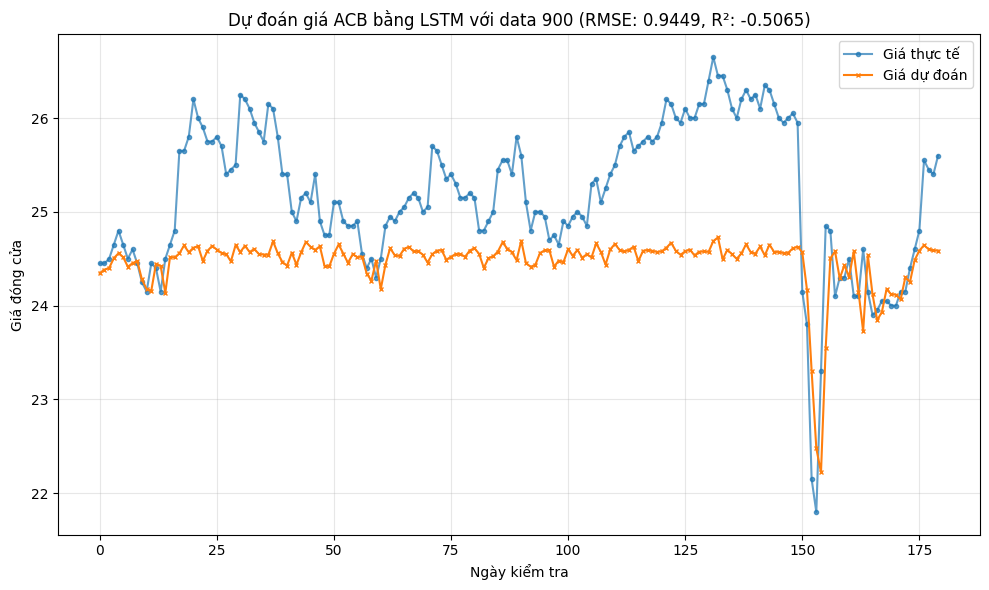

Hoàn thành: R² = -0.5065, RMSE = 0.9449
Đang xử lý với 1000 ngày dữ liệu...


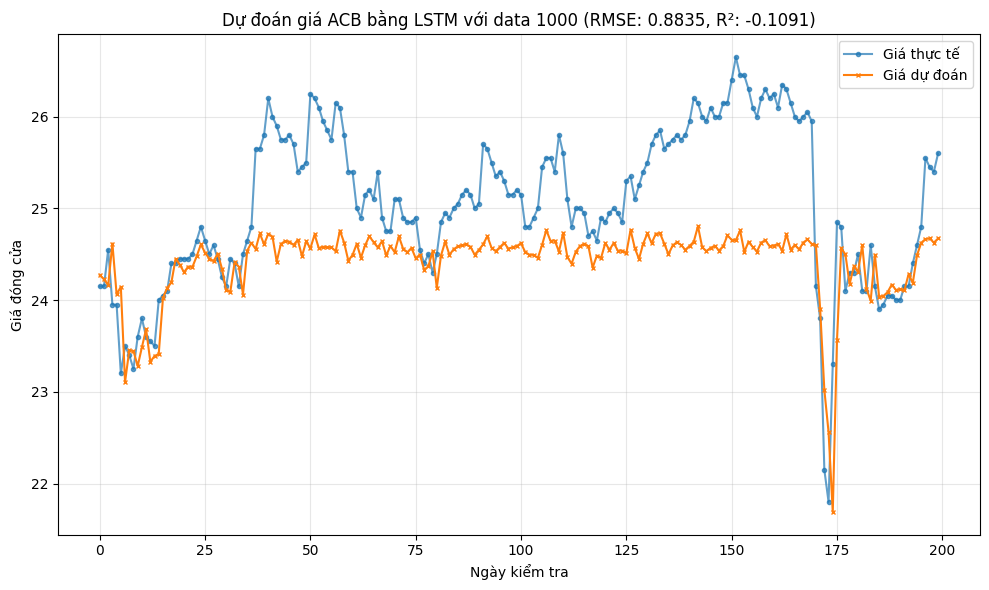

Hoàn thành: R² = -0.1091, RMSE = 0.8835
Đang xử lý với 1100 ngày dữ liệu...


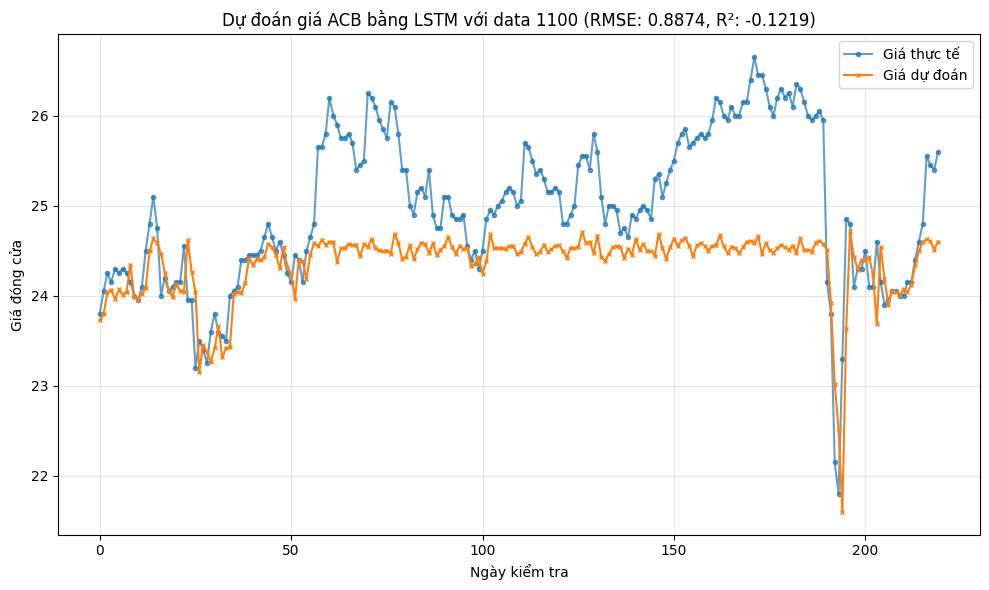

Hoàn thành: R² = -0.1219, RMSE = 0.8874
Đang xử lý với 1200 ngày dữ liệu...


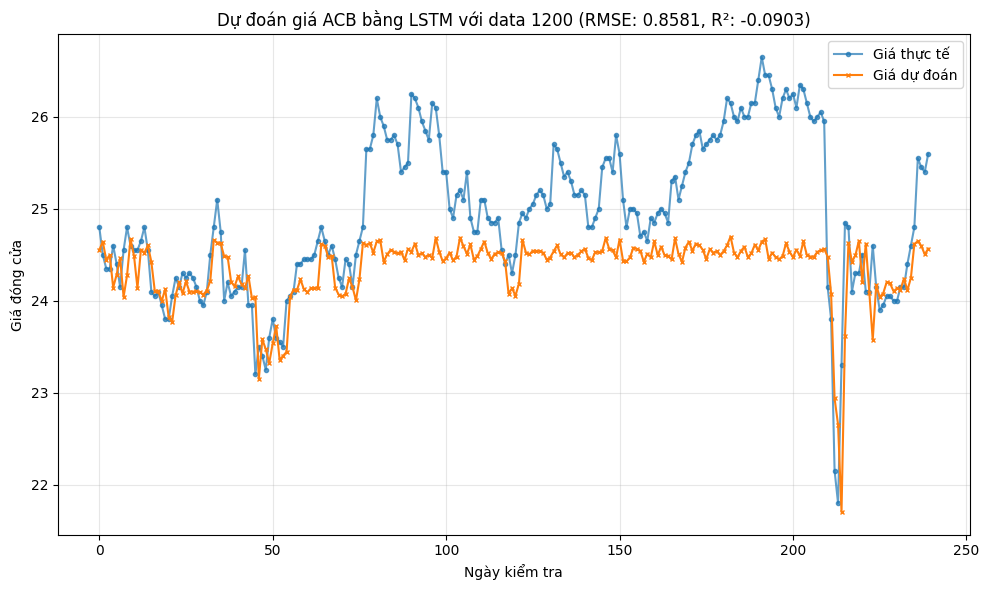

Hoàn thành: R² = -0.0903, RMSE = 0.8581
Đang xử lý với 1300 ngày dữ liệu...


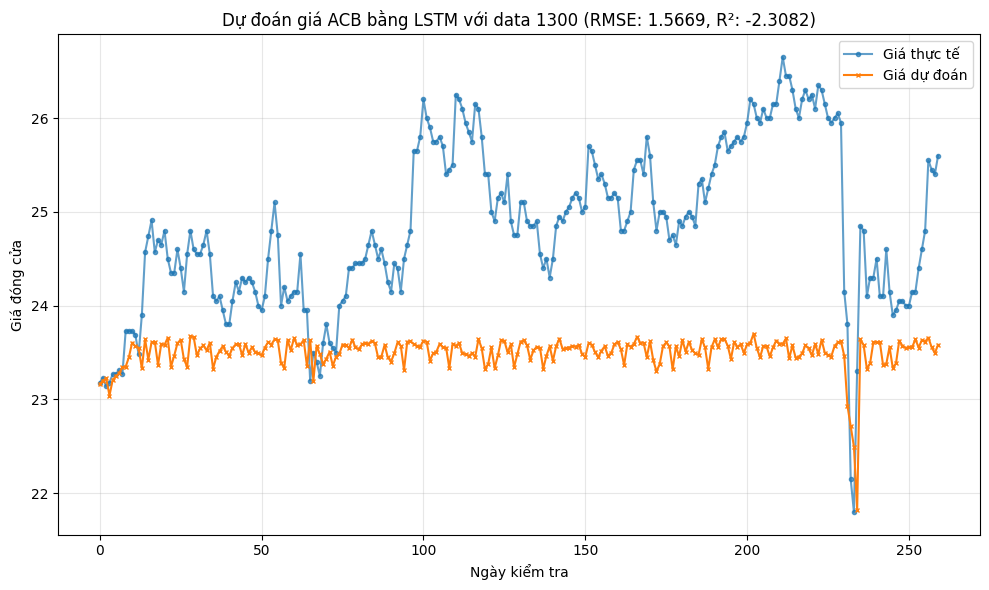

Hoàn thành: R² = -2.3082, RMSE = 1.5669
Đang xử lý với 1400 ngày dữ liệu...


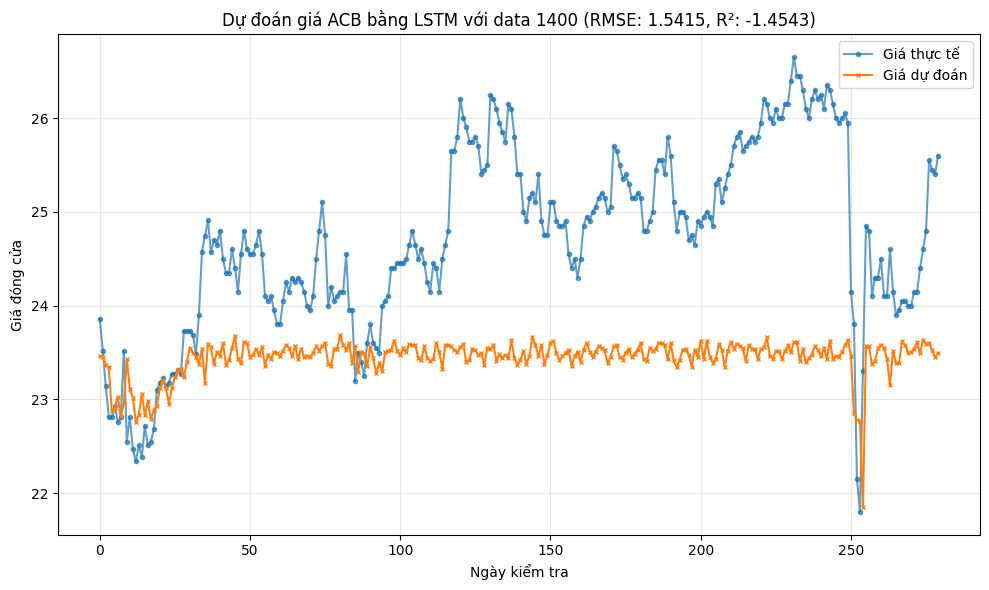

Hoàn thành: R² = -1.4543, RMSE = 1.5415
Đang xử lý với 1500 ngày dữ liệu...


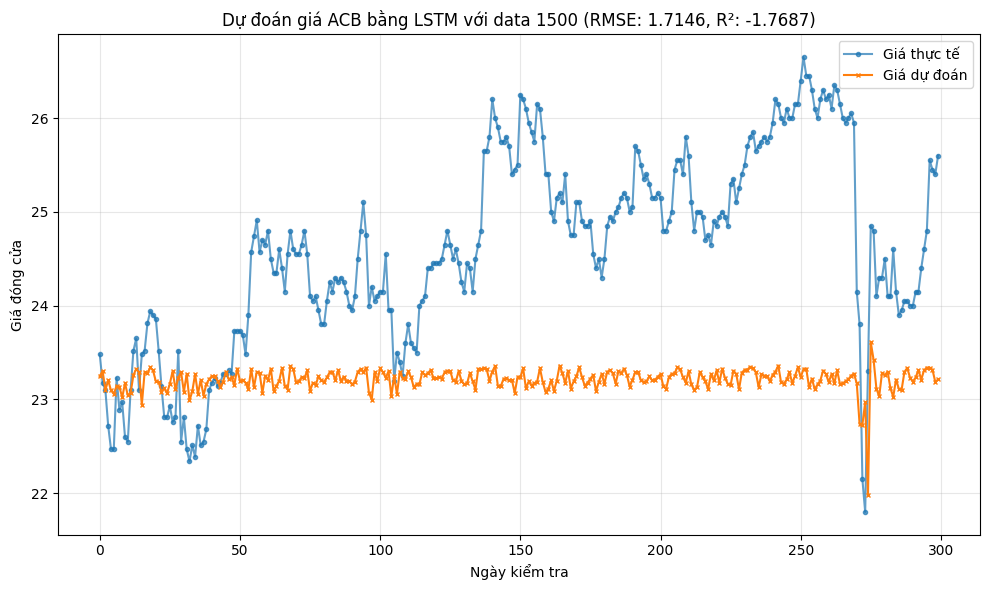

Hoàn thành: R² = -1.7687, RMSE = 1.7146
Đang xử lý với 1600 ngày dữ liệu...


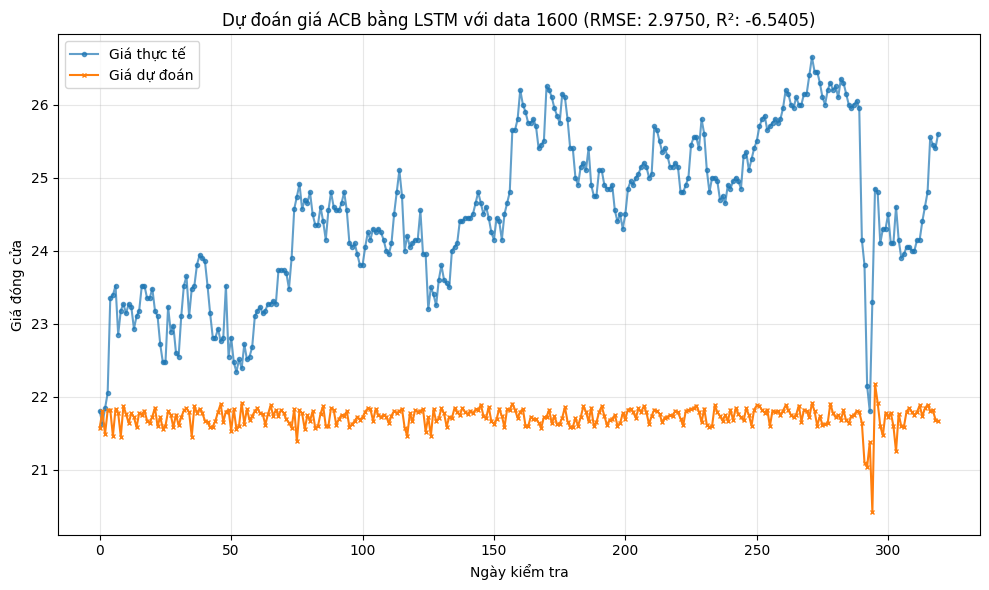

Hoàn thành: R² = -6.5405, RMSE = 2.9750
Đang xử lý với 1700 ngày dữ liệu...


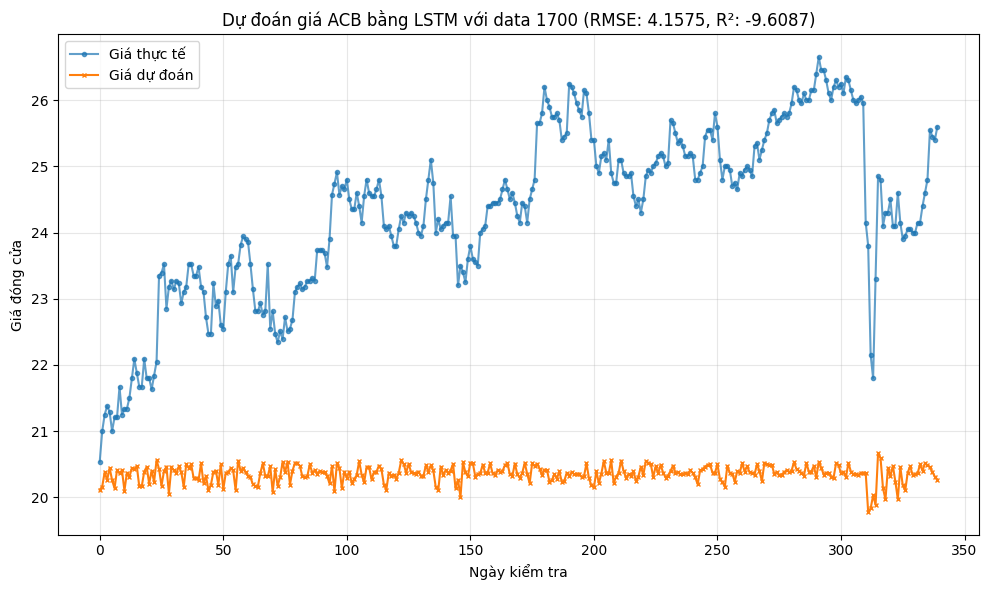

Hoàn thành: R² = -9.6087, RMSE = 4.1575
Đang xử lý với 1800 ngày dữ liệu...


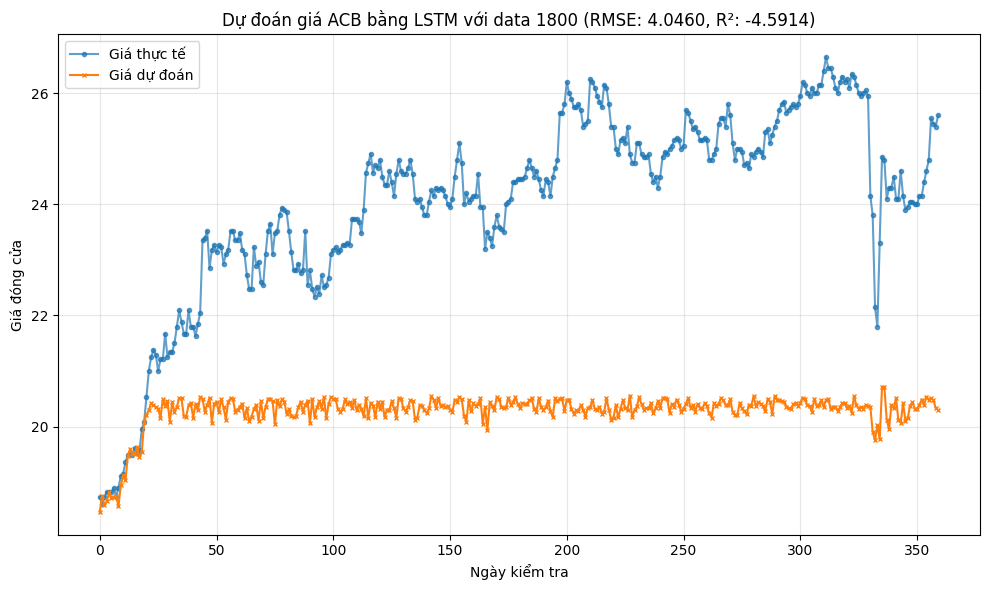

Hoàn thành: R² = -4.5914, RMSE = 4.0460
Đang xử lý với 1900 ngày dữ liệu...


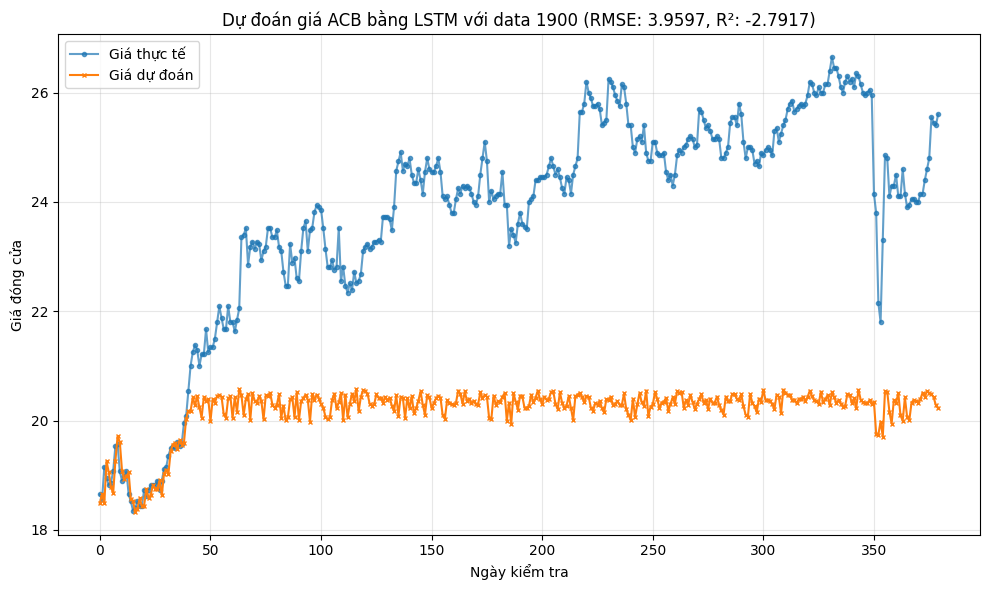

Hoàn thành: R² = -2.7917, RMSE = 3.9597
Đang xử lý với 2000 ngày dữ liệu...


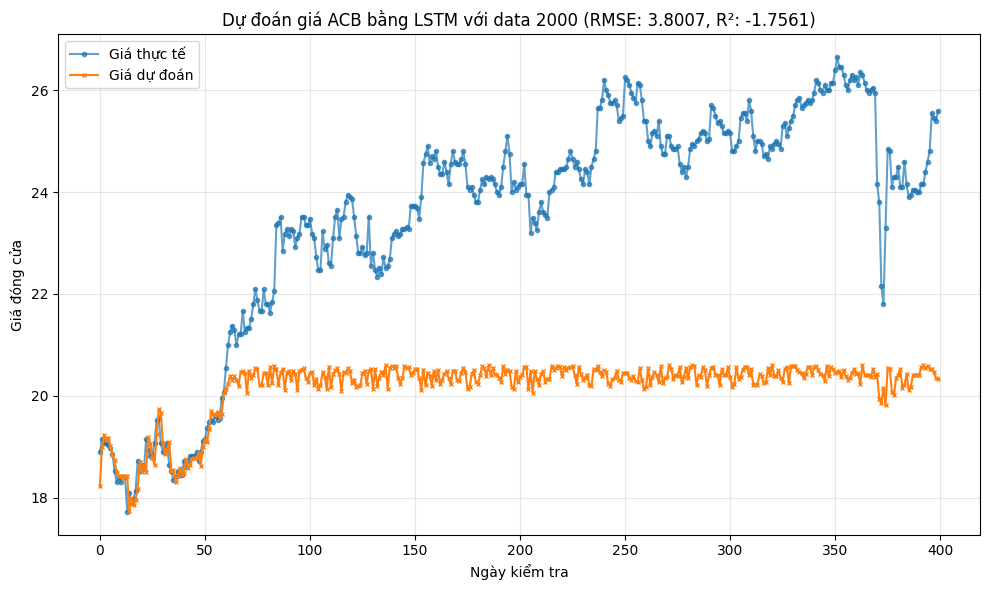

Hoàn thành: R² = -1.7561, RMSE = 3.8007
Đang xử lý với 2100 ngày dữ liệu...


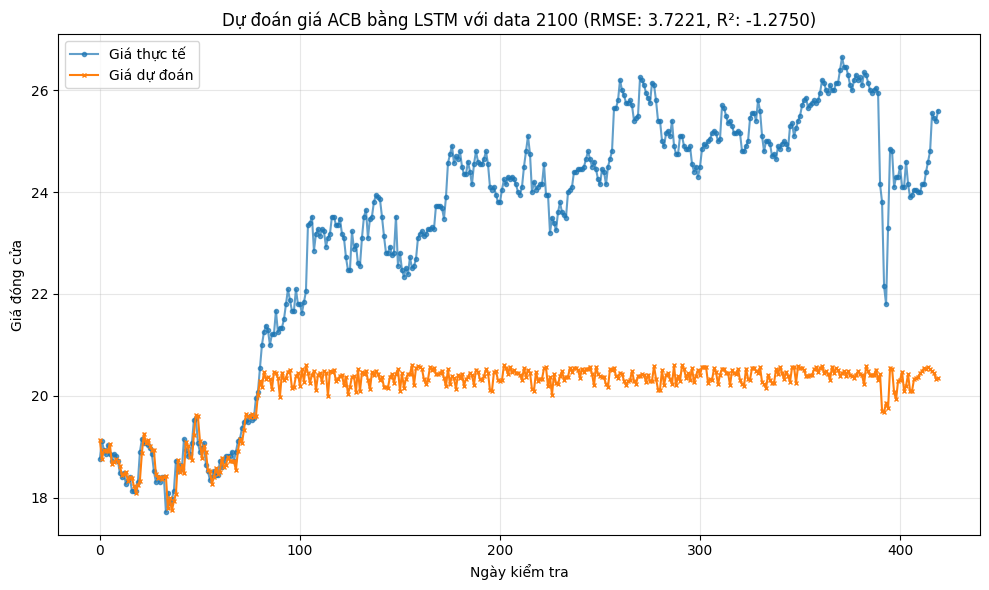

Hoàn thành: R² = -1.2750, RMSE = 3.7221
Đang xử lý với 2200 ngày dữ liệu...


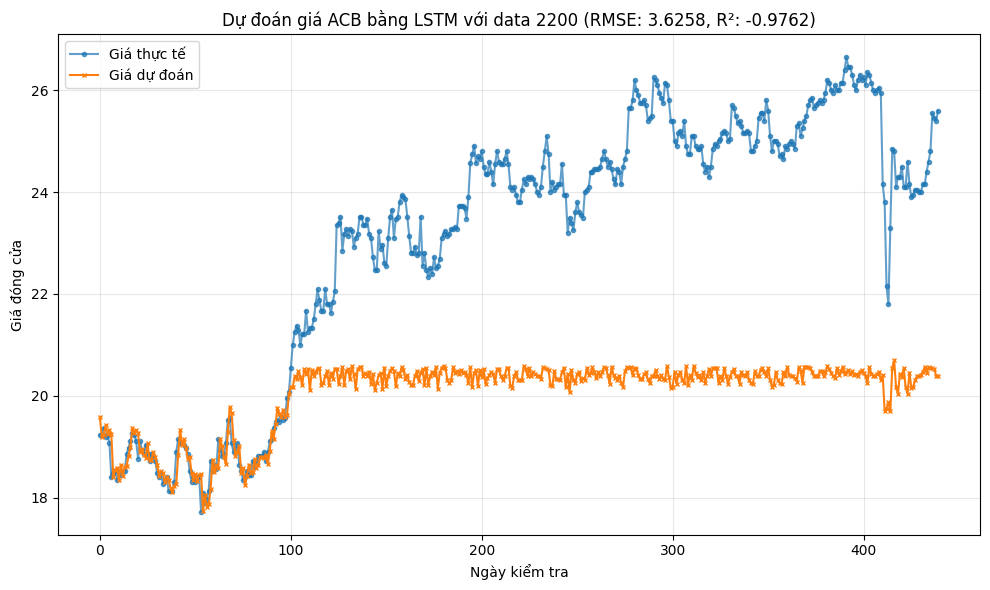

Hoàn thành: R² = -0.9762, RMSE = 3.6258
Đang xử lý với 2300 ngày dữ liệu...


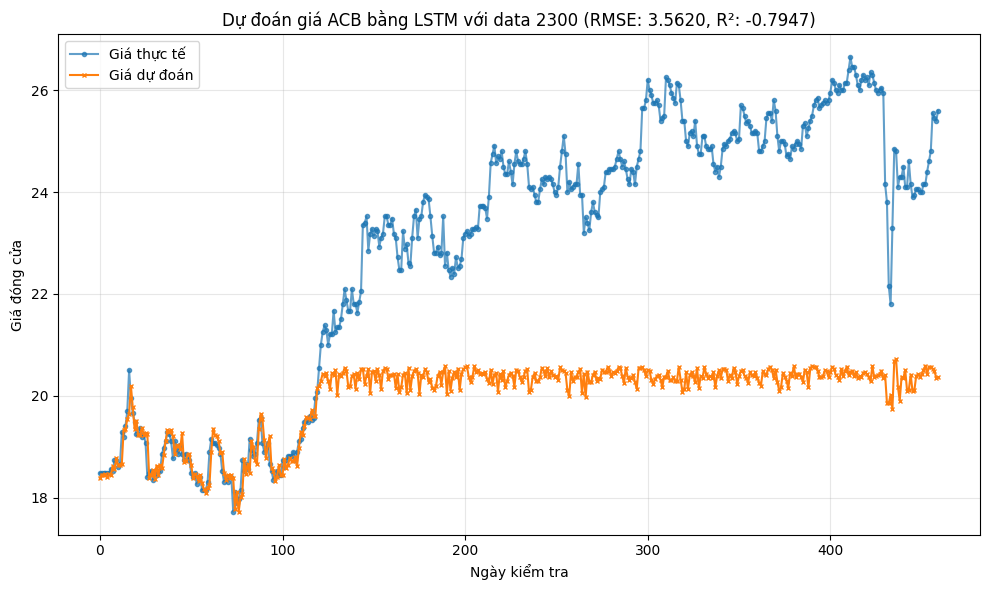

Hoàn thành: R² = -0.7947, RMSE = 3.5620
Đang xử lý với 2400 ngày dữ liệu...


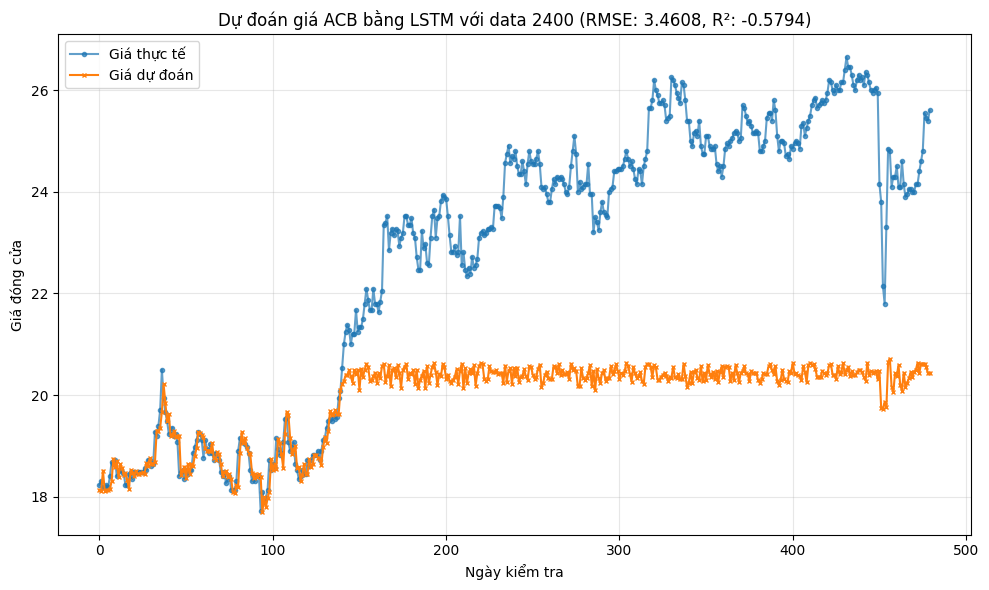

Hoàn thành: R² = -0.5794, RMSE = 3.4608
Đang xử lý với 2500 ngày dữ liệu...


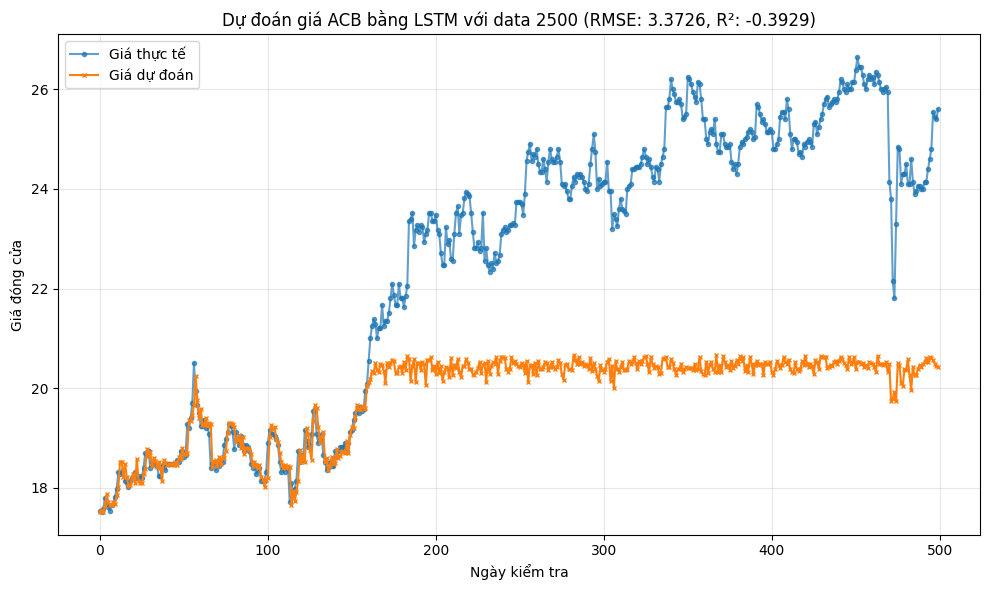

Hoàn thành: R² = -0.3929, RMSE = 3.3726
Đang xử lý với 2600 ngày dữ liệu...


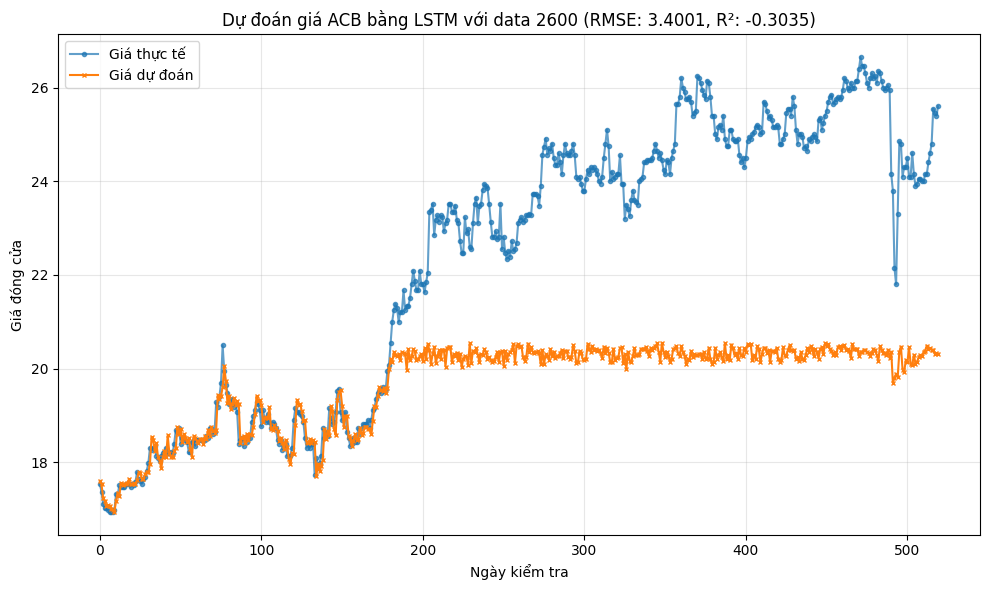

Hoàn thành: R² = -0.3035, RMSE = 3.4001
Đang xử lý với 2700 ngày dữ liệu...


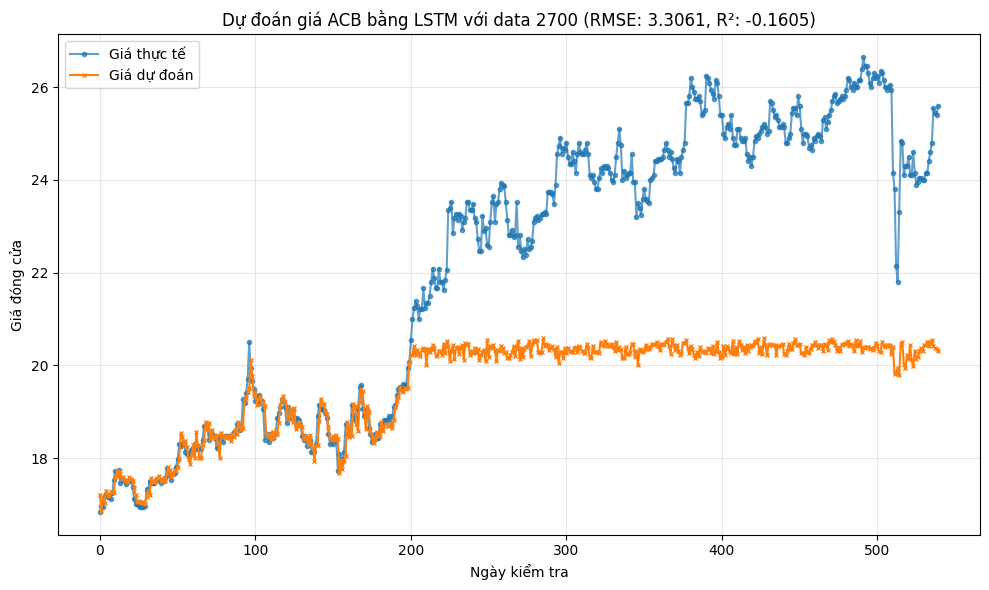

Hoàn thành: R² = -0.1605, RMSE = 3.3061
Đang xử lý với 2800 ngày dữ liệu...


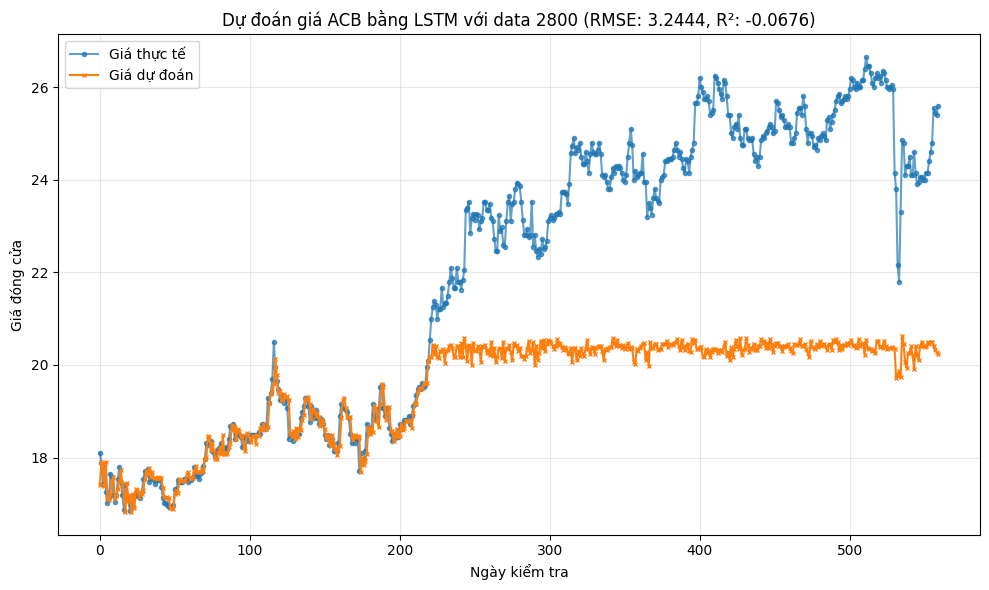

Hoàn thành: R² = -0.0676, RMSE = 3.2444
Đang xử lý với 2900 ngày dữ liệu...


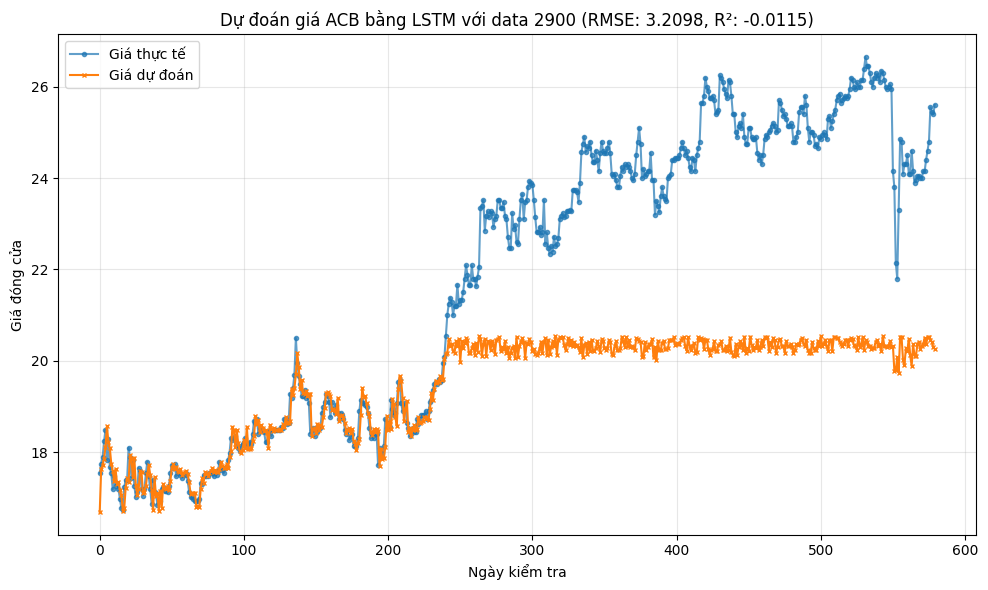

Hoàn thành: R² = -0.0115, RMSE = 3.2098
Đang xử lý với 3000 ngày dữ liệu...


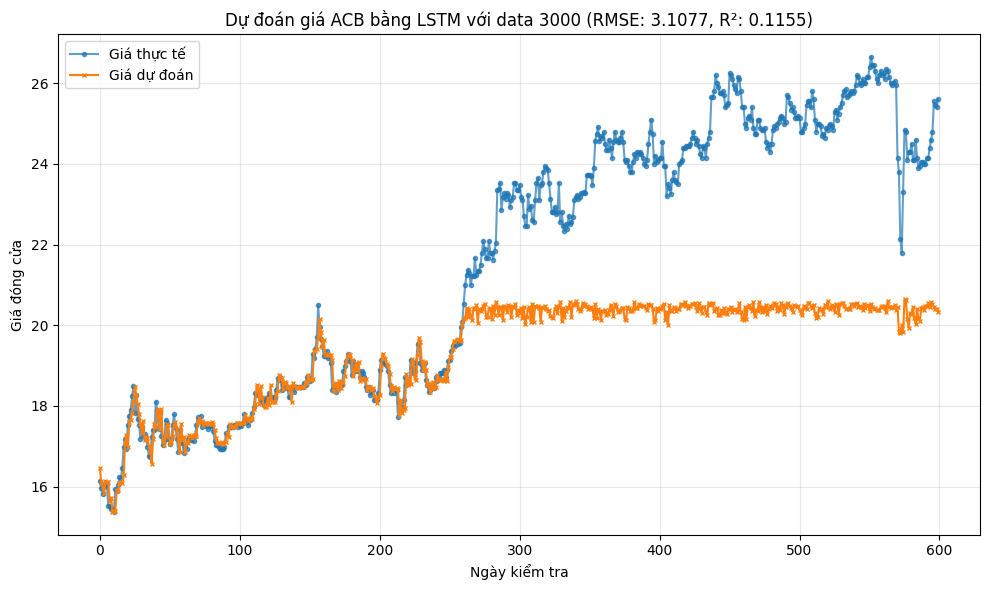

Hoàn thành: R² = 0.1155, RMSE = 3.1077
Đang xử lý với 3100 ngày dữ liệu...


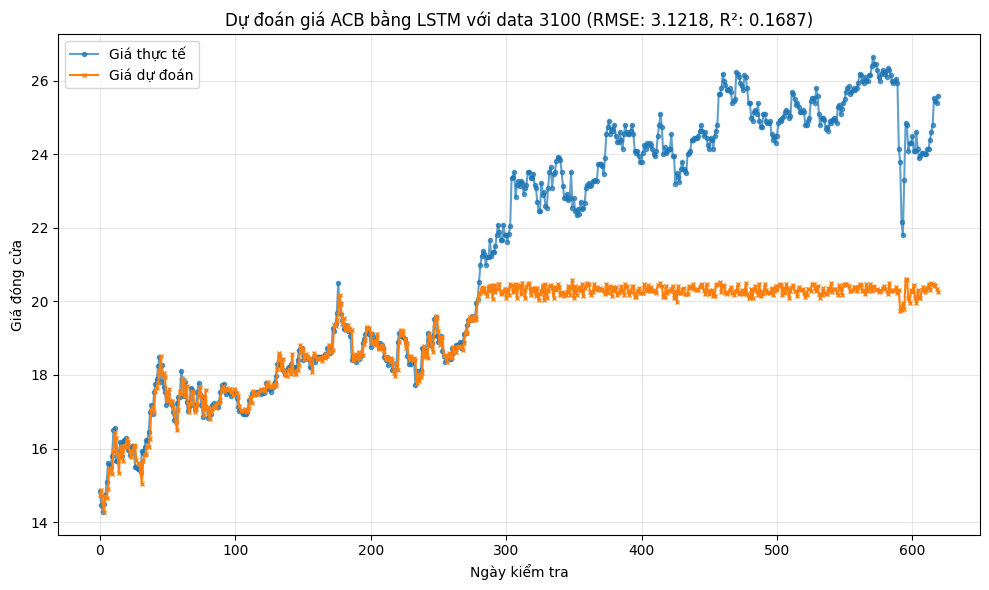

Hoàn thành: R² = 0.1687, RMSE = 3.1218
Đang xử lý với 3200 ngày dữ liệu...


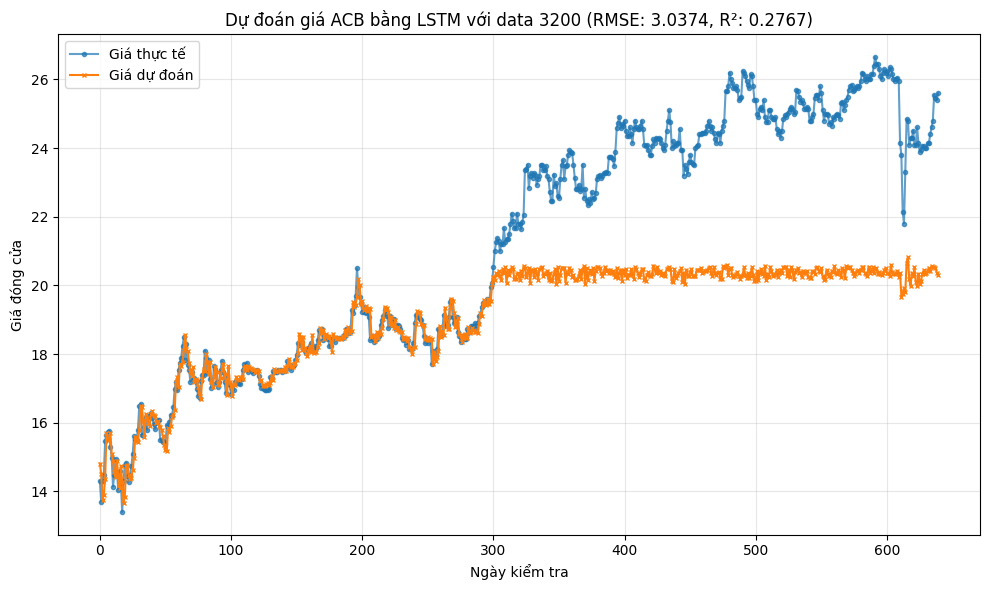

Hoàn thành: R² = 0.2767, RMSE = 3.0374
Đang xử lý với 3300 ngày dữ liệu...


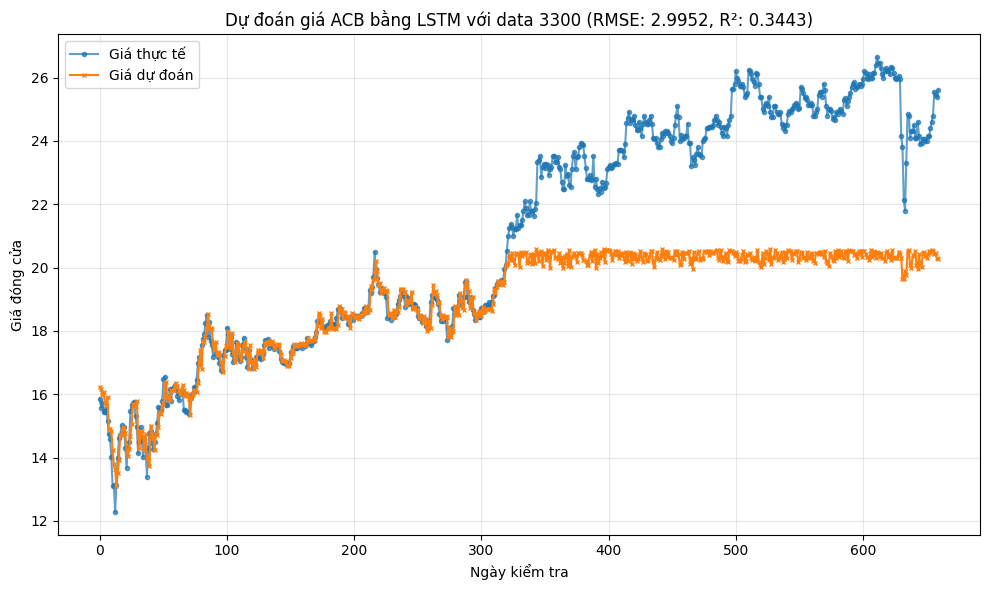

Hoàn thành: R² = 0.3443, RMSE = 2.9952
Đang xử lý với 3400 ngày dữ liệu...


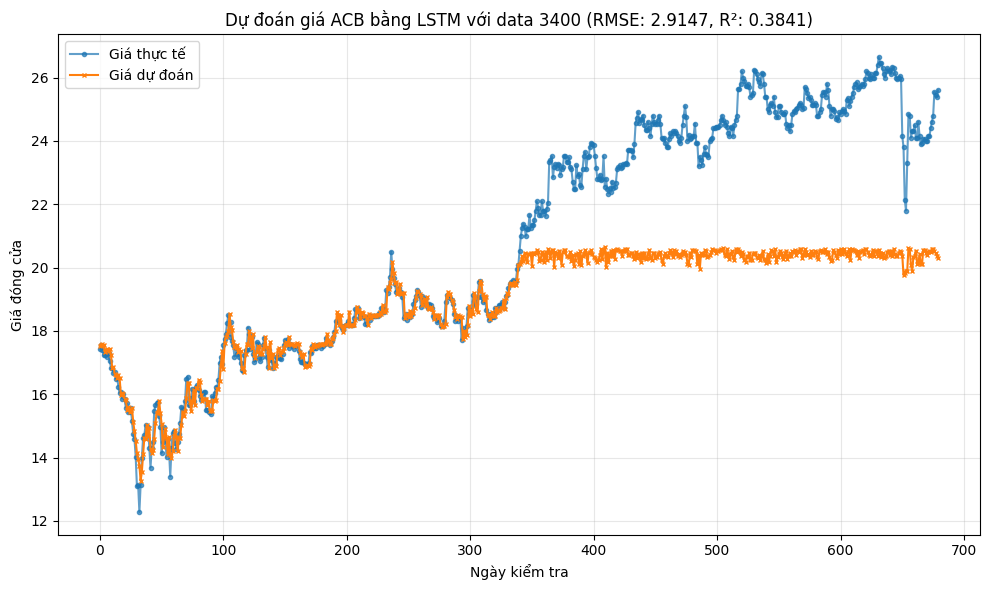

Hoàn thành: R² = 0.3841, RMSE = 2.9147
Đang xử lý với 3500 ngày dữ liệu...


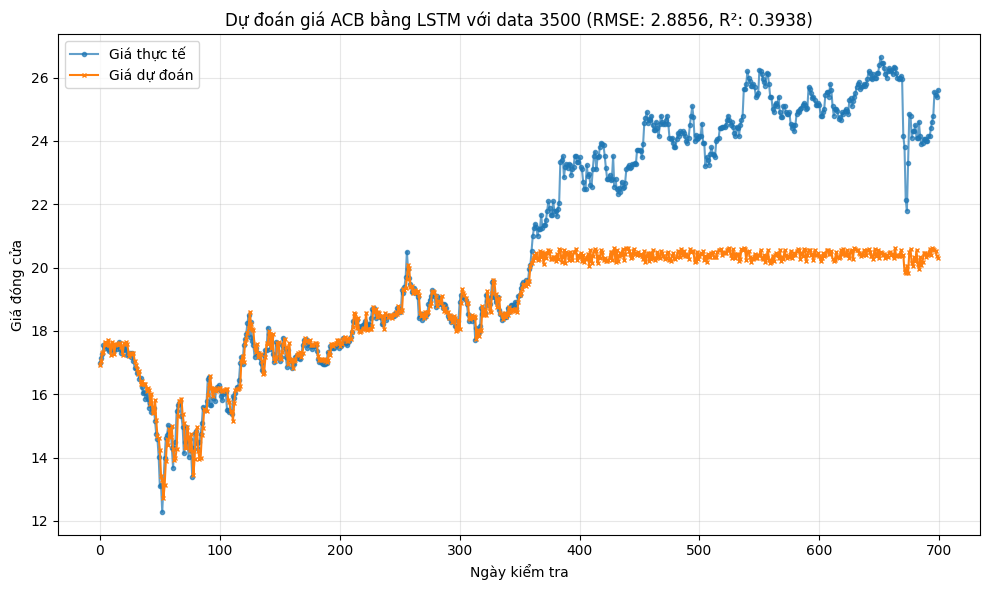

Hoàn thành: R² = 0.3938, RMSE = 2.8856
Đang xử lý với 3600 ngày dữ liệu...


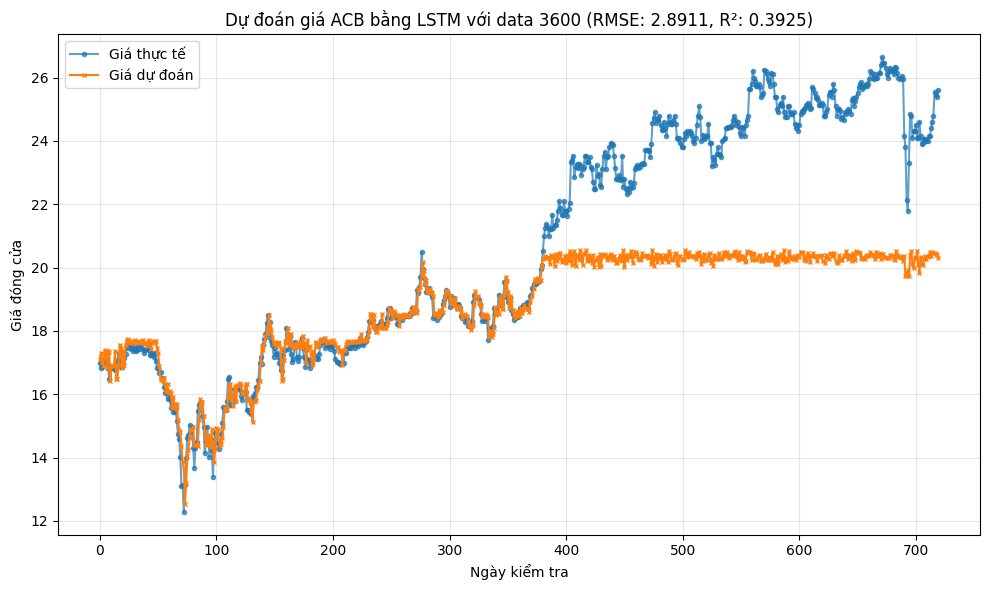

Hoàn thành: R² = 0.3925, RMSE = 2.8911
Đang xử lý với 3700 ngày dữ liệu...


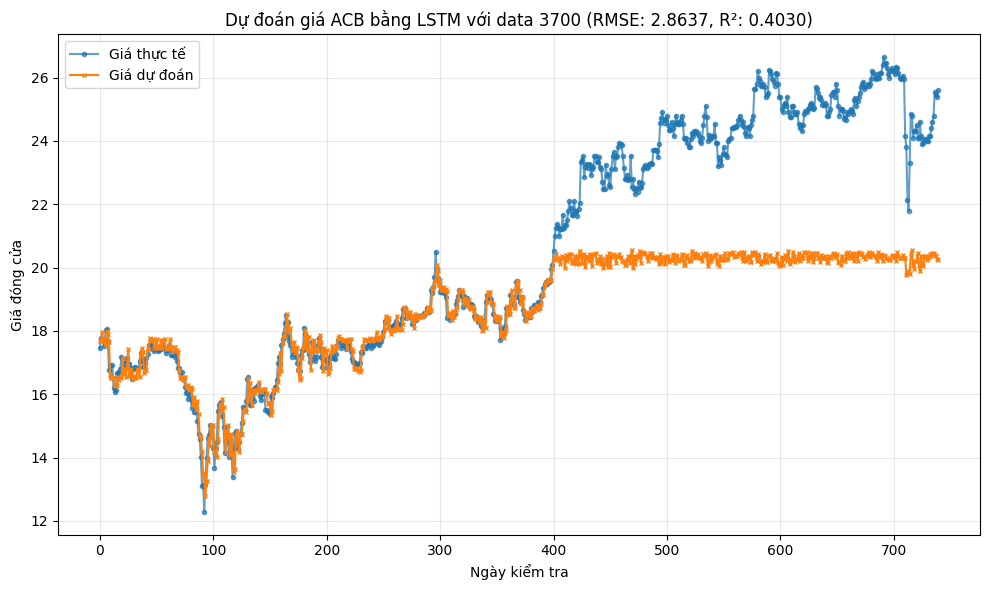

Hoàn thành: R² = 0.4030, RMSE = 2.8637
Đang xử lý với 3800 ngày dữ liệu...


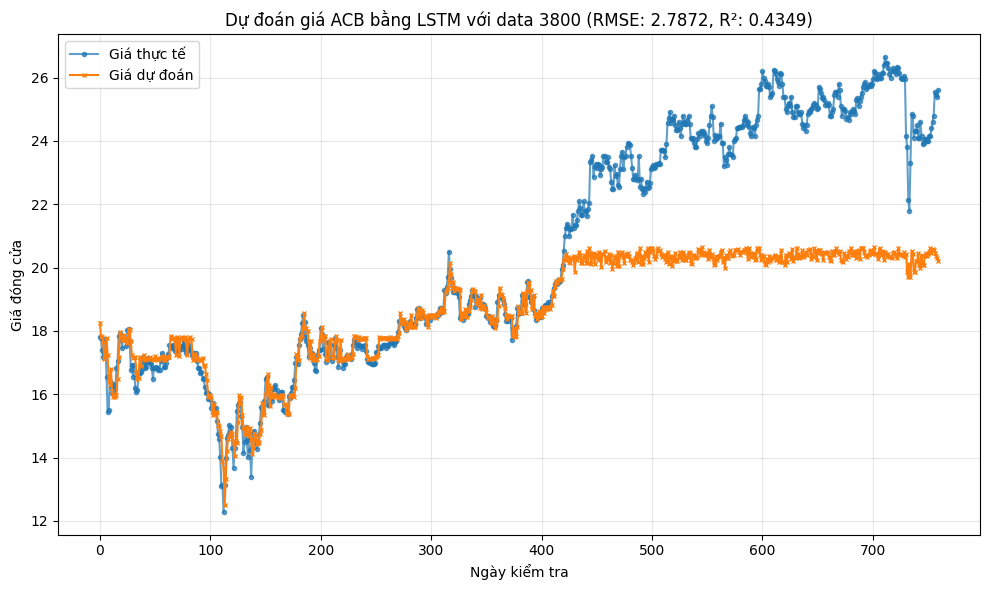

Hoàn thành: R² = 0.4349, RMSE = 2.7872
Đang xử lý với 3900 ngày dữ liệu...


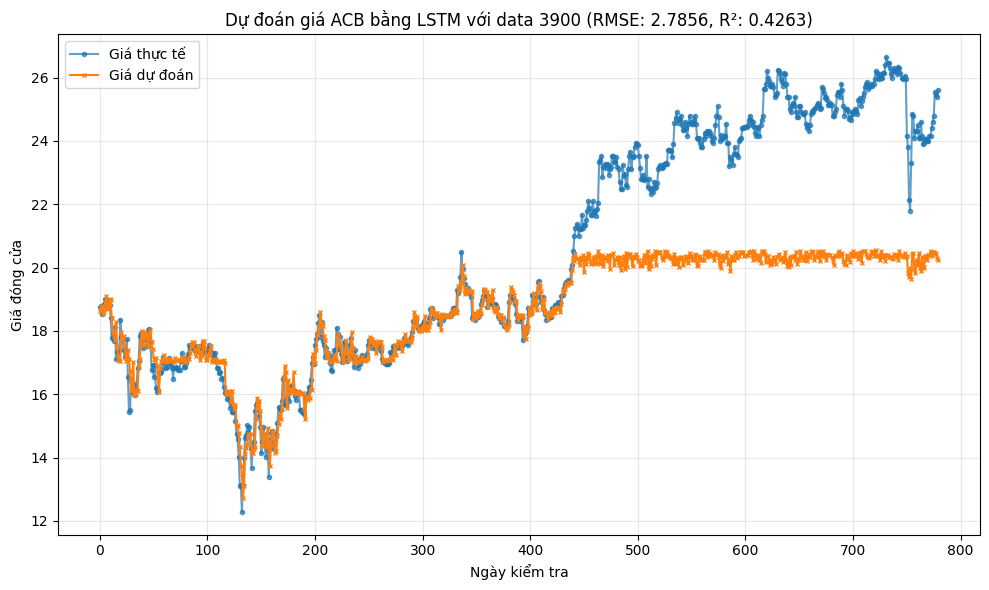

Hoàn thành: R² = 0.4263, RMSE = 2.7856
Đang xử lý với 4000 ngày dữ liệu...


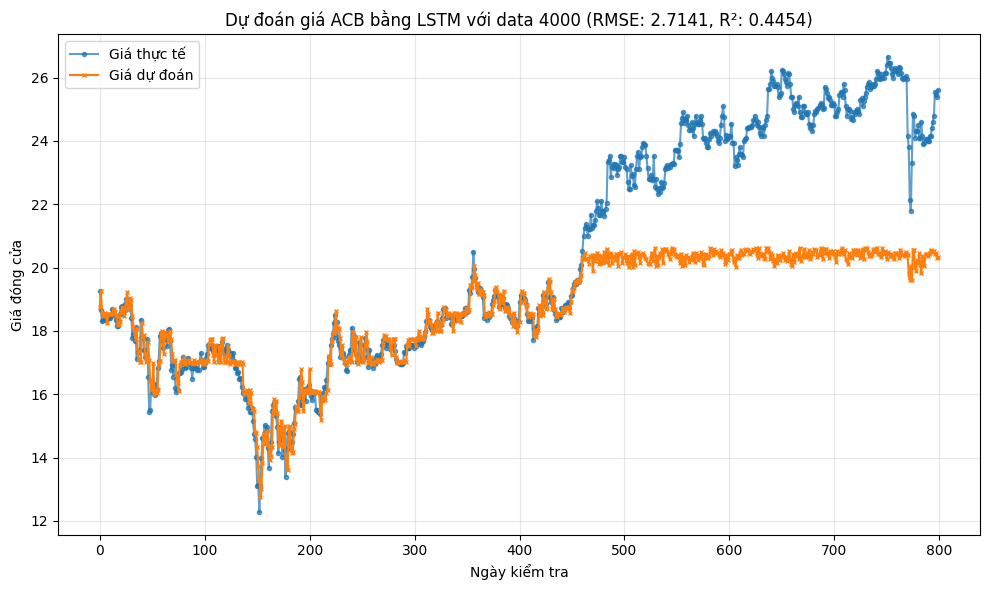

Hoàn thành: R² = 0.4454, RMSE = 2.7141
Đang xử lý với 4100 ngày dữ liệu...


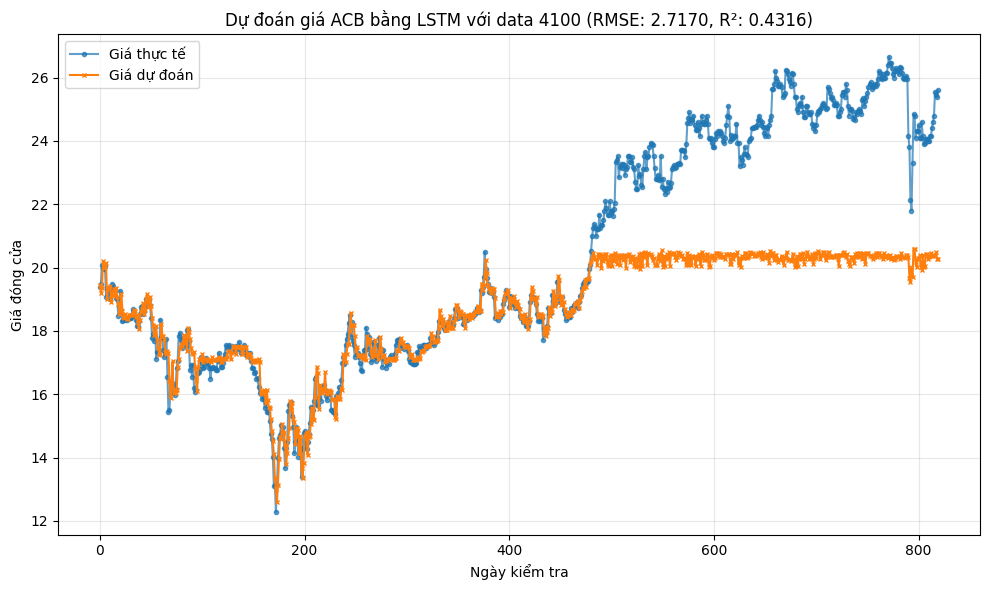

Hoàn thành: R² = 0.4316, RMSE = 2.7170
Đang xử lý với 4200 ngày dữ liệu...


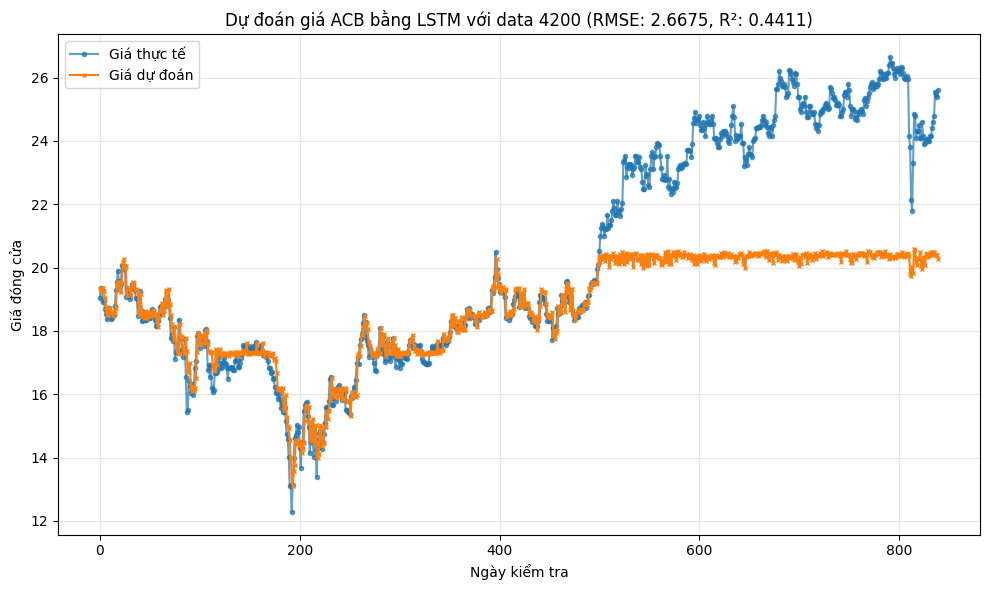

Hoàn thành: R² = 0.4411, RMSE = 2.6675
Đang xử lý với 4300 ngày dữ liệu...


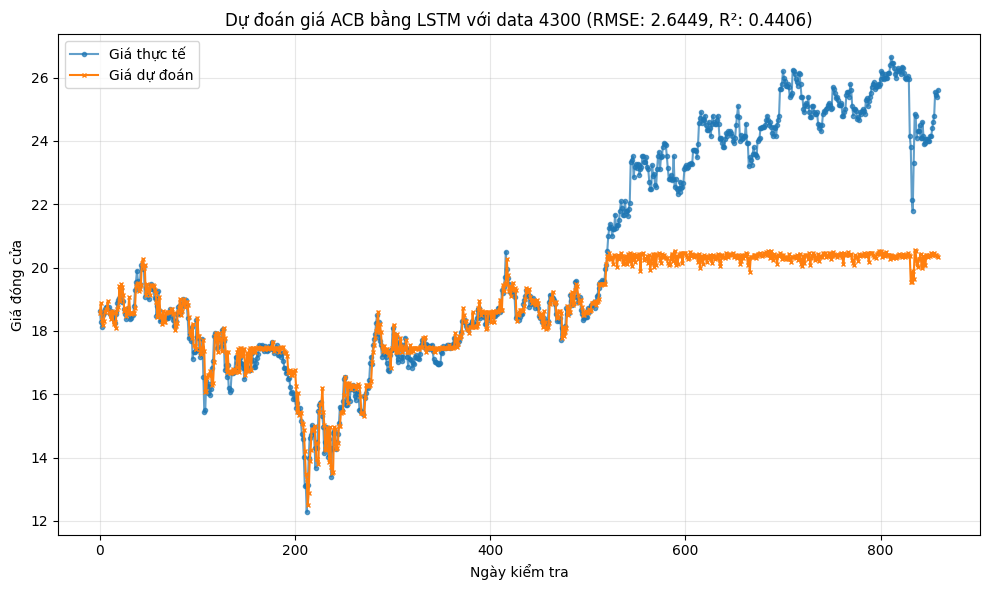

Hoàn thành: R² = 0.4406, RMSE = 2.6449
Đang xử lý với 4400 ngày dữ liệu...


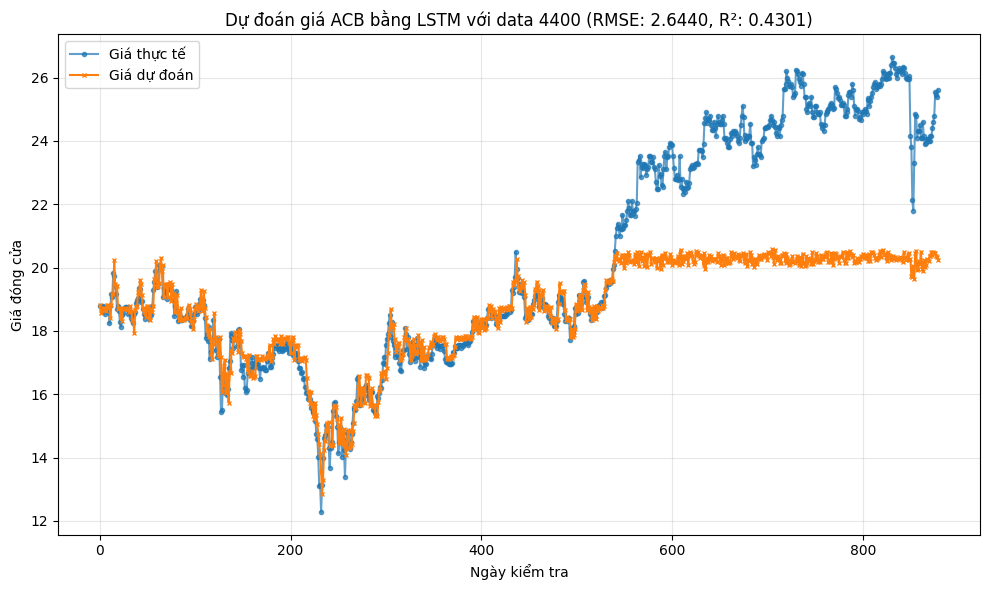

Hoàn thành: R² = 0.4301, RMSE = 2.6440
Đang xử lý với 4500 ngày dữ liệu...


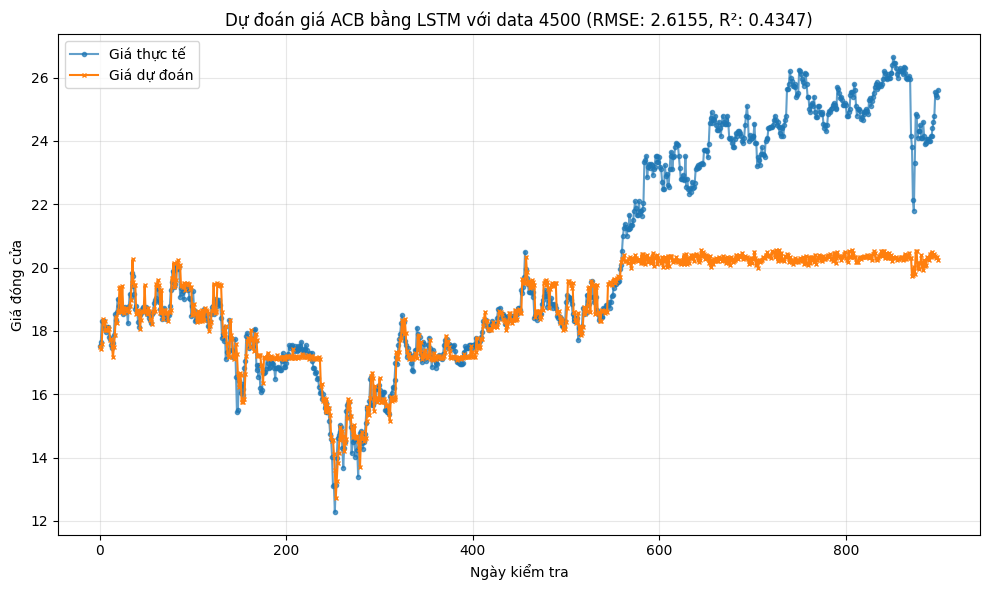

Hoàn thành: R² = 0.4347, RMSE = 2.6155
Đang xử lý với 4600 ngày dữ liệu...


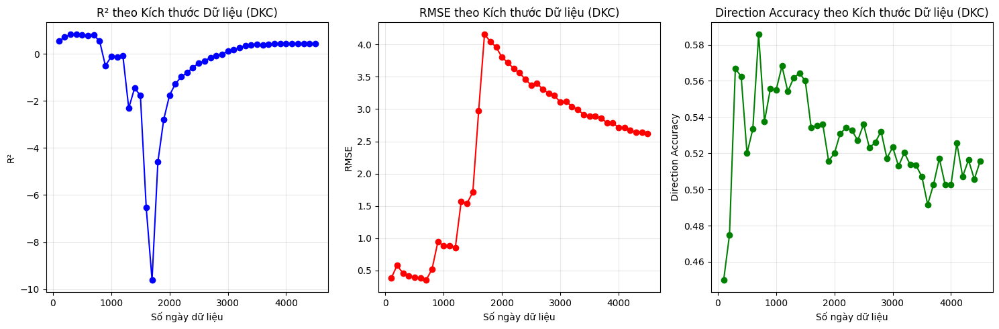

In [23]:
# Đọc dữ liệu
data_path = "E:/Project/StockVNQA_Lâm/train/data/ACB.csv"
df = pd.read_csv(data_path)
print(f"Tổng số ngày dữ liệu của DKC: {len(df)}")

# Khởi tạo danh sách kết quả
rs = []

# Chạy với các kích thước dữ liệu khác nhau
for i in range(100, len(df)+1, 100):
    print(f"Đang xử lý với {i} ngày dữ liệu...")
    result = train_with_data_size("ACB", num_days=i)
    if result is not None:  # Chỉ thêm vào khi kết quả không phải None
        rs.append(result)
        print(f"Hoàn thành: R² = {result['r2']:.4f}, RMSE = {result['rmse']:.4f}")

# Tạo DataFrame từ kết quả
if len(rs) == 0:
    print("Không có kết quả hợp lệ để hiển thị")
else:
    result_df = pd.DataFrame(rs)
    
    # Tạo figure trước khi vẽ subplots
    plt.figure(figsize=(15, 5))
    
    # Vẽ biểu đồ R² theo kích thước dữ liệu
    plt.subplot(1, 3, 1)
    plt.plot(result_df['data_days'], result_df['r2'], marker='o', linestyle='-', color='blue')
    plt.title('R² theo Kích thước Dữ liệu (DKC)', fontsize=12)
    plt.xlabel('Số ngày dữ liệu')
    plt.ylabel('R²')
    plt.grid(True, alpha=0.3)
    
    # Vẽ biểu đồ RMSE theo kích thước dữ liệu
    plt.subplot(1, 3, 2)
    plt.plot(result_df['data_days'], result_df['rmse'], marker='o', linestyle='-', color='red')
    plt.title('RMSE theo Kích thước Dữ liệu (DKC)', fontsize=12)
    plt.xlabel('Số ngày dữ liệu')
    plt.ylabel('RMSE')
    plt.grid(True, alpha=0.3)
    
    # Vẽ đồ thị Direction Accuracy theo số ngày
    plt.subplot(1, 3, 3)
    plt.plot(result_df['data_days'], result_df['direction_accuracy'], marker='o', linestyle='-', color='green')
    plt.title('Direction Accuracy theo Kích thước Dữ liệu (DKC)', fontsize=12)
    plt.xlabel('Số ngày dữ liệu')
    plt.ylabel('Direction Accuracy')
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()  # Tự động điều chỉnh layout
    
    # Lưu hình ảnh
    
    # Hiển thị biểu đồ
    plt.show()
    


Tổng số ngày dữ liệu của DKC: 4591
Đang xử lý với 100 ngày dữ liệu...


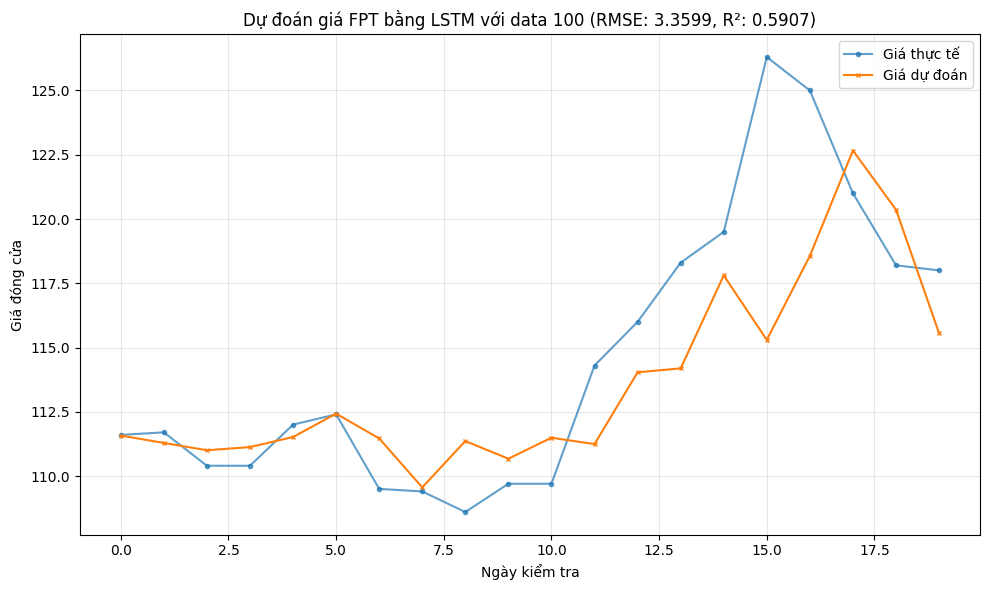

Hoàn thành: R² = 0.5907, RMSE = 3.3599
Đang xử lý với 200 ngày dữ liệu...


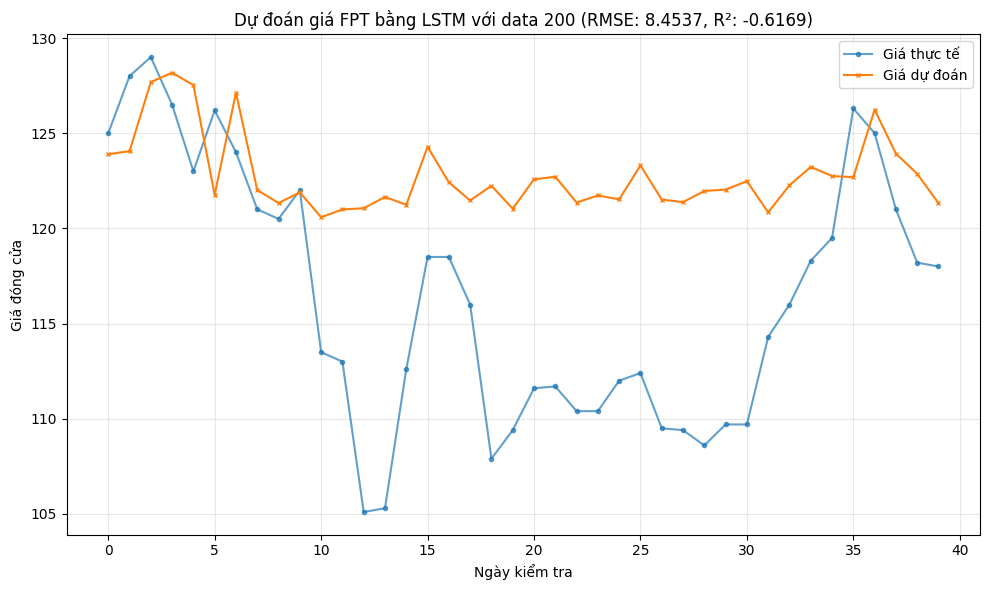

Hoàn thành: R² = -0.6169, RMSE = 8.4537
Đang xử lý với 300 ngày dữ liệu...


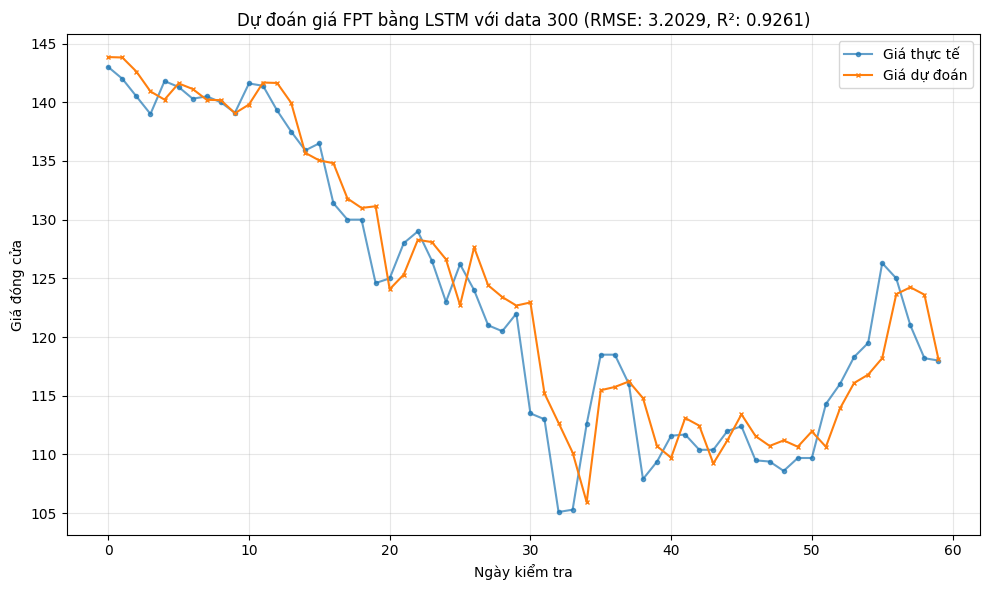

Hoàn thành: R² = 0.9261, RMSE = 3.2029
Đang xử lý với 400 ngày dữ liệu...


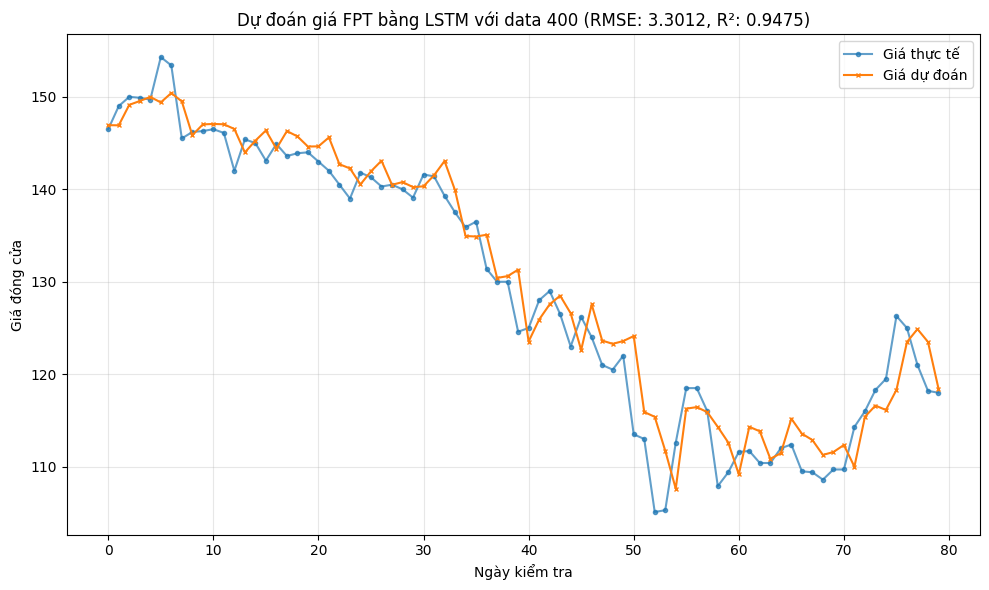

Hoàn thành: R² = 0.9475, RMSE = 3.3012
Đang xử lý với 500 ngày dữ liệu...


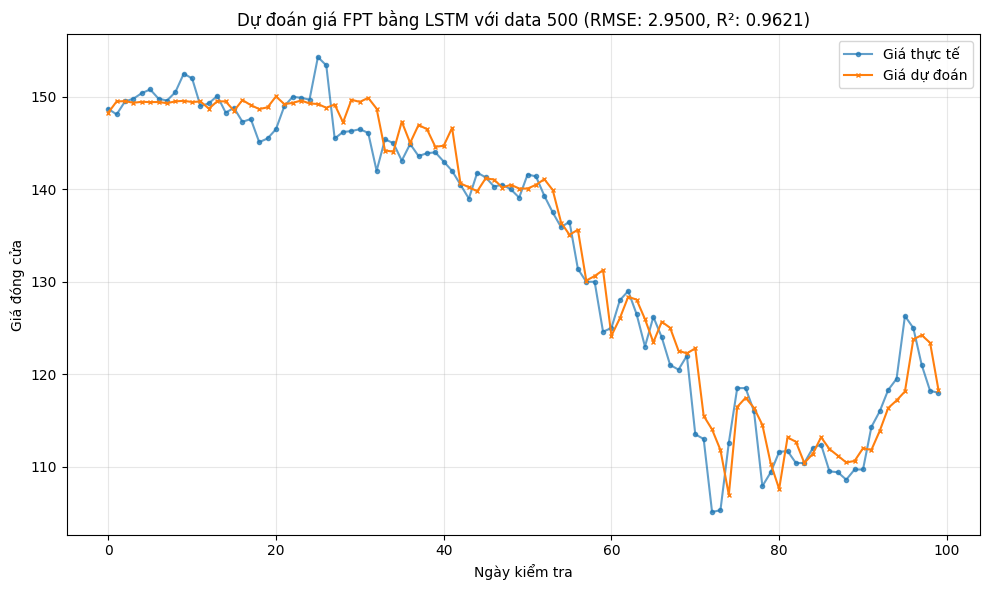

Hoàn thành: R² = 0.9621, RMSE = 2.9500
Đang xử lý với 600 ngày dữ liệu...


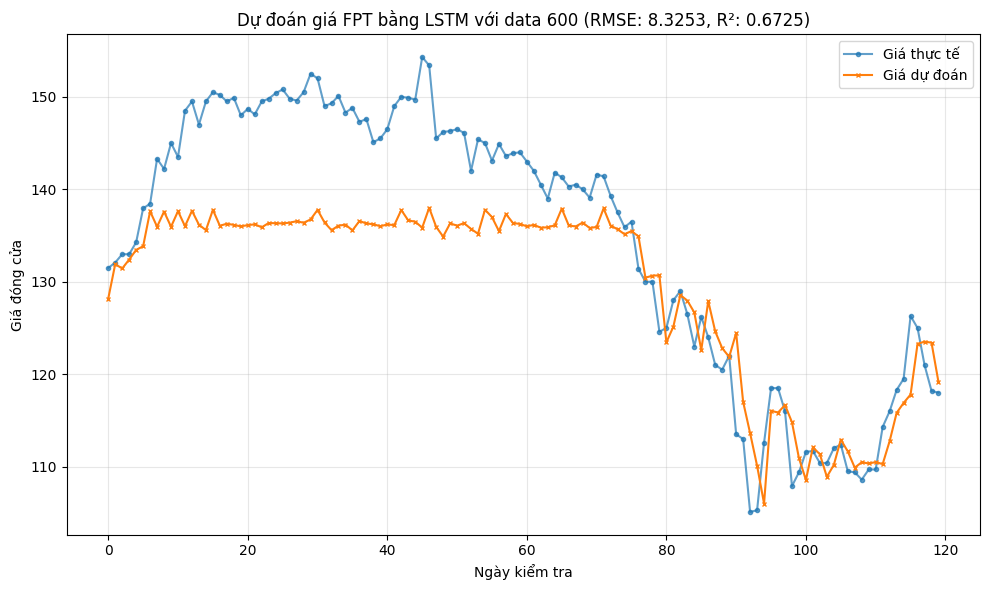

Hoàn thành: R² = 0.6725, RMSE = 8.3253
Đang xử lý với 700 ngày dữ liệu...


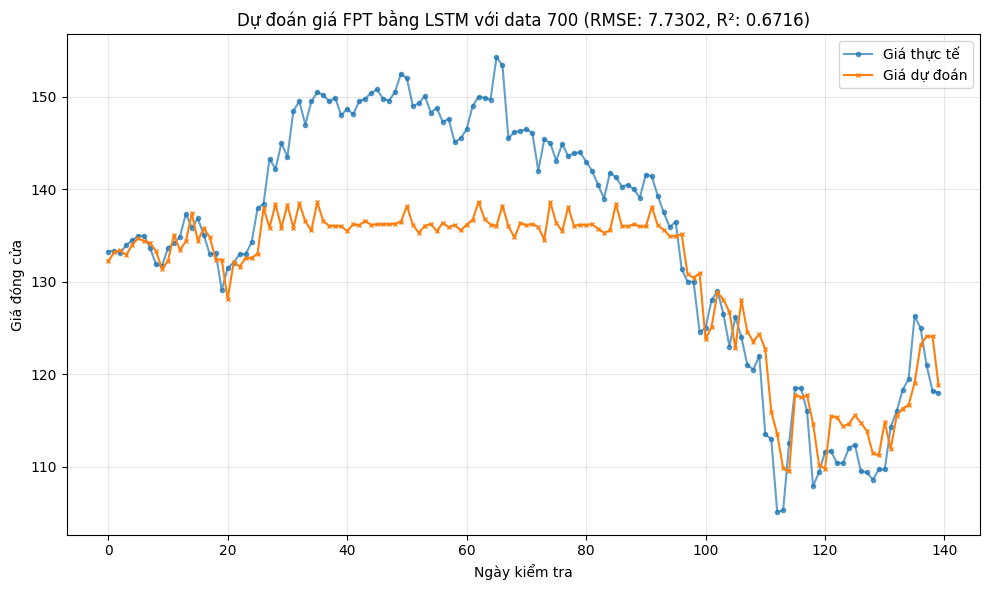

Hoàn thành: R² = 0.6716, RMSE = 7.7302
Đang xử lý với 800 ngày dữ liệu...


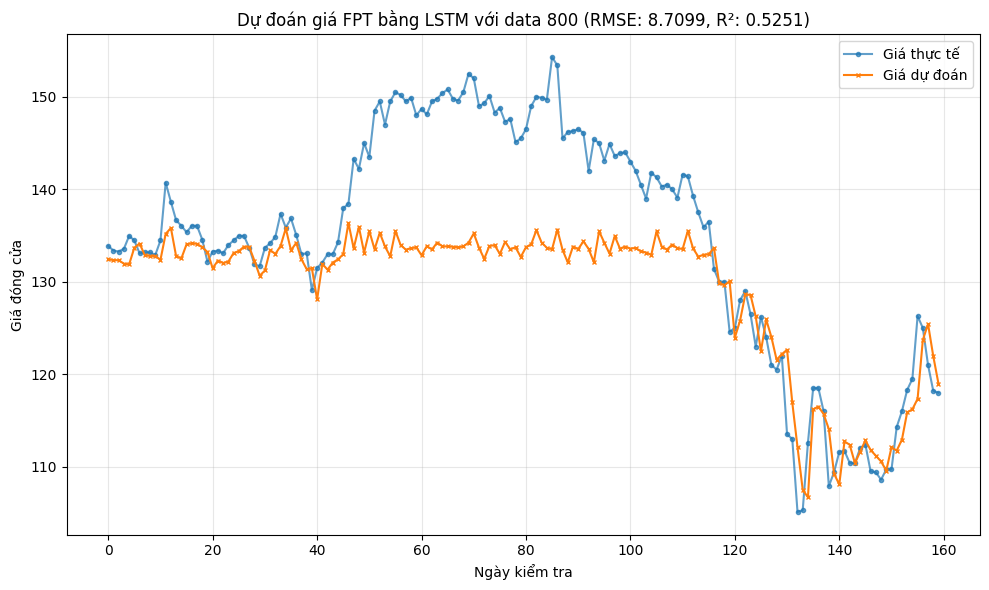

Hoàn thành: R² = 0.5251, RMSE = 8.7099
Đang xử lý với 900 ngày dữ liệu...


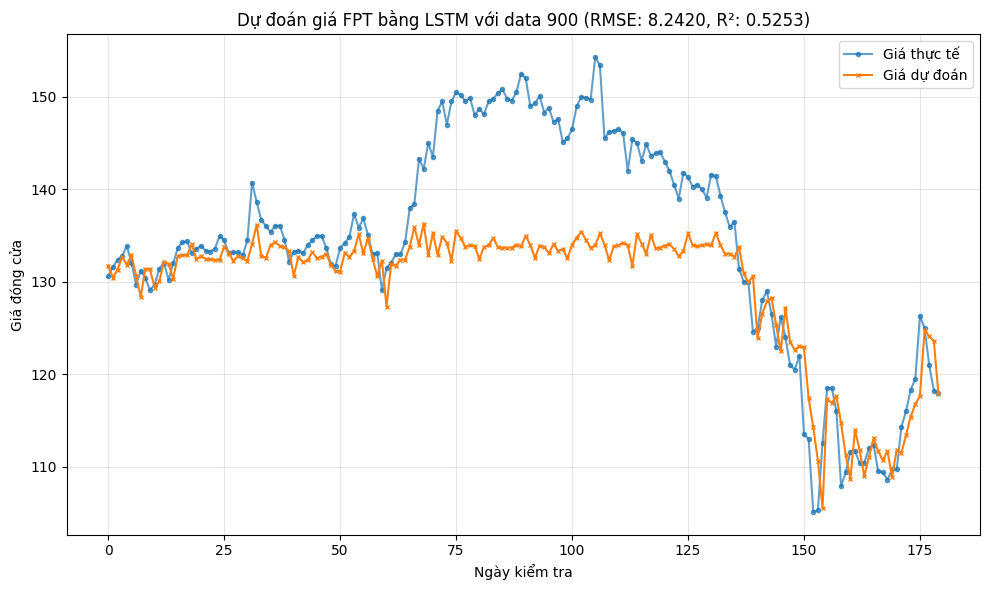

Hoàn thành: R² = 0.5253, RMSE = 8.2420
Đang xử lý với 1000 ngày dữ liệu...


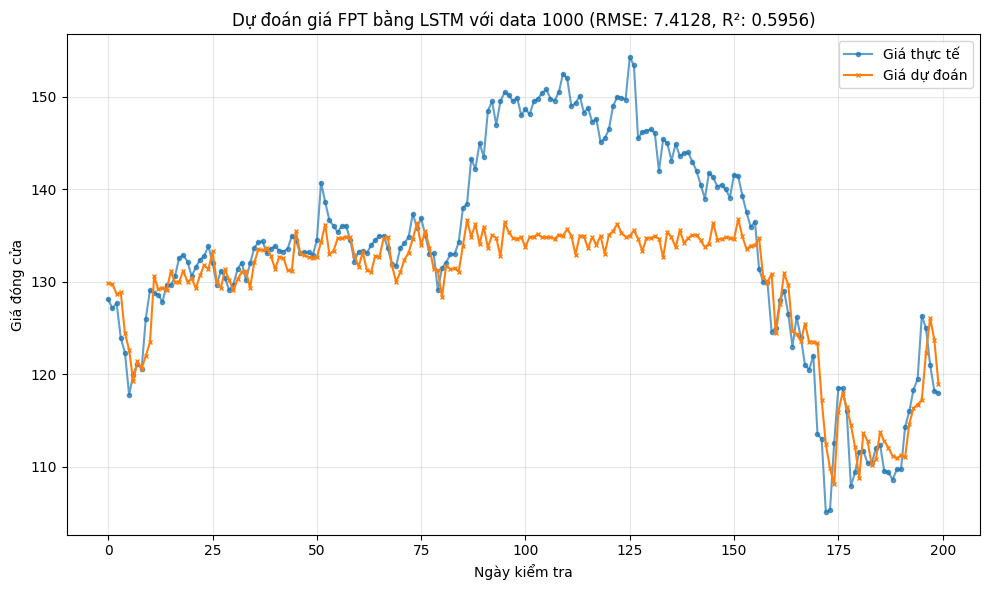

Hoàn thành: R² = 0.5956, RMSE = 7.4128
Đang xử lý với 1100 ngày dữ liệu...


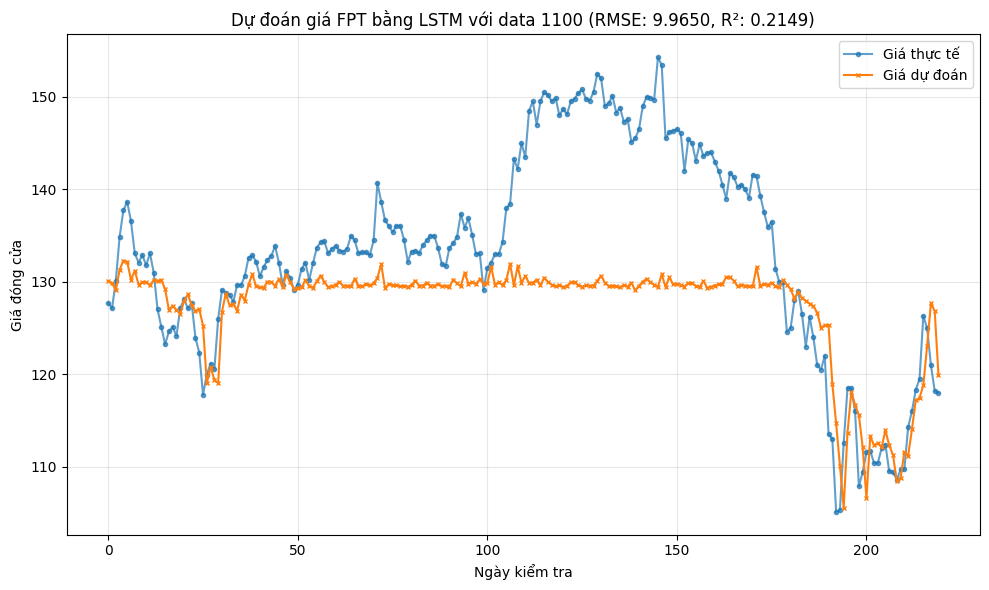

Hoàn thành: R² = 0.2149, RMSE = 9.9650
Đang xử lý với 1200 ngày dữ liệu...


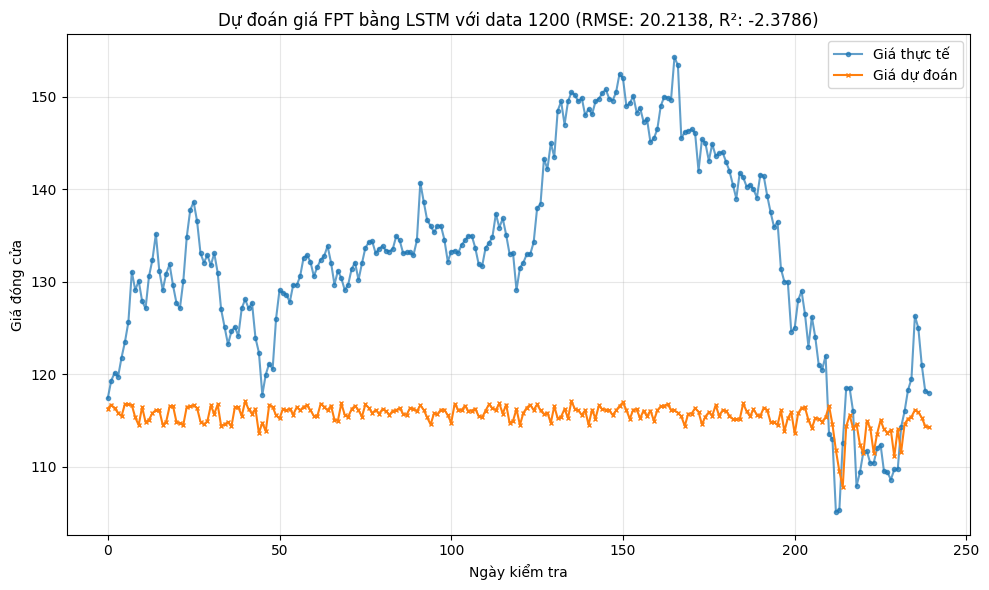

Hoàn thành: R² = -2.3786, RMSE = 20.2138
Đang xử lý với 1300 ngày dữ liệu...


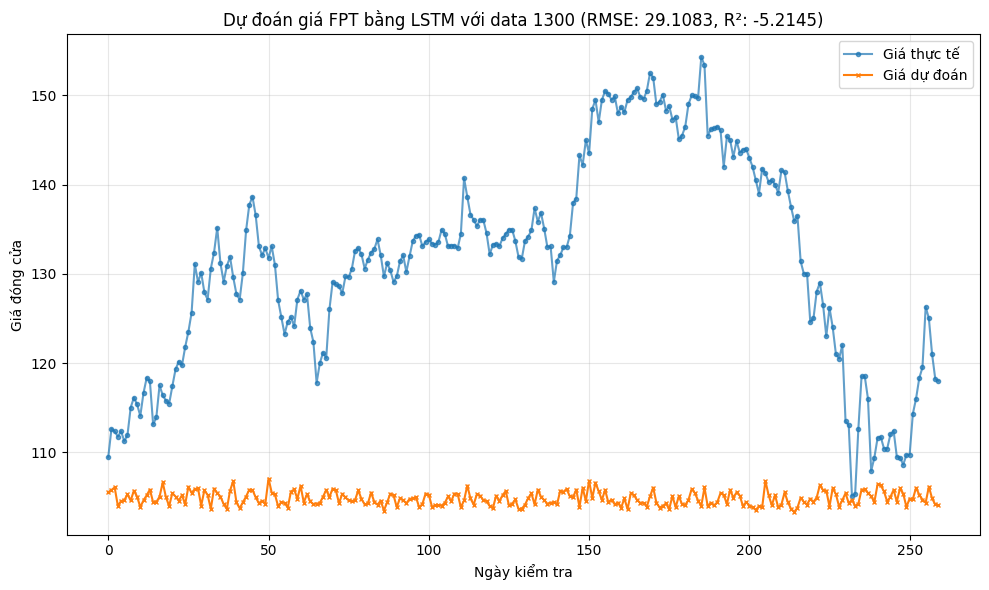

Hoàn thành: R² = -5.2145, RMSE = 29.1083
Đang xử lý với 1400 ngày dữ liệu...


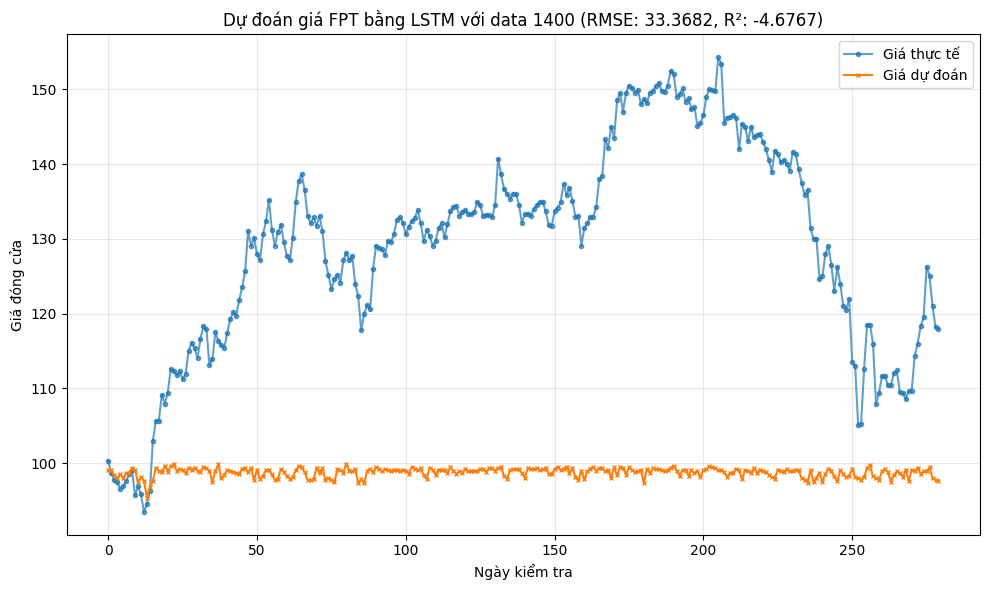

Hoàn thành: R² = -4.6767, RMSE = 33.3682
Đang xử lý với 1500 ngày dữ liệu...


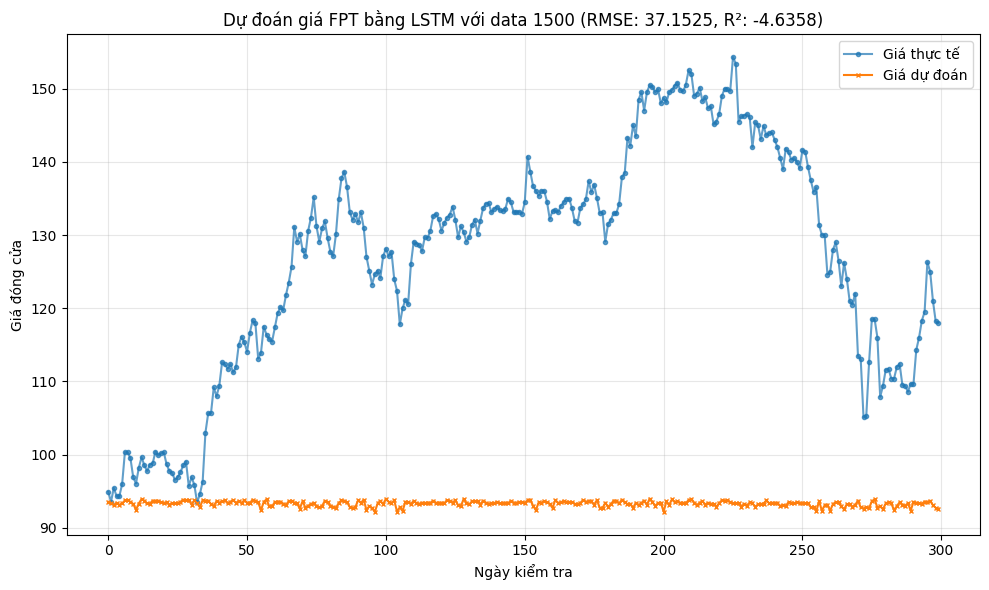

Hoàn thành: R² = -4.6358, RMSE = 37.1525
Đang xử lý với 1600 ngày dữ liệu...


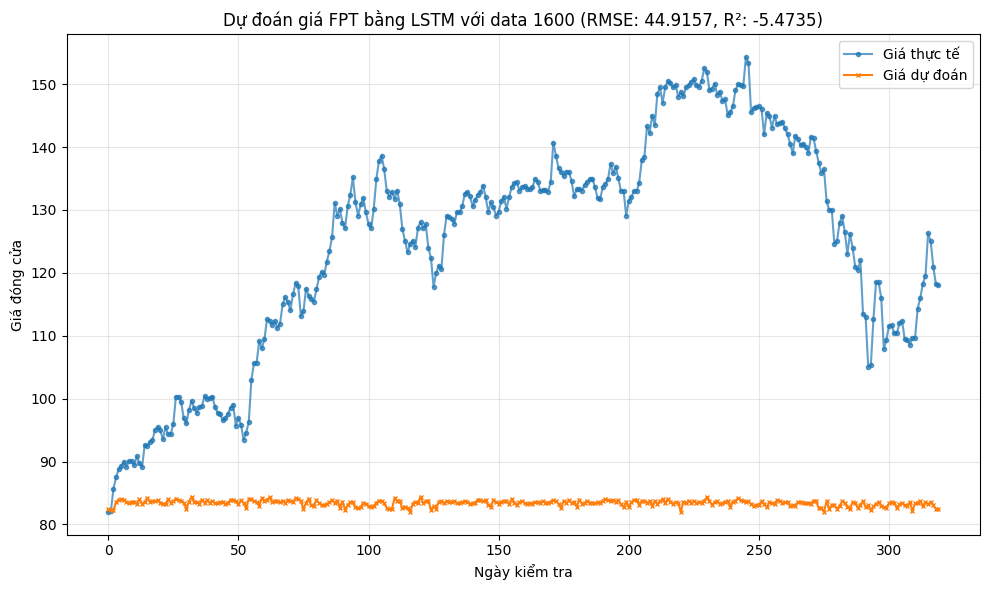

Hoàn thành: R² = -5.4735, RMSE = 44.9157
Đang xử lý với 1700 ngày dữ liệu...


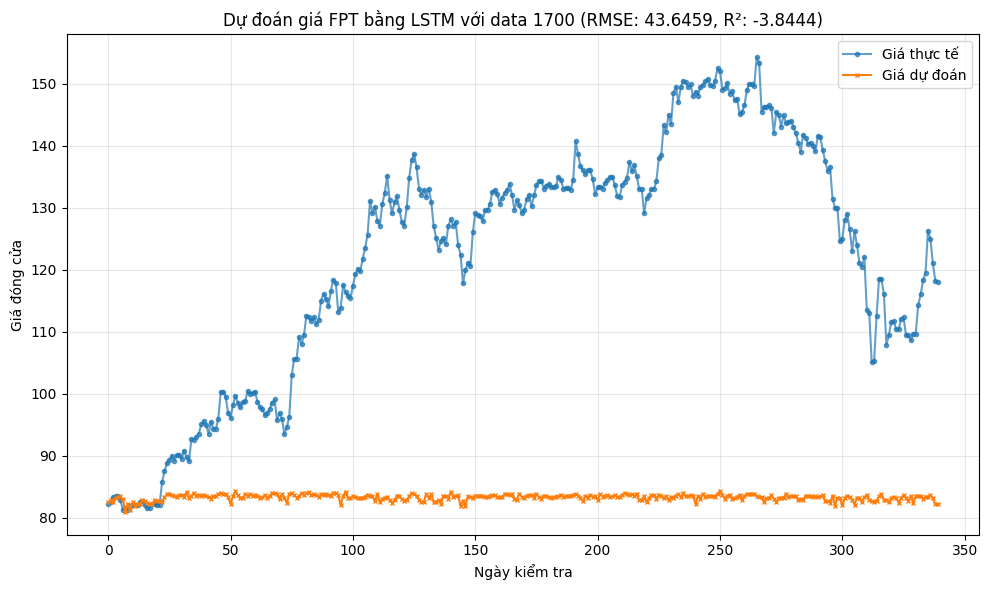

Hoàn thành: R² = -3.8444, RMSE = 43.6459
Đang xử lý với 1800 ngày dữ liệu...


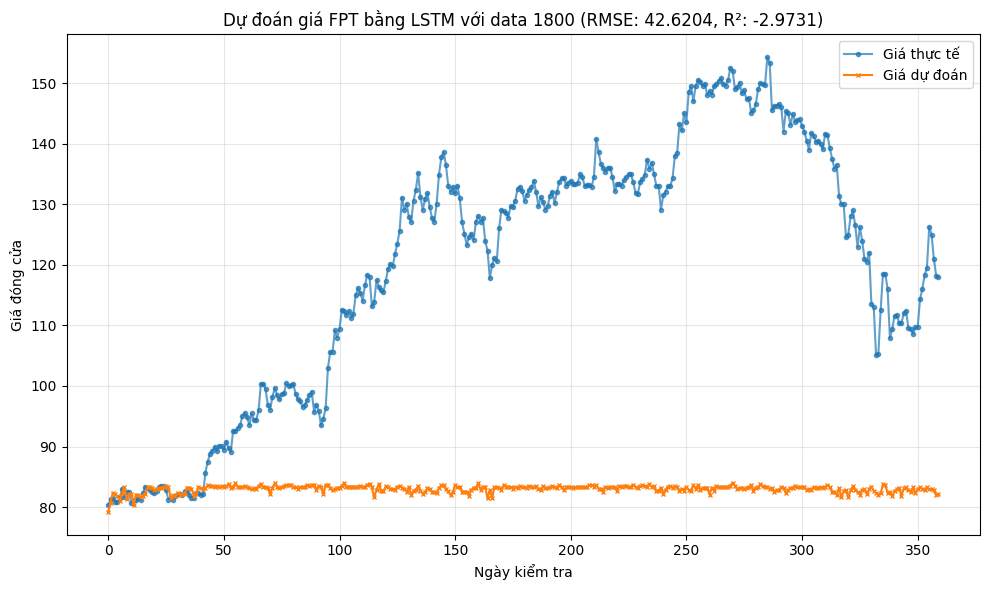

Hoàn thành: R² = -2.9731, RMSE = 42.6204
Đang xử lý với 1900 ngày dữ liệu...


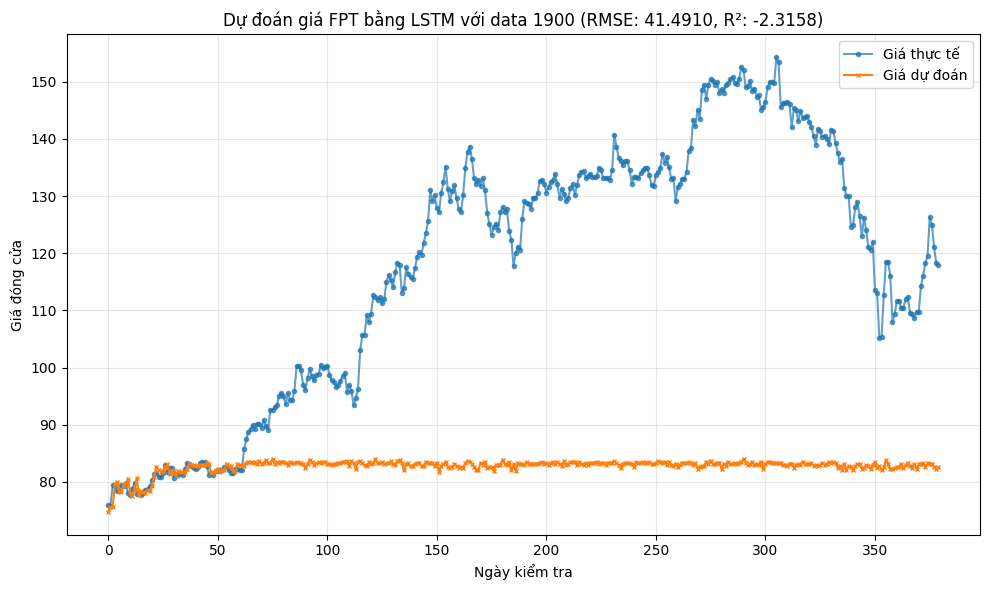

Hoàn thành: R² = -2.3158, RMSE = 41.4910
Đang xử lý với 2000 ngày dữ liệu...


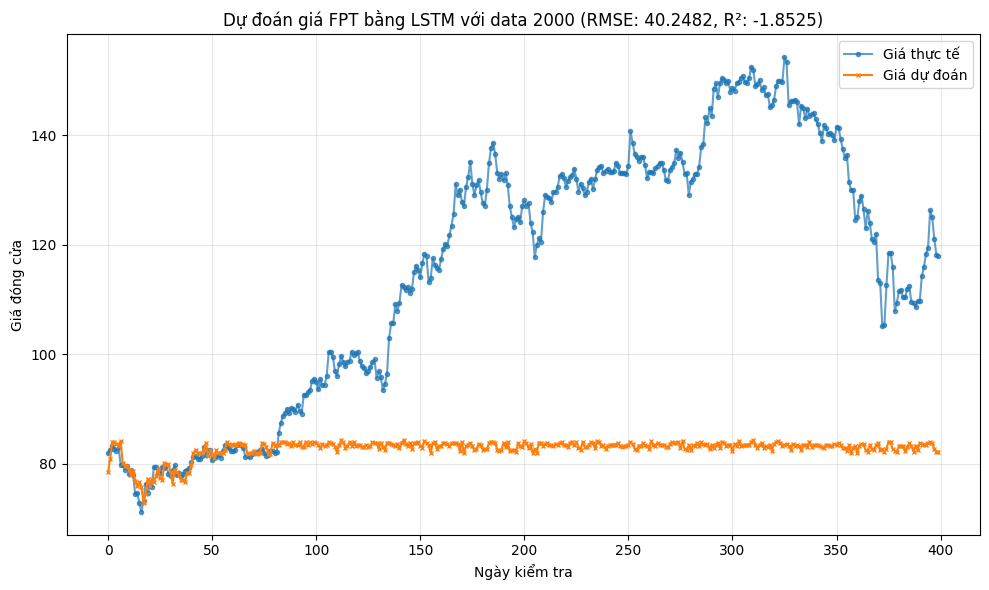

Hoàn thành: R² = -1.8525, RMSE = 40.2482
Đang xử lý với 2100 ngày dữ liệu...


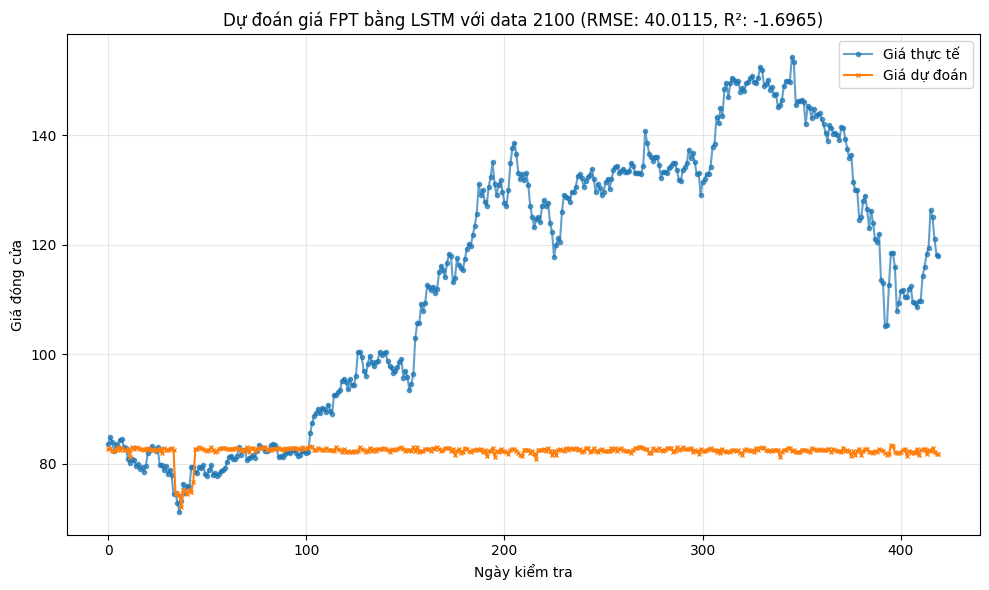

Hoàn thành: R² = -1.6965, RMSE = 40.0115
Đang xử lý với 2200 ngày dữ liệu...


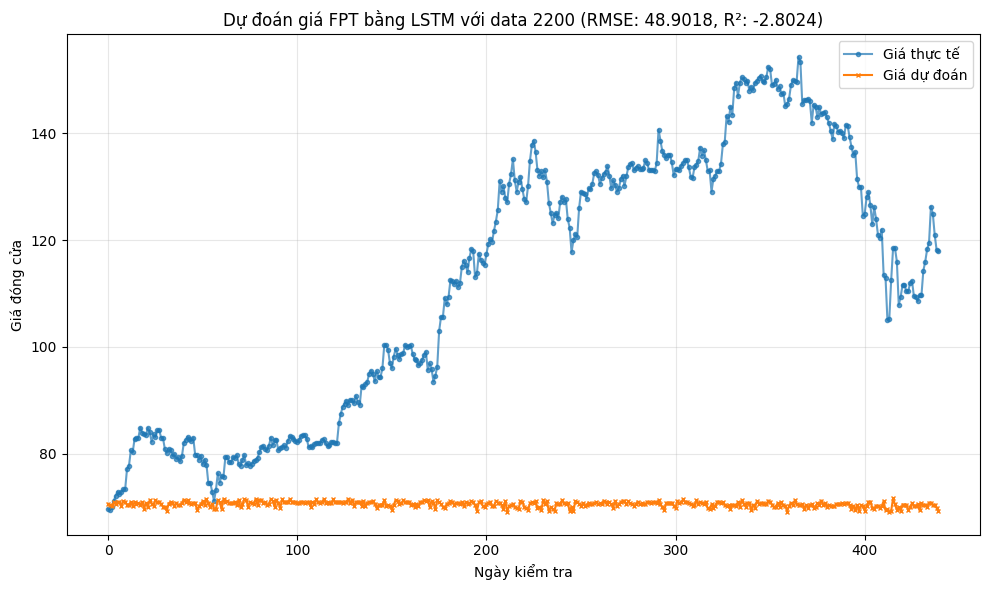

Hoàn thành: R² = -2.8024, RMSE = 48.9018
Đang xử lý với 2300 ngày dữ liệu...


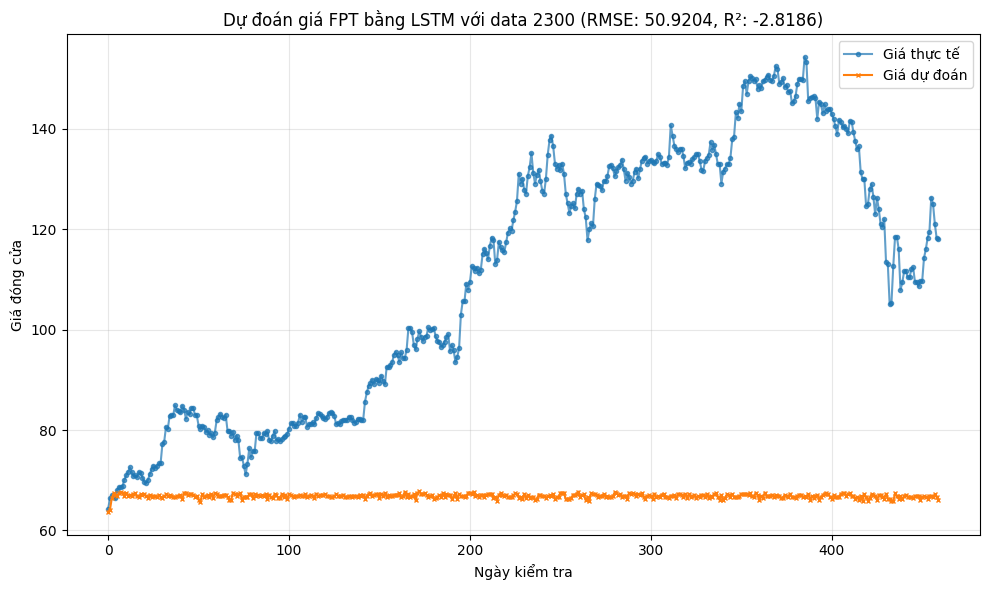

Hoàn thành: R² = -2.8186, RMSE = 50.9204
Đang xử lý với 2400 ngày dữ liệu...


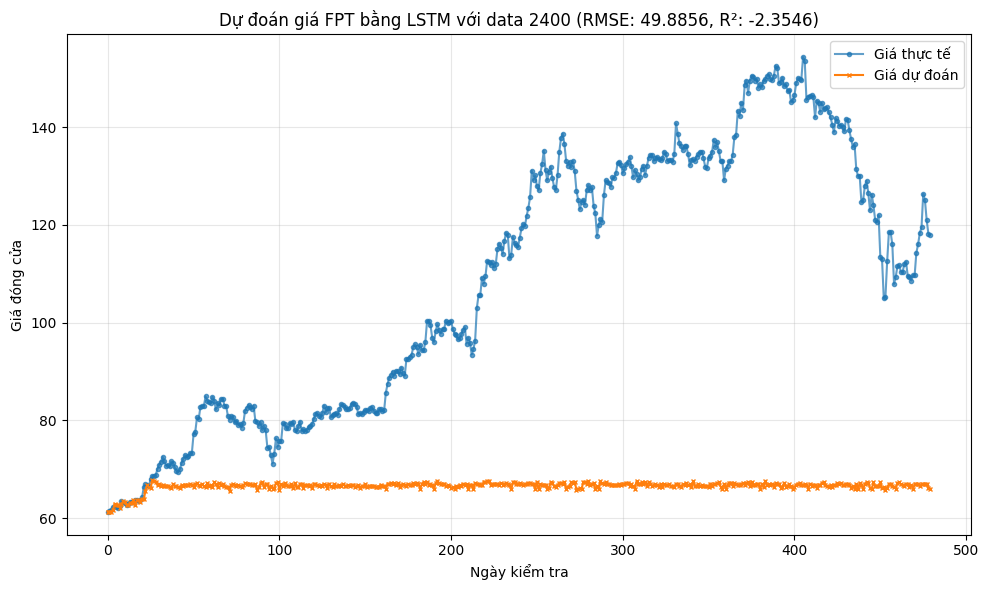

Hoàn thành: R² = -2.3546, RMSE = 49.8856
Đang xử lý với 2500 ngày dữ liệu...


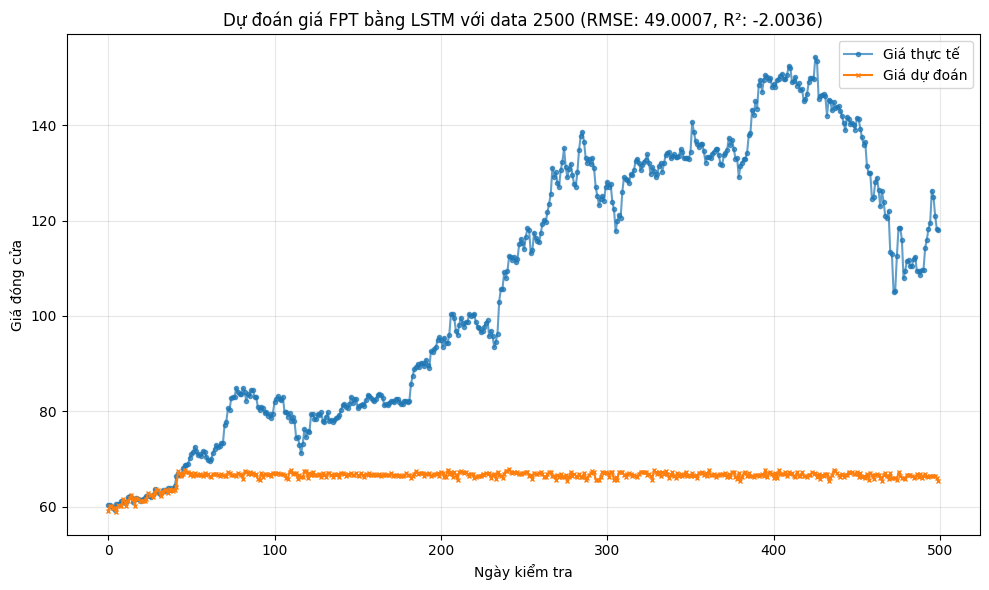

Hoàn thành: R² = -2.0036, RMSE = 49.0007
Đang xử lý với 2600 ngày dữ liệu...


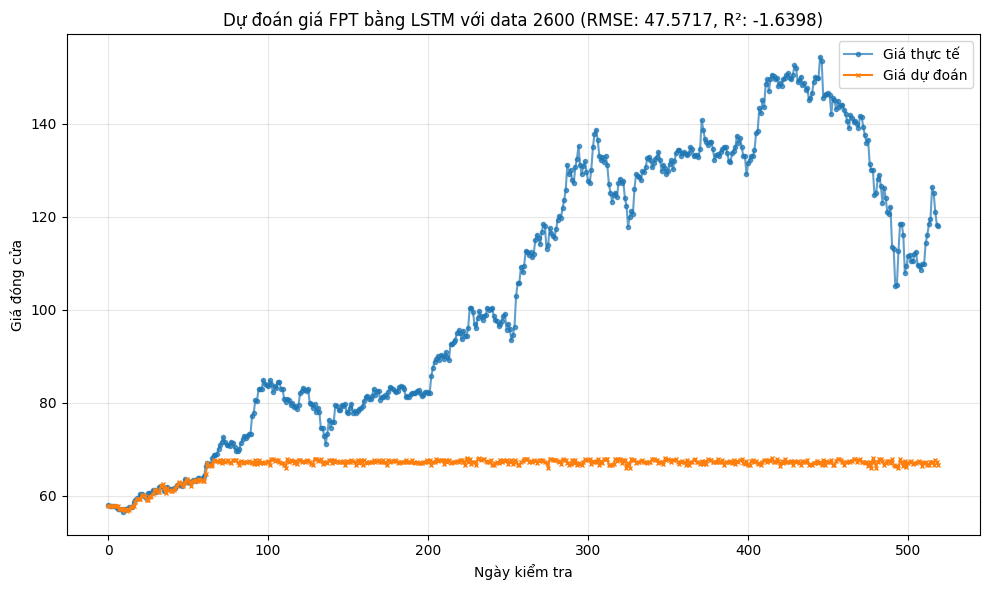

Hoàn thành: R² = -1.6398, RMSE = 47.5717
Đang xử lý với 2700 ngày dữ liệu...


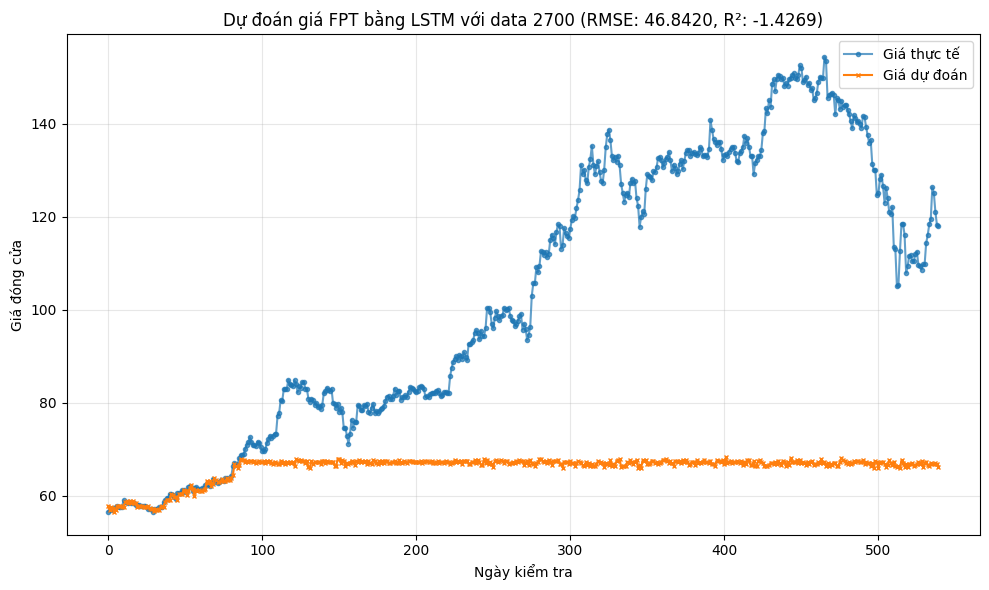

Hoàn thành: R² = -1.4269, RMSE = 46.8420
Đang xử lý với 2800 ngày dữ liệu...


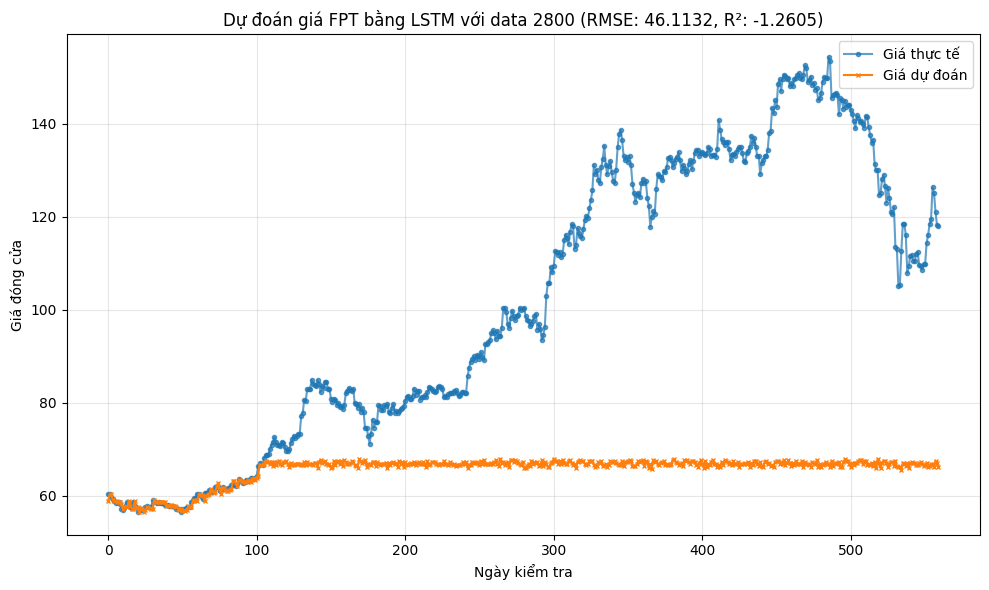

Hoàn thành: R² = -1.2605, RMSE = 46.1132
Đang xử lý với 2900 ngày dữ liệu...


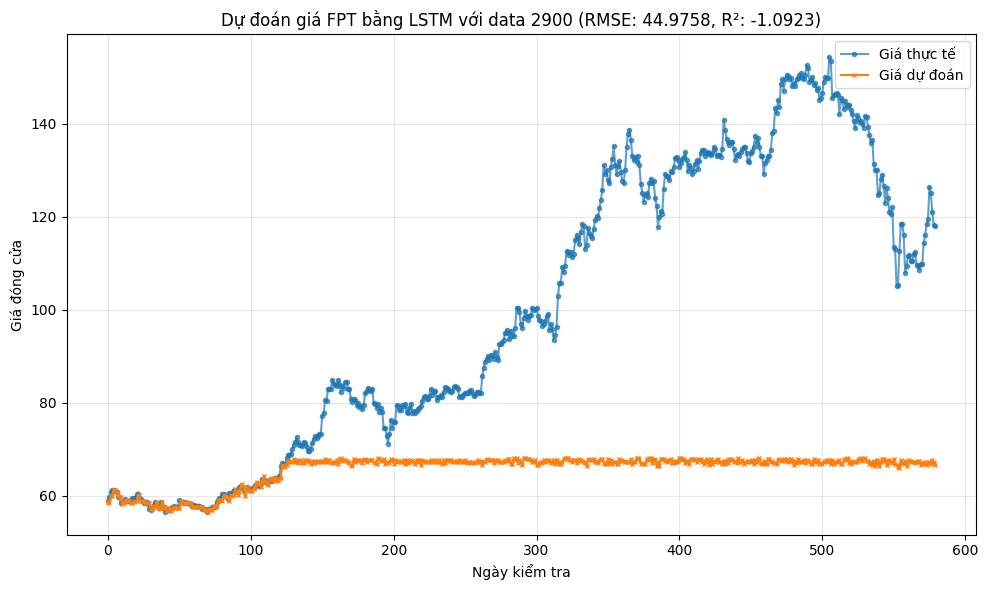

Hoàn thành: R² = -1.0923, RMSE = 44.9758
Đang xử lý với 3000 ngày dữ liệu...


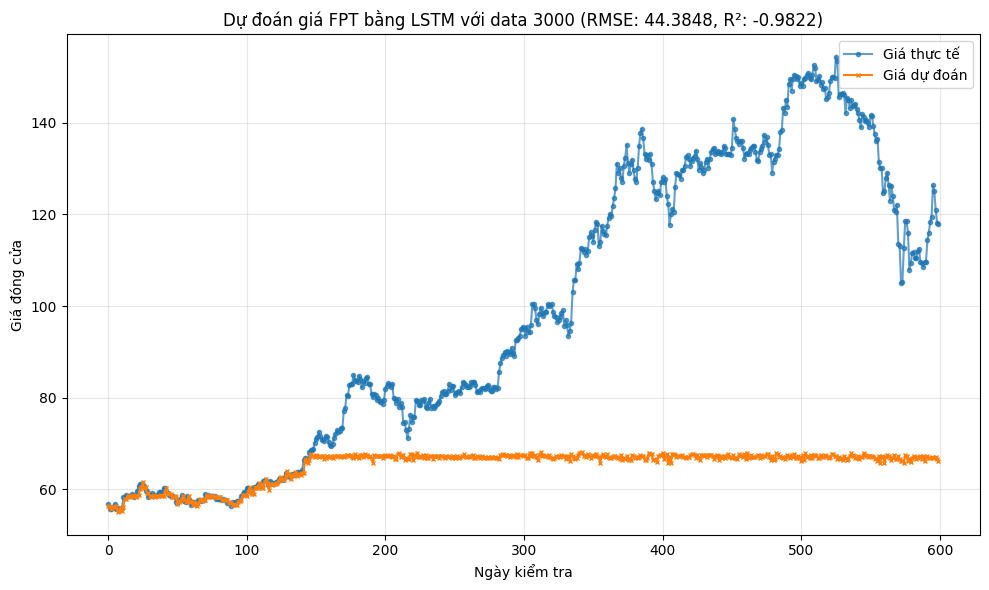

Hoàn thành: R² = -0.9822, RMSE = 44.3848
Đang xử lý với 3100 ngày dữ liệu...


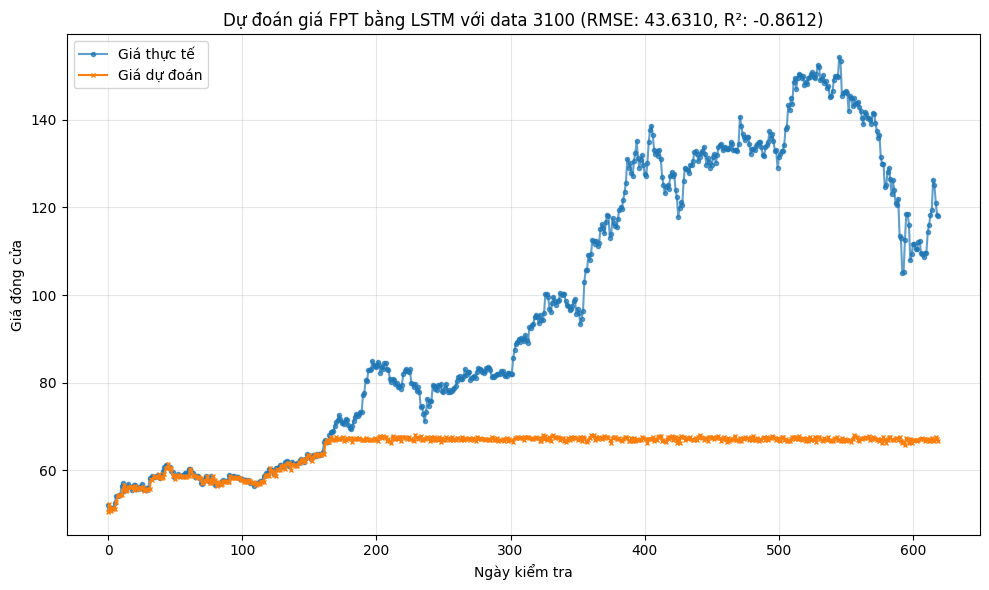

Hoàn thành: R² = -0.8612, RMSE = 43.6310
Đang xử lý với 3200 ngày dữ liệu...


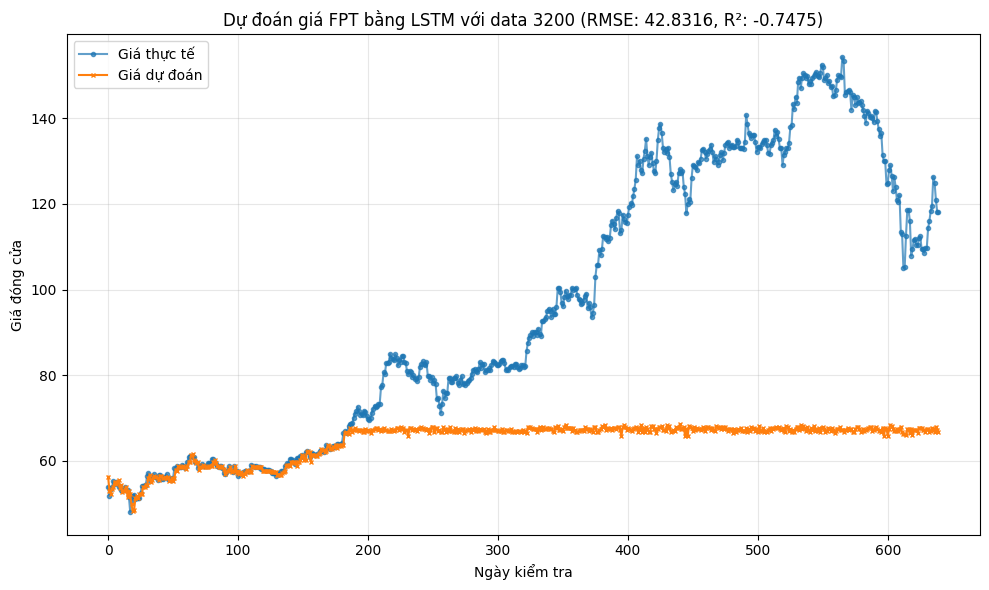

Hoàn thành: R² = -0.7475, RMSE = 42.8316
Đang xử lý với 3300 ngày dữ liệu...


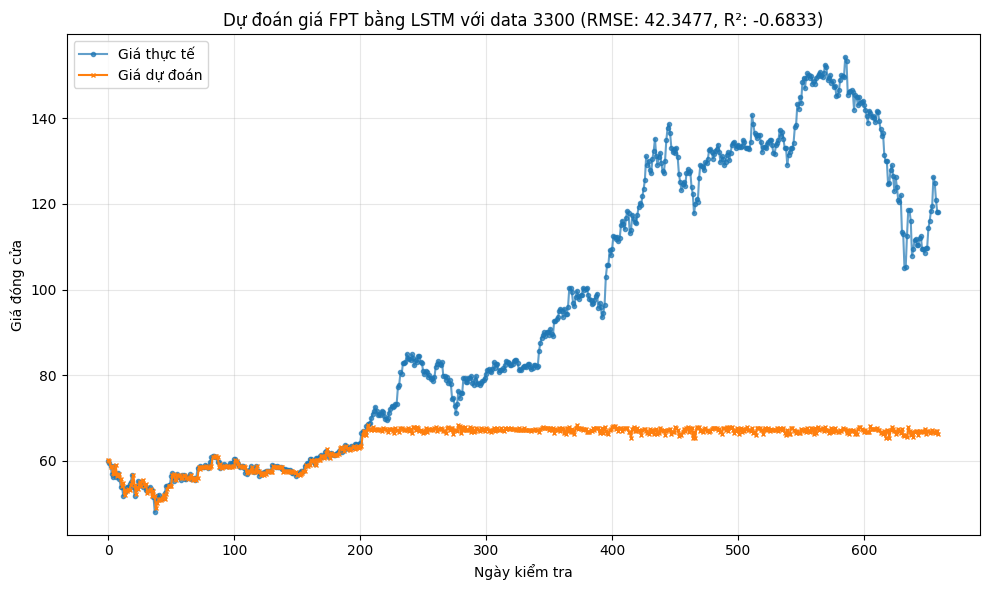

Hoàn thành: R² = -0.6833, RMSE = 42.3477
Đang xử lý với 3400 ngày dữ liệu...


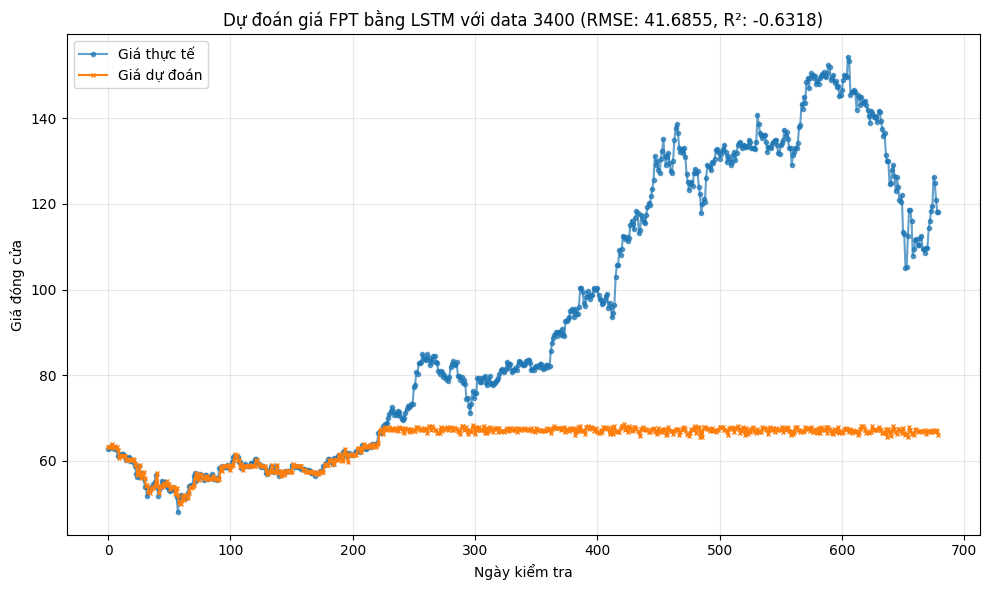

Hoàn thành: R² = -0.6318, RMSE = 41.6855
Đang xử lý với 3500 ngày dữ liệu...


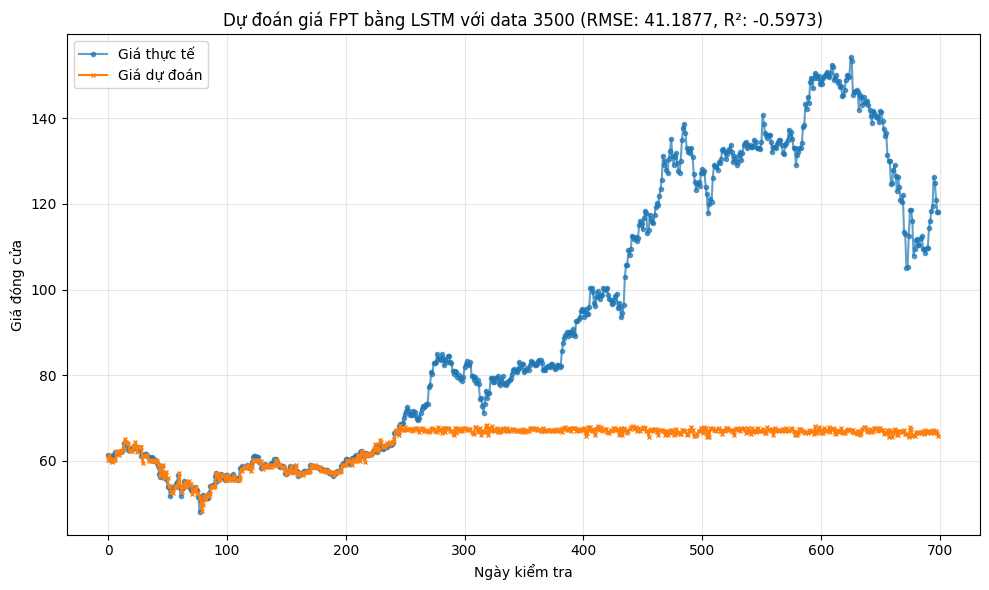

Hoàn thành: R² = -0.5973, RMSE = 41.1877
Đang xử lý với 3600 ngày dữ liệu...


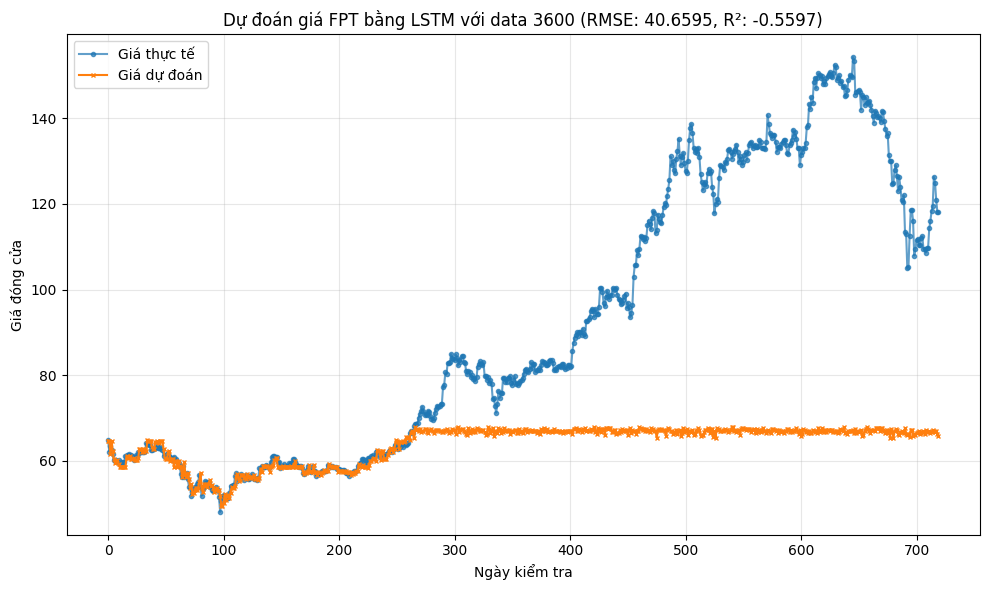

Hoàn thành: R² = -0.5597, RMSE = 40.6595
Đang xử lý với 3700 ngày dữ liệu...


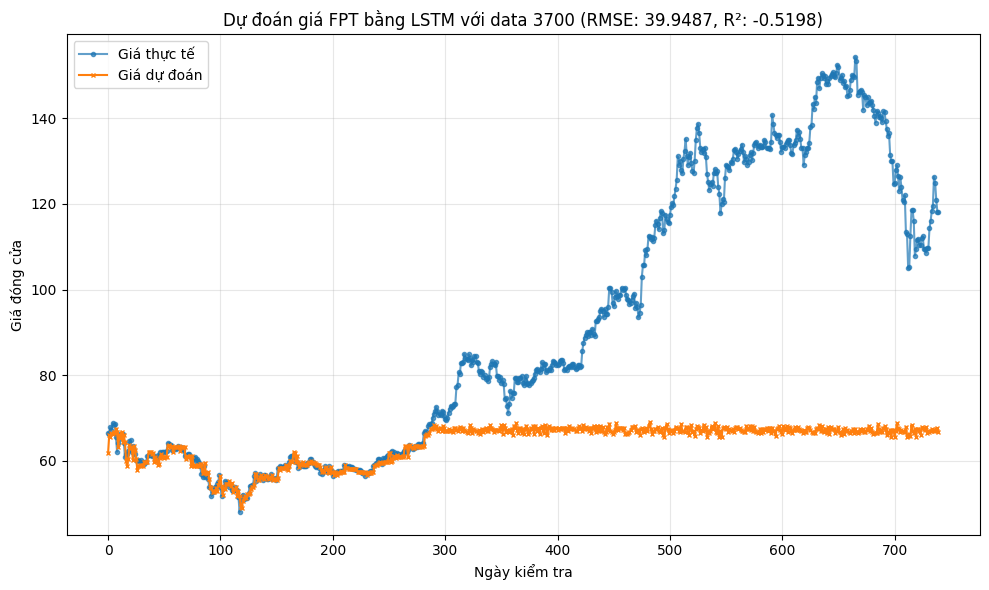

Hoàn thành: R² = -0.5198, RMSE = 39.9487
Đang xử lý với 3800 ngày dữ liệu...


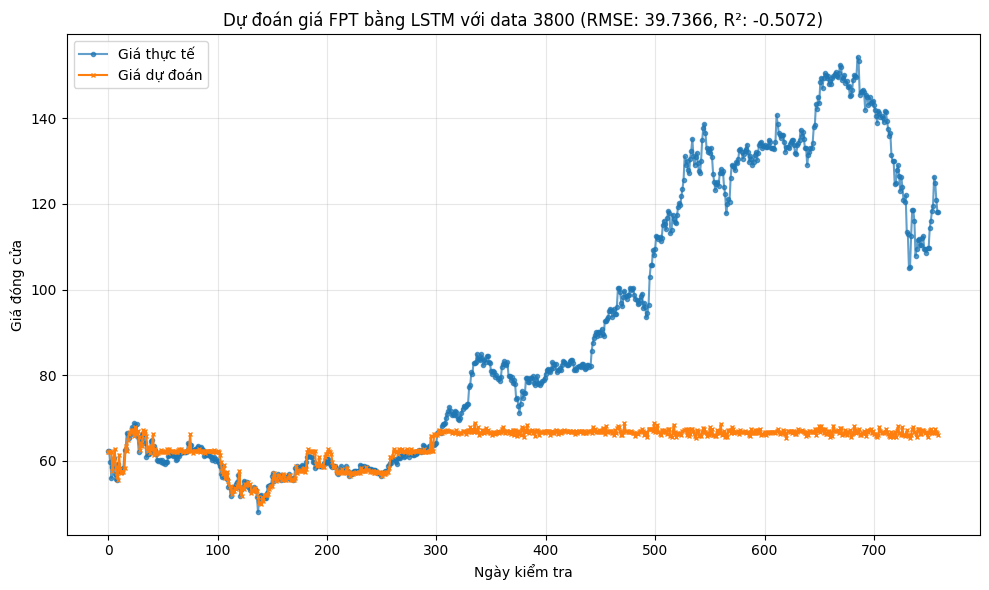

Hoàn thành: R² = -0.5072, RMSE = 39.7366
Đang xử lý với 3900 ngày dữ liệu...


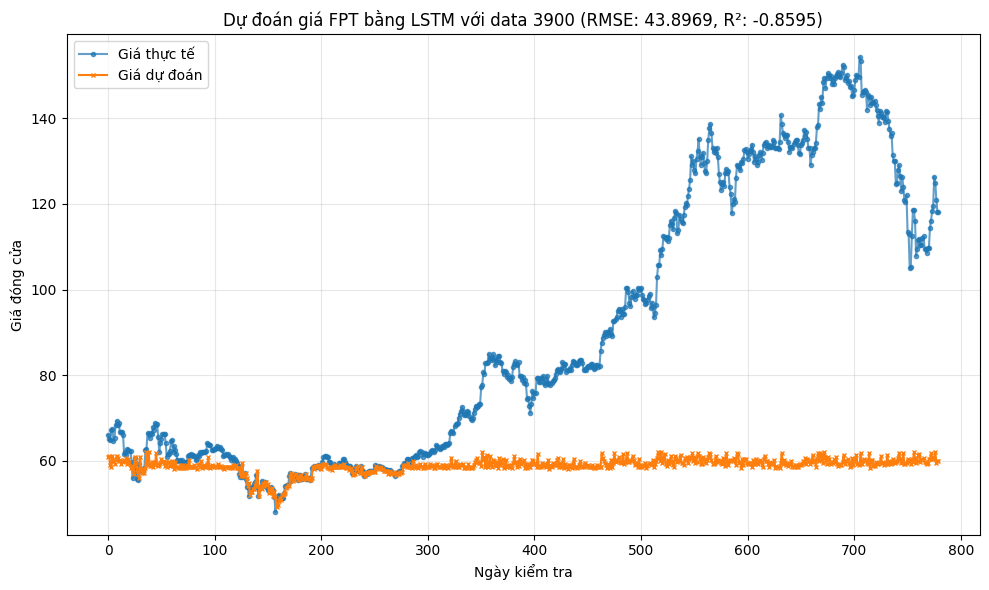

Hoàn thành: R² = -0.8595, RMSE = 43.8969
Đang xử lý với 4000 ngày dữ liệu...


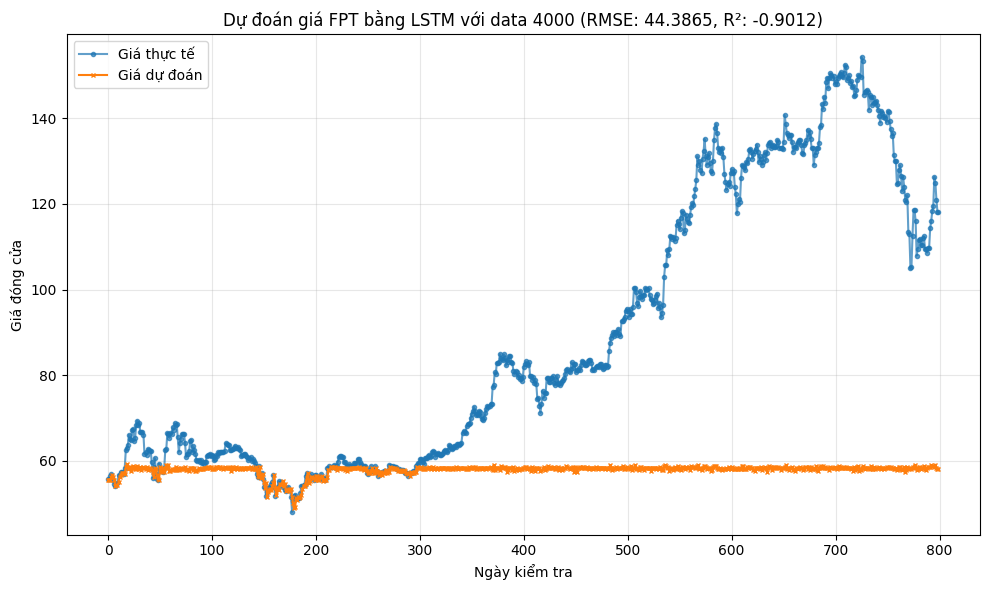

Hoàn thành: R² = -0.9012, RMSE = 44.3865
Đang xử lý với 4100 ngày dữ liệu...


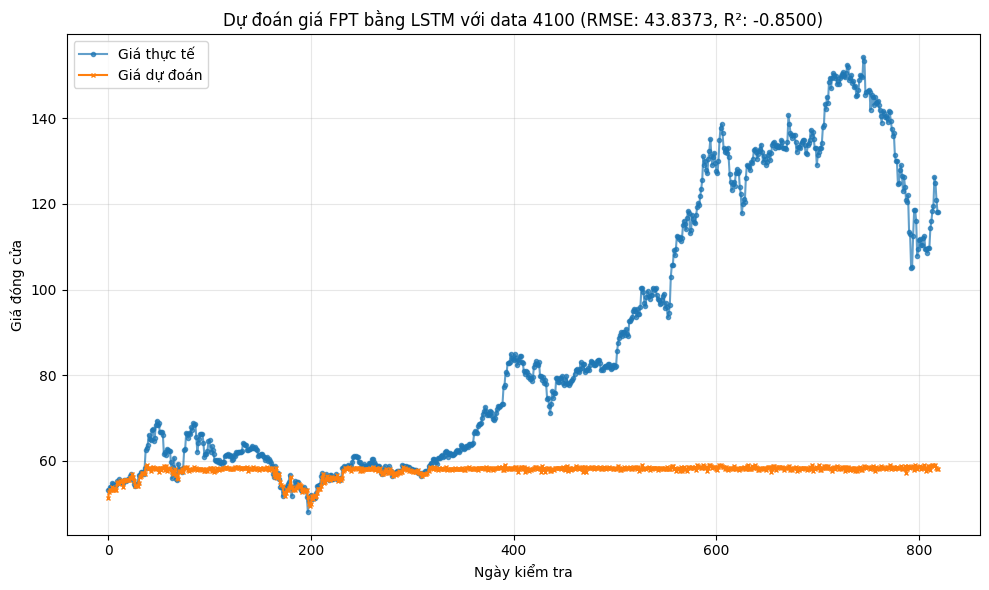

Hoàn thành: R² = -0.8500, RMSE = 43.8373
Đang xử lý với 4200 ngày dữ liệu...


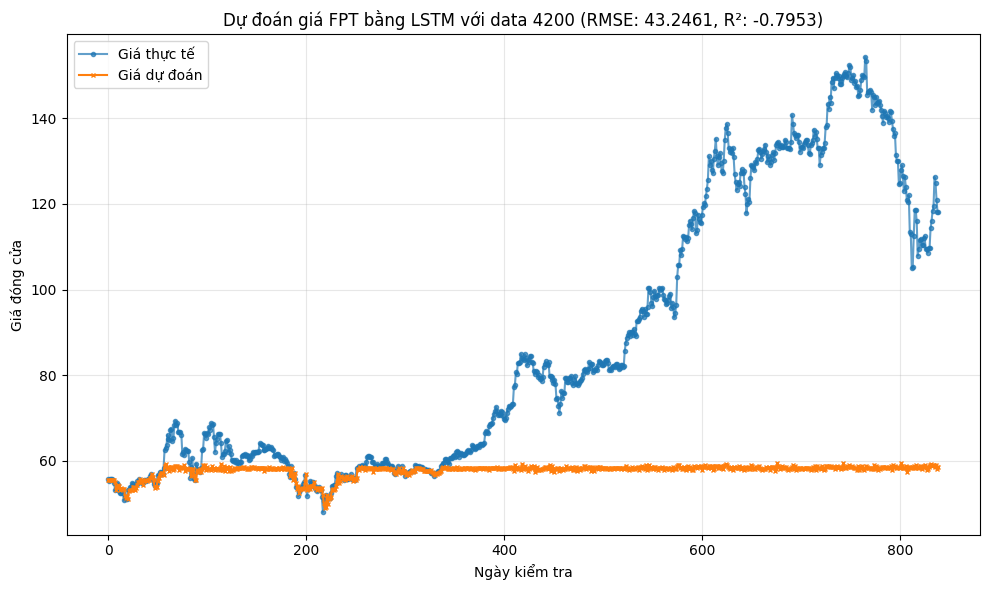

Hoàn thành: R² = -0.7953, RMSE = 43.2461
Đang xử lý với 4300 ngày dữ liệu...


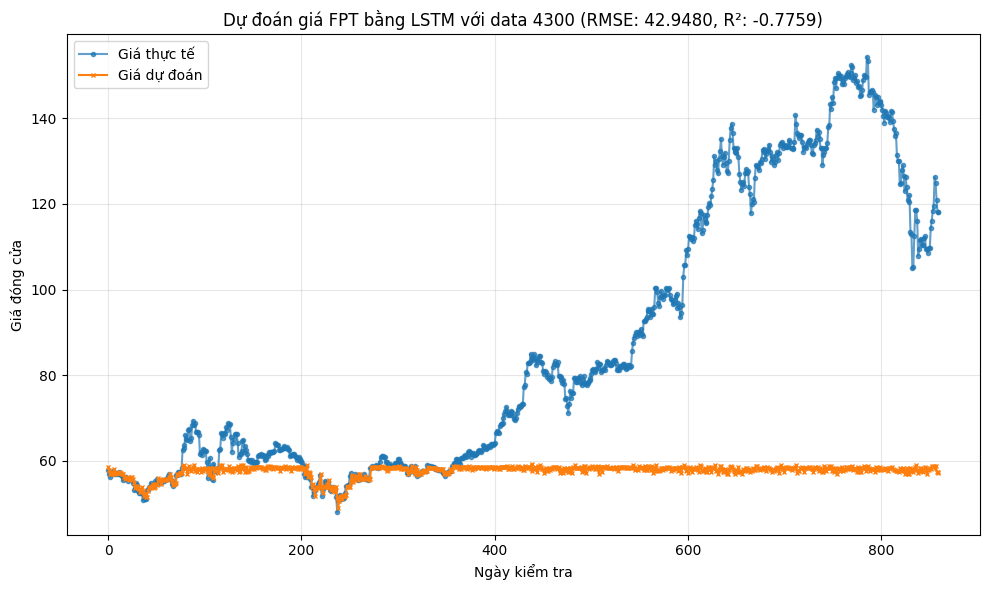

Hoàn thành: R² = -0.7759, RMSE = 42.9480
Đang xử lý với 4400 ngày dữ liệu...


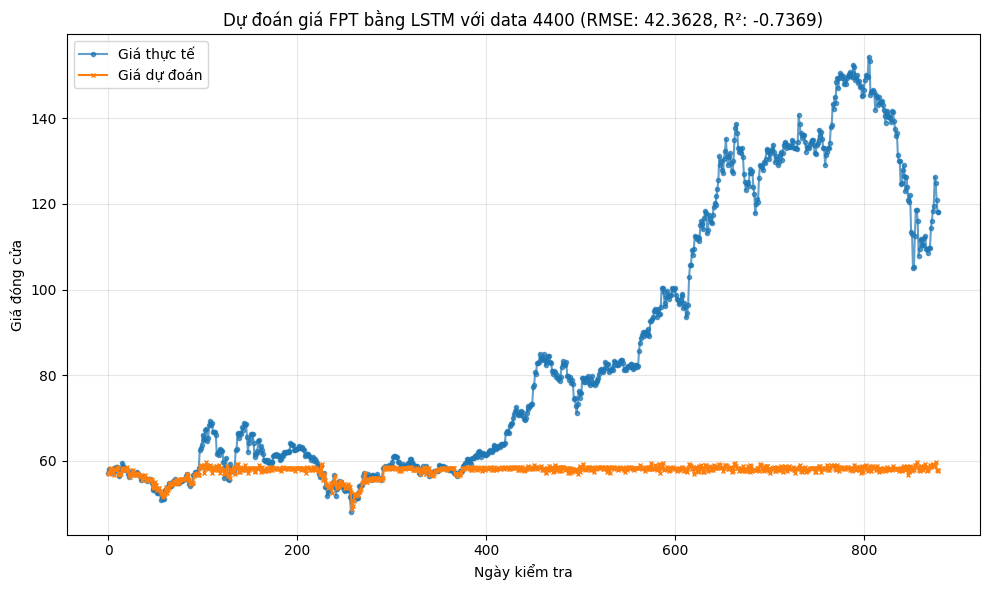

Hoàn thành: R² = -0.7369, RMSE = 42.3628
Đang xử lý với 4500 ngày dữ liệu...


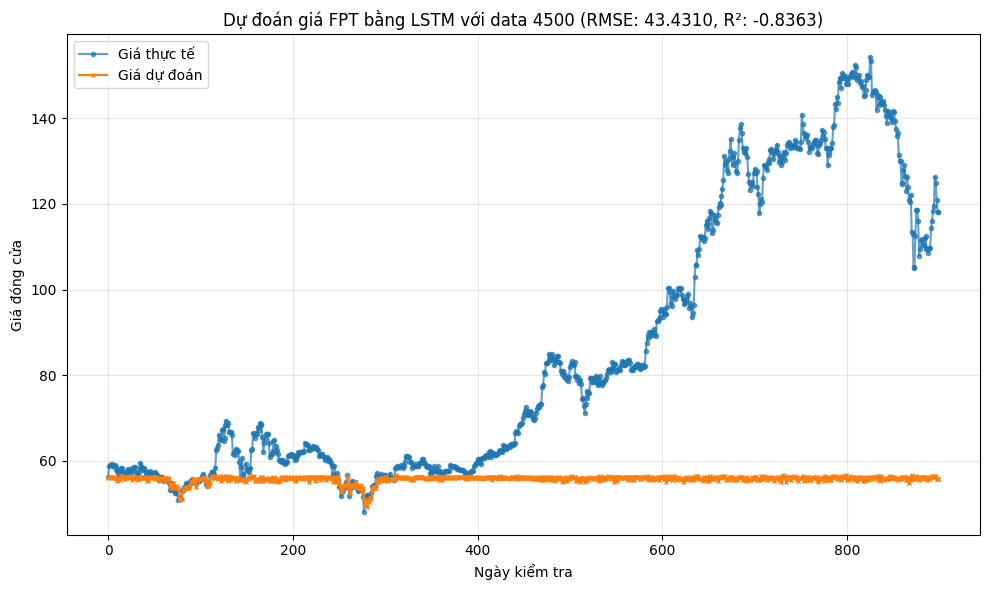

Hoàn thành: R² = -0.8363, RMSE = 43.4310


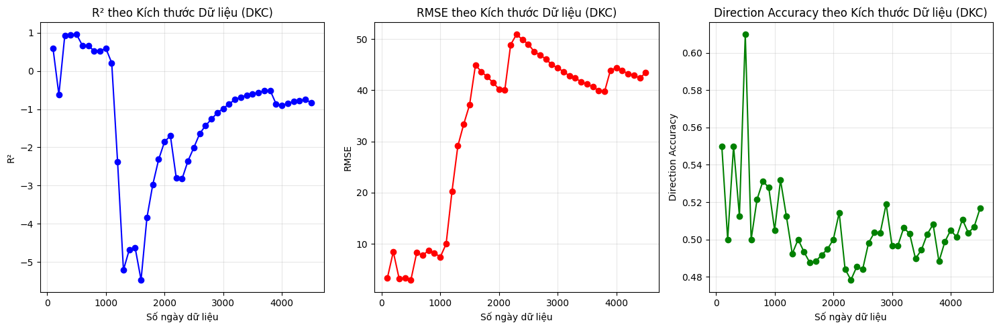

In [22]:
# Đọc dữ liệu
data_path = "E:/Project/StockVNQA_Lâm/train/data/FPT.csv"
df = pd.read_csv(data_path)
print(f"Tổng số ngày dữ liệu của DKC: {len(df)}")

# Khởi tạo danh sách kết quả
rs = []

# Chạy với các kích thước dữ liệu khác nhau
for i in range(100, len(df)+1, 100):
    print(f"Đang xử lý với {i} ngày dữ liệu...")
    result = train_with_data_size("FPT", num_days=i)
    if result is not None:  # Chỉ thêm vào khi kết quả không phải None
        rs.append(result)
        print(f"Hoàn thành: R² = {result['r2']:.4f}, RMSE = {result['rmse']:.4f}")

# Tạo DataFrame từ kết quả
if len(rs) == 0:
    print("Không có kết quả hợp lệ để hiển thị")
else:
    result_df = pd.DataFrame(rs)
    
    # Tạo figure trước khi vẽ subplots
    plt.figure(figsize=(15, 5))
    
    # Vẽ biểu đồ R² theo kích thước dữ liệu
    plt.subplot(1, 3, 1)
    plt.plot(result_df['data_days'], result_df['r2'], marker='o', linestyle='-', color='blue')
    plt.title('R² theo Kích thước Dữ liệu (DKC)', fontsize=12)
    plt.xlabel('Số ngày dữ liệu')
    plt.ylabel('R²')
    plt.grid(True, alpha=0.3)
    
    # Vẽ biểu đồ RMSE theo kích thước dữ liệu
    plt.subplot(1, 3, 2)
    plt.plot(result_df['data_days'], result_df['rmse'], marker='o', linestyle='-', color='red')
    plt.title('RMSE theo Kích thước Dữ liệu (DKC)', fontsize=12)
    plt.xlabel('Số ngày dữ liệu')
    plt.ylabel('RMSE')
    plt.grid(True, alpha=0.3)
    
    # Vẽ đồ thị Direction Accuracy theo số ngày
    plt.subplot(1, 3, 3)
    plt.plot(result_df['data_days'], result_df['direction_accuracy'], marker='o', linestyle='-', color='green')
    plt.title('Direction Accuracy theo Kích thước Dữ liệu (DKC)', fontsize=12)
    plt.xlabel('Số ngày dữ liệu')
    plt.ylabel('Direction Accuracy')
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()  # Tự động điều chỉnh layout
    
    # Lưu hình ảnh
    
    # Hiển thị biểu đồ
    plt.show()
    


TĂNG CƯỜNG MÔ HÌNH
1. CHUẨN HÓA (Standard Scaler)
2. Chỉnh sửa siêu tham số (HyperParameter)
3. Early Stopping

In [43]:
# ======= BƯỚC 1: IMPORT THƯ VIỆN =======
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler

# # ======= BƯỚC 2: ĐỌC FILE CSV =======
# df = pd.read_csv("E:/Project/StockVNQA_Lâm/train/data/ACB.csv")

# # ======= BƯỚC 3: TẠO FEATURES =======
# df['volatility'] = df['high'] - df['low']
# df['return_1d'] = df['close'].pct_change()
# df['ma5'] = df['close'].rolling(window=5).mean()
# df['ma10'] = df['close'].rolling(window=10).mean()
# df['volume_ma5'] = df['volume'].rolling(window=5).mean()
# df['volume_ratio'] = df['volume'] / df['volume_ma5']

# # ======= BƯỚC 4: TẠO TARGET =======
# df['target'] = df['close'].shift(-1)

# # ======= BƯỚC 5: XỬ LÝ DỮ LIỆU MẤT (NaN) =======
# df.dropna(inplace=True)

# # ======= BƯỚC 6: TÁCH DỮ LIỆU HUẤN LUYỆN =======
features = ['open', 'high', 'low', 'close', 'volume', 'volatility', 
           'return_1d', 'ma5', 'ma10', 'volume_ratio']

# Sắp xếp dữ liệu theo thời gian (nếu có cột date)
if 'date' in df.columns:
    df = df.sort_values('date')

# Chia dữ liệu thành 3 phần liên tiếp: train, validation, test
train_size = int(len(df) * 0.7)
val_size = int(len(df) * 0.15)

X = df[features]
y = df['target']

X_train = X.iloc[:train_size]
y_train = y.iloc[:train_size]

X_val = X.iloc[train_size:train_size+val_size]
y_val = y.iloc[train_size:train_size+val_size]

X_test = X.iloc[train_size+val_size:]
y_test = y.iloc[train_size+val_size:]

# Chuẩn hóa dữ liệu CHỈ dựa trên tập train
scaler = StandardScaler()
scaler.fit(X_train)

X_train_scaled = pd.DataFrame(scaler.transform(X_train), columns=features)
X_val_scaled = pd.DataFrame(scaler.transform(X_val), columns=features)
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=features)

# ======= BƯỚC 7A: TUNING HYPERPARAMETERS =======
from sklearn.model_selection import TimeSeriesSplit

# Thiết lập TimeSeriesSplit thay vì GridSearchCV thông thường
tscv = TimeSeriesSplit(n_splits=5)

# Tùy chỉnh tham số tìm kiếm để tránh overfitting
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [2, 3, 4],  # Giảm độ sâu tối đa
    'learning_rate': [0.01, 0.05],  # Giảm learning rate
    'subsample': [0.8, 0.9],
    'colsample_bytree': [0.8, 0.9],
    'min_child_weight': [1, 3, 5],  # Thêm tham số chống overfitting
    'gamma': [0, 0.1]  # Thêm gamma để kiểm soát overfitting
}

# Sử dụng TimeSeriesSplit trong GridSearchCV
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror'),
    param_grid=param_grid,
    cv=tscv,  # Sử dụng TimeSeriesSplit
    scoring='neg_mean_squared_error',
    verbose=1,
    n_jobs=-1
)

# Comment dòng này ra nếu muốn thực hiện grid search (có thể mất nhiều thời gian)
grid_search.fit(X_train_scaled, y_train)
best_params = grid_search.best_params_
print(f"Best parameters: {best_params}")




Fitting 5 folds for each of 288 candidates, totalling 1440 fits
Best parameters: {'colsample_bytree': 0.8, 'gamma': 0.1, 'learning_rate': 0.05, 'max_depth': 2, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.8}


[0]	validation_0-rmse:1.34821
[1]	validation_0-rmse:1.28958
[2]	validation_0-rmse:1.23957
[3]	validation_0-rmse:1.18823
[4]	validation_0-rmse:1.14071
[5]	validation_0-rmse:1.10065
[6]	validation_0-rmse:1.05621
[7]	validation_0-rmse:1.01464
[8]	validation_0-rmse:0.97340
[9]	validation_0-rmse:0.93783
[10]	validation_0-rmse:0.90030
[11]	validation_0-rmse:0.86748
[12]	validation_0-rmse:0.83256
[13]	validation_0-rmse:0.80259
[14]	validation_0-rmse:0.77019
[15]	validation_0-rmse:0.73887
[16]	validation_0-rmse:0.71256
[17]	validation_0-rmse:0.68604
[18]	validation_0-rmse:0.65719
[19]	validation_0-rmse:0.63468
[20]	validation_0-rmse:0.61190
[21]	validation_0-rmse:0.58806
[22]	validation_0-rmse:0.56718
[23]	validation_0-rmse:0.54867
[24]	validation_0-rmse:0.52864
[25]	validation_0-rmse:0.51268
[26]	validation_0-rmse:0.49659
[27]	validation_0-rmse:0.47829
[28]	validation_0-rmse:0.46271
[29]	validation_0-rmse:0.44812
[30]	validation_0-rmse:0.43611
[31]	validation_0-rmse:0.42433
[32]	validation_0-

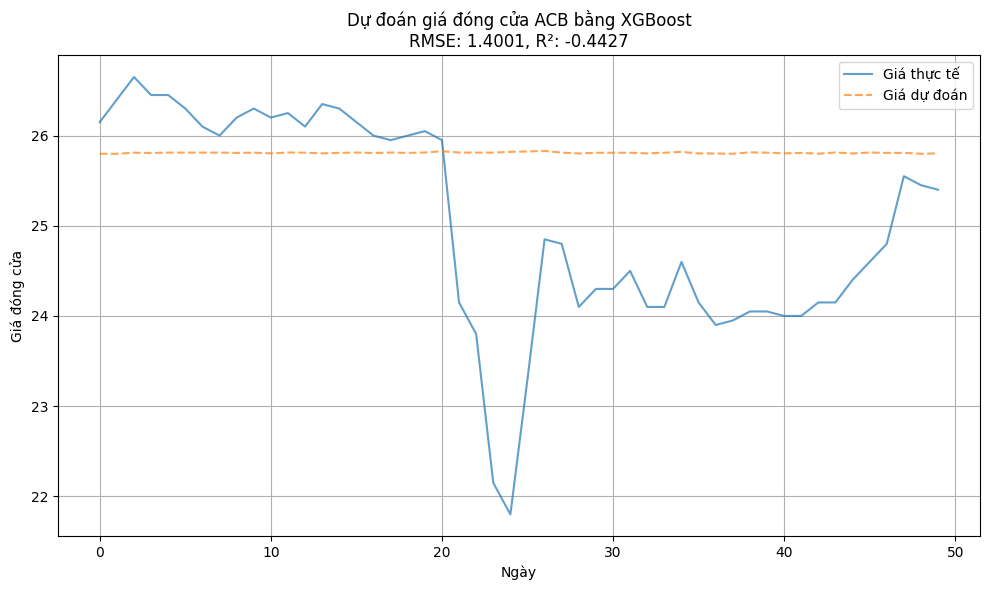

<Figure size 1000x600 with 0 Axes>

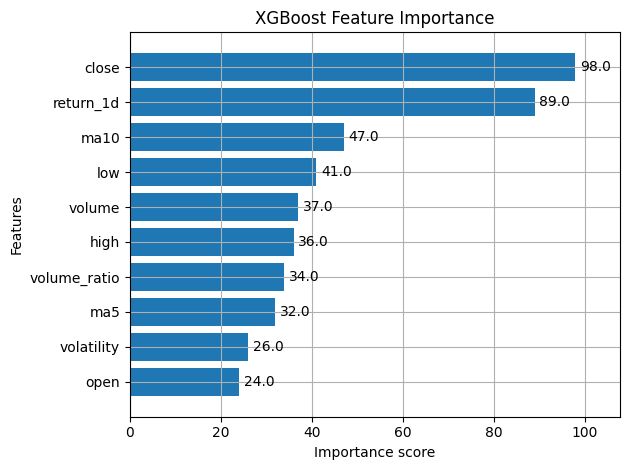


🎯 Giá đóng cửa cuối cùng: 25.45 VND
🎯 Dự đoán giá đóng cửa ACB ngày tiếp theo: 25.51 VND
🎯 Thay đổi dự kiến: 0.06 VND (0.25%)


In [44]:
# ======= BƯỚC 7B: HUẤN LUYỆN MÔ HÌNH XGBOOST VỚI EARLY STOPPING =======
# Tham số mẫu (thay bằng best_params nếu đã thực hiện grid search)
manual_params = {
    'n_estimators': 200, 
    'max_depth': 2, 
    'learning_rate': 0.05,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'min_child_weight': 1,
    'gamma': 0.1
}

# Khởi tạo và huấn luyện mô hình với early stopping
model = xgb.XGBRegressor(**best_params)

# Huấn luyện với early stopping
model.fit(
    X_train_scaled, y_train,
    eval_set=[(X_val_scaled, y_val)],
    verbose=True
)


# ======= BƯỚC 8: DỰ ĐOÁN & ĐÁNH GIÁ =======
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"✅ RMSE trên tập test: {rmse:.4f}")
print(f"✅ MAE trên tập test: {mae:.4f}")
print(f"✅ R² trên tập test: {r2:.4f}")

# ======= BƯỚC 9: VẼ BIỂU ĐỒ GIÁ DỰ ĐOÁN VS THỰC TẾ =======
plt.figure(figsize=(10, 6))
plt.plot(y_test.values, label='Giá thực tế', alpha=0.7)
plt.plot(y_pred, label='Giá dự đoán', alpha=0.7, linestyle='--')
plt.title(f'Dự đoán giá đóng cửa ACB bằng XGBoost\nRMSE: {rmse:.4f}, R²: {r2:.4f}')
plt.xlabel('Ngày')
plt.ylabel('Giá đóng cửa')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# ======= BƯỚC 10: XEM FEATURE IMPORTANCE =======
plt.figure(figsize=(10, 6))
xgb.plot_importance(model, height=0.8, max_num_features=10)
plt.title('XGBoost Feature Importance')
plt.tight_layout()
plt.show()

# ======= BƯỚC 11: DỰ ĐOÁN GIÁ NGÀY TIẾP THEO =======
# Lấy dữ liệu mới nhất 
latest = df.iloc[-1:].copy()[features]
# Chuẩn hóa dữ liệu mới
latest_scaled = scaler.transform(latest)
predicted_price_tomorrow = model.predict(latest_scaled)[0]

last_price = df['close'].iloc[-1]
price_change = predicted_price_tomorrow - last_price
price_change_pct = (price_change / last_price) * 100

print(f"\n🎯 Giá đóng cửa cuối cùng: {last_price:.2f} VND")
print(f"🎯 Dự đoán giá đóng cửa ACB ngày tiếp theo: {predicted_price_tomorrow:.2f} VND")
print(f"🎯 Thay đổi dự kiến: {price_change:.2f} VND ({price_change_pct:.2f}%)")

In [36]:
!pip install statsmodels

   ---------------------------------------- 0.0/9.8 MB ? eta -:--:--
   ------ --------------------------------- 1.6/9.8 MB 10.5 MB/s eta 0:00:01
   ---------------- ----------------------- 3.9/9.8 MB 11.2 MB/s eta 0:00:01
   ------------------------- -------------- 6.3/9.8 MB 11.4 MB/s eta 0:00:01
   ----------------------------------- ---- 8.7/9.8 MB 11.4 MB/s eta 0:00:01
   ---------------------------------------- 9.8/9.8 MB 11.3 MB/s eta 0:00:00

   -------------------- ------------------- 1/2 [statsmodels]
   -------------------- ------------------- 1/2 [statsmodels]
   -------------------- ------------------- 1/2 [statsmodels]
   -------------------- ------------------- 1/2 [statsmodels]
   -------------------- ------------------- 1/2 [statsmodels]
   -------------------- ------------------- 1/2 [statsmodels]
   -------------------- ------------------- 1/2 [statsmodels]
   -------------------- ------------------- 1/2 [statsmodels]
   -------------------- ------------------- 1/2 [

In [19]:
# Kiểm tra tính ngẫu nhiên của giá
from statsmodels.stats.stattools import jarque_bera
_, p_value, _, _ = jarque_bera(df['close'].pct_change().dropna())
print(f"Jarque-Bera p-value: {p_value:.4f}")  # Nếu < 0.05, chuỗi không tuân theo phân phối chuẩn


Jarque-Bera p-value: 0.0000
